### Financial Instruments Assignment


In the code below you have examples on how to download to types of Datasets regarding Financial Instruments:

- the tickers dataset represents summary information about various active financial instruments
- the price data which can be downloaded on a instrument by instrument basis containing all of the historical daily prices of a particular instrument


**The Tasks are describe at the bottom of the file, along with the evaluation criteria at the end. Please read them carefully to understand what is asked of you and how your solution will be judged.**

In [113]:
!pip install --upgrade ta


  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29422 sha256=bbaeadf7df51f8b48baf7cf24040df7bf2bfd07edb69bc9600797461998c52bc
  Stored in directory: c:\users\user\appdata\local\pip\cache\wheels\a1\d7\29\7781cc5eb9a3659d032d7d15bdd0f49d07d2b24fec29f44bc4
Successfully built ta


In [1]:
import csv
from itertools import combinations


import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import yfinance as yf

## Tickers Dataset

In [2]:
CSV_URL = 'https://www.alphavantage.co/query?function=LISTING_STATUS&apikey=demo'

def get_tickers():
  with requests.Session() as s:
      download = s.get(CSV_URL)
      decoded_content = download.content.decode('utf-8')
      cr = csv.reader(decoded_content.splitlines(), delimiter=',')
      tickers_list = list(cr)
      tickers_df = pd.DataFrame(tickers_list[1:], columns=tickers_list[0])
  return tickers_df
tickers_df = get_tickers()
tickers_df

,symbol,name,exchange,assetType,ipoDate,delistingDate,status
0,A,Agilent Technologies Inc,NYSE,Stock,1999-11-18,null,Active
1,AA,Alcoa Corp,NYSE,Stock,2016-10-18,null,Active
2,AAA,AXS First Priority CLO Bond ETF,NYSE ARCA,ETF,2020-09-09,null,Active
3,AAAU,Goldman Sachs Physical Gold ETF,BATS,ETF,2018-08-15,null,Active
4,AACG,ATA Creativity Global,NASDAQ,Stock,2008-01-29,null,Active
...,...,...,...,...,...,...,...
11635,ZYNE,Zynerba Pharmaceuticals Inc,NASDAQ,Stock,2015-08-05,null,Active
11636,ZYRX,Global Earnings Capital Ltd,NASDAQ,Stock,2007-07-13,null,Active
11637,ZYXI,Zynex Inc,NASDAQ,Stock,2012-07-23,null,Active
11638,ZZK,,NYSE ARCA,Stock,2020-07-22,null,Active


In [3]:
tickers_df[
    (tickers_df.assetType == "ETF")
     & (tickers_df.ipoDate > '1990-01-01')
     & (tickers_df.ipoDate < '2000-01-01')
]

,symbol,name,exchange,assetType,ipoDate,delistingDate,status
943,AWF,AllianceBernstein Global High Income Fund Inc,NYSE,ETF,1993-07-29,null,Active
1059,BBH,VanEck Biotech ETF,NASDAQ,ETF,1999-11-23,null,Active
1328,BKN,BlackRock Investment Quality Municipal Trust,NYSE,ETF,1993-02-23,null,Active
1620,BTO,John Hancock Financial Opportunities Fund,NYSE,ETF,1994-08-17,null,Active
1897,CEE,Central and Eastern Europe Fund Inc (The),NYSE,ETF,1990-02-28,null,Active
...,...,...,...,...,...,...,...
11420,XLK,Technology Select Sector SPDR ETF,NYSE ARCA,ETF,1998-12-22,null,Active
11422,XLP,Consumer Staples Select Sector SPDR,NYSE ARCA,ETF,1998-12-22,null,Active
11425,XLU,Utilities Select Sector SPDR ETF,NYSE ARCA,ETF,1998-12-22,null,Active
11426,XLV,Health Care Select Sector SPDR,NYSE ARCA,ETF,1998-12-22,null,Active


In [4]:
tickers_df[tickers_df.symbol.isin(["SPY","QQQ", "ARKK", "ARKW"])]

,symbol,name,exchange,assetType,ipoDate,delistingDate,status
695,ARKK,ARK INNOVATION ETF,NYSE ARCA,ETF,2014-10-31,null,Active
699,ARKW,ARK NEXT GENERATION INTERNET ETF,NYSE ARCA,ETF,2014-09-30,null,Active
8611,QQQ,Invesco QQQ Trust Series 1,NASDAQ,ETF,1999-03-10,null,Active
9776,SPY,SPDR S&P 500 ETF Trust,NYSE ARCA,ETF,1993-01-29,null,Active


## Price Data

In [5]:


# Define the stock symbol and the date range
instrument_symbol = "MSFT"

# Use yfinance to fetch the instrument data
instrument_data = yf.download(instrument_symbol)#, start=start_date, end=end_date)

### Add Indicators
instrument_data['SMA_20'] = instrument_data['Close'].rolling(window=20).mean()
instrument_data['SMA_50'] = instrument_data['Close'].rolling(window=50).mean()
instrument_data['SMA_100'] = instrument_data['Close'].rolling(window=100).mean()
instrument_data['SMA_200'] = instrument_data['Close'].rolling(window=200).mean()

### Calculate future Percentage returns ###
# Define time intervals in days

interval_cols = []
interval_perc_cols = []

# Create additional columns for future Close prices
interval = 180
column_name = f'Close_{interval}d_future'
interval_cols.append(column_name)
instrument_data[column_name] = instrument_data['Close'].shift(-interval)

column_name_perc_diff = f"Close_{interval}d_future_Percentage_Return"
interval_perc_cols.append(column_name_perc_diff)
instrument_data[column_name_perc_diff] = (
    (instrument_data[column_name] - instrument_data['Close']) / instrument_data['Close']
) * 100

### Calculate Percentage differences between indicators ###
# Define the list of columns
columns = ['Close', 'SMA_20', 'SMA_200']

# Generate a list of tuples combining each pair of elements
pairs = list(combinations(columns, 2))
perc_cols = []

### Create new features by calculating the percentage difference
for pair in pairs:
    col1, col2 = pair
    new_feature_name = f"{col1}_{col2}_PercentageDiff"
    perc_cols.append(new_feature_name)
    instrument_data[new_feature_name] = (
        (instrument_data[col1] - instrument_data[col2]) / instrument_data[col2]
    ) * 100



# Display the instrument_data
display(instrument_data)

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume,SMA_20,SMA_50,SMA_100,SMA_200,Close_180d_future,Close_180d_future_Percentage_Return,Close_SMA_20_PercentageDiff,Close_SMA_200_PercentageDiff,SMA_20_SMA_200_PercentageDiff
Date,,,,,,,,,,,,,,,
1986-03-13,0.088542,0.101563,0.088542,0.097222,0.060274,1031788800,NaN,NaN,NaN,NaN,0.175347,80.357326,NaN,NaN,NaN
1986-03-14,0.097222,0.102431,0.097222,0.100694,0.062427,308160000,NaN,NaN,NaN,NaN,0.172743,71.552418,NaN,NaN,NaN
1986-03-17,0.100694,0.103299,0.100694,0.102431,0.063503,133171200,NaN,NaN,NaN,NaN,0.169271,65.253691,NaN,NaN,NaN
1986-03-18,0.102431,0.103299,0.098958,0.099826,0.061889,67766400,NaN,NaN,NaN,NaN,0.170139,70.435557,NaN,NaN,NaN
1986-03-19,0.099826,0.100694,0.097222,0.098090,0.060812,47894400,NaN,NaN,NaN,NaN,0.168837,72.124575,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-22,373.679993,375.179993,372.709991,374.579987,374.579987,17091100,373.529001,360.019802,342.437702,327.690601,NaN,NaN,0.281367,14.309042,13.988317
2023-12-26,375.000000,376.940002,373.500000,374.660004,374.660004,12673100,373.331502,360.958402,342.917702,328.320951,NaN,NaN,0.355850,14.113949,13.709314
2023-12-27,373.690002,375.059998,372.809998,374.070007,374.070007,14905400,372.900002,361.787002,343.380602,328.921701,NaN,NaN,0.313759,13.726156,13.370447


### Calculate Correlation

The following code shows how you can calculate the correlation for the example instrument data downloaded above against one of the indicators.

The Correlation is almost 0.2

In [6]:
corr_df = instrument_data[
    ["Close_180d_future_Percentage_Return", "SMA_20_SMA_200_PercentageDiff"]
].corr()
corr_df.at["Close_180d_future_Percentage_Return", "SMA_20_SMA_200_PercentageDiff"]
corr_df

,Close_180d_future_Percentage_Return,SMA_20_SMA_200_PercentageDiff
Close_180d_future_Percentage_Return,1.000000,0.193322
SMA_20_SMA_200_PercentageDiff,0.193322,1.000000


## TASK 1. Correlations Calculations and Analysis

Based on the examples shown above, calculate the correlations for


1.   The oldest 10 instruments in the ticker data having the `assetType` = "stock". HINT: use the `ipoDate`. Please show which instrument are part of this group before calculating the correlations.
2.   All the instruments with `assetType` = "ETF" with IPO dates in the 90s (between 1990 and 2000)
3.   All the instruments with `assetType` = "ETF" with IPO dates in the year 2014 (between Jan 1st and Dec 31st)
4.   **Strech GOAL**: all the instruments in the tickers dataset!

**N.B:** *For all the above, once you calculate the correlation and display them, try to show/plot/describe their distribution. Write down any insights you might haves*



# ---------------------------------------------------------------------------------------
# START of SOLUTION

## How to run this notebook

All of the libraries used in this notebook should already be installed. If you find that one library is missing, you can just use the code below, with numpy replaced with your specific library. I will include a code cell that installs all of the libraries required a bit below. If you run that cell, all dependencies should be installed in one shot (you might have to wait a bit before they are all installed though!).

`!pip install numpy`

#### Run the cell below if you need to install all dependencies! If not, SKIP it!




In [7]:
!pip install numpy
!pip install matplotlib
!pip install pandas
!pip install yfinance
!pip install -U scikit-learn
!pip install mplfinance
!pip install SciPy
!pip install numba
!pip install plotly

!pip install --upgrade ta


# Domain knowledge for this specific problem

## Correlation

The correlation between `Close_180d_future_Percentage_Return` and `SMA_20_SMA_200_PercentageDiff` describes the relationship between the future percentage returns of a financial instrument's closing prices and the percentage difference between it's short-term and long-term averages.

 **Close Future Percentage Return** - refers to the percentage change in the closing price of the financial instrument over a specified time period of 180 days.
 
 **SMA or Simple Moving Average** - in this case, the variable involves calculating the percentage difference between a 20-day Simple Moving Average and a 200-day SMA.

## Interpretation
* A positive correlation suggests that when there is a significant difference between the 20-day SMA and the 200-day SMA (either positive or negative), there is a tendency for the closing price to experience a positive (or negative) percentage return over the subsequent 180 days.
* A negative correlation indicates that as the 20-day SMA deviates from the 200-day SMA, the future percentage return tends to move in the opposite direction.
* A correlation close to zero suggests that there may not be a clear linear relationship between the future percentage return and the percentage difference in the moving averages.


## Stock market Patterns
Stock market patterns are visual representations of historical price movements that traders use to make predictions about future price movements. These patterns are formed by the recurring behavior of market participants, and they are often used in technical analysis to make trading decisions. Here are some common stock market patterns:

### Head and Shoulders

**Description**: This pattern consists of three peaks – a higher peak (head) between two lower peaks (shoulders). It indicates a potential trend reversal from bullish to bearish or vice versa.

**Signal**: A break below the neckline after the formation of the right shoulder suggests a potential downtrend, while a break above the neckline suggests a potential uptrend.

### Double Top and Double Bottom

**Double Top Description**: Formed after an uptrend, it consists of two peaks at approximately the same price level. It signals a potential reversal to a downtrend.

**Signal**: A break below the support level confirms the reversal.

**Double Bottom Description**: Formed after a downtrend, it consists of two troughs at approximately the same price level. It signals a potential reversal to an uptrend.

**Signal**: A break above the resistance level confirms the reversal.
### Ascending Triangle:
**Description**: The price forms a horizontal resistance level and an ascending trendline as support. It suggests a potential bullish continuation.

**Signal**: A breakout above the resistance level indicates a potential uptrend.

### Descending Triangle
**Description**: The price forms a horizontal support level and a descending trendline as resistance. It suggests a potential bearish continuation.

**Signal**: A breakout below the support level indicates a potential downtrend.

# Task 1 Solution

## Task 1.1.

1. The oldest 10 instruments in the ticker data having the assetType = "stock". HINT: use the ipoDate. Please show which instrument are part of this group before calculating the correlations.

For this task, I first need to get all of the samples from the `assetType` column that have the value `stock`. After that, I will use the pandas library's `sort_values` method to sort the stocks by the `ipoDate`.

In [8]:
stock_only = tickers_df[
    (tickers_df.assetType == "Stock")
]
stock_only.tail(10)

,symbol,name,exchange,assetType,ipoDate,delistingDate,status
11629,ZVZZT,NASDAQ TEST STOCK,NASDAQ,Stock,2017-09-22,null,Active
11630,ZWS,Zurn Elkay Water Solutions Corp,NYSE,Stock,2012-03-29,null,Active
11631,ZWZZT,NASDAQ TEST STOCK,NASDAQ,Stock,2017-09-22,null,Active
11632,ZXYZ-A,NASDAQ SYMBOLOGY TEST,NASDAQ,Stock,2016-01-19,null,Active
11633,ZXZZT,NASDAQ TEST STOCK,NASDAQ,Stock,2006-07-10,null,Active
11634,ZYME,Zymeworks BC Inc,NASDAQ,Stock,2017-04-28,null,Active
11635,ZYNE,Zynerba Pharmaceuticals Inc,NASDAQ,Stock,2015-08-05,null,Active
11636,ZYRX,Global Earnings Capital Ltd,NASDAQ,Stock,2007-07-13,null,Active
11637,ZYXI,Zynex Inc,NASDAQ,Stock,2012-07-23,null,Active
11638,ZZK,,NYSE ARCA,Stock,2020-07-22,null,Active


 Now that I've extracted only the samples having the assetType set as `Stock`, I can sort them. I want for the values to be sorted from the most recent (newest) to the oldest. To do that, I will set `ascending` as `False`, and then use the `.tail(10)` method to extract the oldest 10 stocks.
 **The oldest 10 stocks will be stored in a new variable called `oldest_10`, which will be used to find the correlation.**

In [9]:
stock_only = stock_only.sort_values(by=['ipoDate'],ascending=False)
oldest_10 = stock_only.tail(10)
oldest_10

,symbol,name,exchange,assetType,ipoDate,delistingDate,status
8087,PG,Procter & Gamble Company,NYSE,Stock,1970-01-02,null,Active
5195,IBM,International Business Machines Corp,NYSE,Stock,1962-01-02,null,Active
4999,HPQ,HP Inc,NYSE,Stock,1962-01-02,null,Active
6061,KO,Coca-Cola Company,NYSE,Stock,1962-01-02,null,Active
2672,DD,DuPont de Nemours Inc,NYSE,Stock,1962-01-02,null,Active
5097,HWM,Howmet Aerospace Inc,NYSE,Stock,1962-01-02,null,Active
983,BA,Boeing Company,NYSE,Stock,1962-01-02,null,Active
2812,DIS,Walt Disney Co (The),NYSE,Stock,1962-01-02,null,Active
1787,CAT,Caterpillar Inc,NYSE,Stock,1962-01-02,null,Active
4352,GE,General Electric Company,NYSE,Stock,1962-01-02,null,Active


Now that I have the instruments(stocks) I need to find correlation on, I will create a function that I can easily iterate for all of the stocks, using the code provided above.

To do that, I need to create a Global Variable, called `corelations_oldest_10`, which will store the correlation value for each stock ticker. This is because everything inside of a function is lost - so I need to store it globally (thus, it won't be removed).

In [10]:

def get_instrument_data(symbol):
    # Define the stock symbol and the date range
    instrument_symbol = symbol
    instrument_symbol = str(instrument_symbol)
    
    # Use yfinance to fetch the instrument data
    instrument_data = yf.download(instrument_symbol)#, start=start_date, end=end_date)
    
    ### Add Indicators
    instrument_data['SMA_20'] = instrument_data['Close'].rolling(window=20).mean()
    instrument_data['SMA_50'] = instrument_data['Close'].rolling(window=50).mean()
    instrument_data['SMA_100'] = instrument_data['Close'].rolling(window=100).mean()
    instrument_data['SMA_200'] = instrument_data['Close'].rolling(window=200).mean()
    
    ### Calculate future Percentage returns ###
    # Define time intervals in days
    
    interval_cols = []
    interval_perc_cols = []
    
    # Create additional columns for future Close prices
    interval = 180
    column_name = f'Close_{interval}d_future'
    interval_cols.append(column_name)
    instrument_data[column_name] = instrument_data['Close'].shift(-interval)
    
    column_name_perc_diff = f"Close_{interval}d_future_Percentage_Return"
    interval_perc_cols.append(column_name_perc_diff)
    instrument_data[column_name_perc_diff] = (
        (instrument_data[column_name] - instrument_data['Close']) / instrument_data['Close']
    ) * 100
    
    ### Calculate Percentage differences between indicators ###
    # Define the list of columns
    columns = ['Close', 'SMA_20', 'SMA_200']
    
    # Generate a list of tuples combining each pair of elements
    pairs = list(combinations(columns, 2))
    perc_cols = []
    
    ### Create new features by calculating the percentage difference
    for pair in pairs:
        col1, col2 = pair
        new_feature_name = f"{col1}_{col2}_PercentageDiff"
        perc_cols.append(new_feature_name)
        instrument_data[new_feature_name] = (
            (instrument_data[col1] - instrument_data[col2]) / instrument_data[col2]
        ) * 100
    
    
    
    # Display the instrument_data 
    #display(instrument_data)
    # Code to get Correlations inside the Global variable corelations_oldest_10
    corr_df = instrument_data[["Close_180d_future_Percentage_Return", "SMA_20_SMA_200_PercentageDiff"]].corr()
    corr_df.at["Close_180d_future_Percentage_Return", "SMA_20_SMA_200_PercentageDiff"]
    #add the correlation for a stock symbol in the dictionary
    return corr_df.at["Close_180d_future_Percentage_Return", "SMA_20_SMA_200_PercentageDiff"]

Now, let's calculate the correlation for each of the top 10 oldest stocks, by getting their data and then finding out the correlation, using the code provided. I added the code to calculate the correlation inside of the function above, and stored the calculated correlation in the glbal variable `corelations_oldest_10`, whick is a dictionary. I will do this in one-shot, using a loop.

In [11]:
corelations_oldest_10={}
import time
for stock in oldest_10['symbol']:
    corelations_oldest_10[stock] = get_instrument_data(stock)
    #time.sleep(0.5) #added just to be sure

  

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


That is done! I calculated the correlations for every stock, after extracting each of its data. Now we can print the values for every stock, by iterating the global dictionary variable `corelations_oldest_10`. Let's see the values!


In [12]:
for stock in corelations_oldest_10:
    print(" The correlation for", stock, "is ->>> ",corelations_oldest_10[stock])

 The correlation for PG is ->>>  -0.010996198913364022
 The correlation for IBM is ->>>  0.051986175233303414
 The correlation for HPQ is ->>>  -0.03853261610728142
 The correlation for KO is ->>>  0.05279102025613182
 The correlation for DD is ->>>  -0.23010676760587626
 The correlation for HWM is ->>>  -0.5888286169457662
 The correlation for BA is ->>>  -0.011464658195677584
 The correlation for DIS is ->>>  -0.08516405331739785
 The correlation for CAT is ->>>  -0.1387398974139393
 The correlation for GE is ->>>  -0.030314503404753997


Now let's plot a histogram of all of the correlations, and see what we can deduce from it.

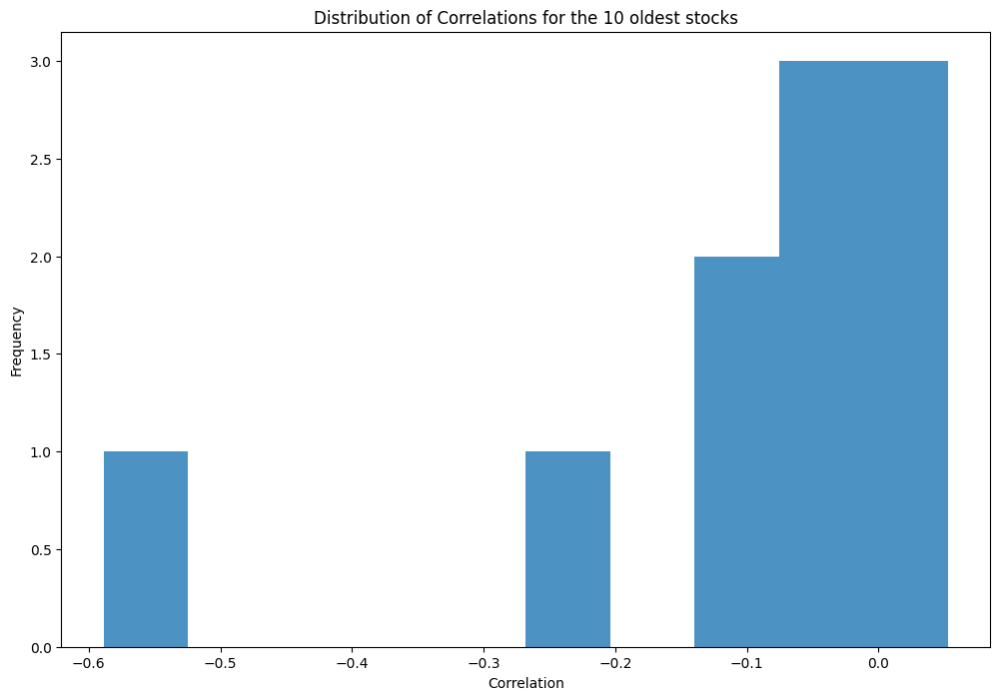

In [13]:
plt.figure(figsize=(12, 8))
plt.hist(corelations_oldest_10.values(), bins=10, alpha=0.8, label='Oldest 10 Stock Instruments')
plt.xlabel('Correlation')
plt.ylabel('Frequency')
plt.title('Distribution of Correlations for the 10 oldest stocks')
plt.show()


From the plot above we can conclude several things, such as:

1. When it comes to the strength of correlations,the correlation values range from -0.5897 to 0.0526. A correlation close to -1 usually indicates a strong negative relationship, while a correlation close to 1 indicates a strong positive relationship. In our case most correlations are negative.
2. When we talk about the direction of the correlations, most of the correlations are negative, suggesting an inverse linear relationship.  The strongest negative correlation is observed for HWM ticker stock, indicating a relatively strong linear relationship, of negative value - meaning that when one variable goes up, the other goes down.
3. We can also notice among these stocks that there is mostly a very weak and rare positive correlation. IBM and KO have positive correlations, but the values are close to zero. This suggests a weak positive relationship and weak linearity, which translates in a slight positive association between its future returns and the percentage difference in its moving averages.
4. When it comes to stock market theory, generally, negatively correlated assets are used to achieve potential diversification. Stocks with strong negative correlations may help reduce overall portfolio risk. ([Based on this](https://www.investopedia.com/articles/financial-theory/09/uncorrelated-assets-diversification.asp))
5. The strongest correlation can be seen in the `HWM` stock ticker(-0.58), and it stands out with a notably strong negative correlation, implying that it may act as a good diversifier in a portfolio. It also implies that a linear model could be used for performing prediction on this stock, due to the strong linearity. The second stock that has a somewhat more pronounced negative correlation is the DD stock. The other stocks have very weak correlations.
6.  Overall, the correlations are not extremely strong in either direction. This suggests that the selected stocks may not move in a highly coordinated manner, providing some diversification benefits.  This means `HWM` stands out with a strong negative correlation, suggesting a more pronounced impact of moving averages on its future returns. And `DD` is the second stock in terms of the negative correlation, and the impact of moving averages on its future returns.
7.   It's important to note that correlations can change over time, and these conclusions are based on the specified period on which it is calculated. If that period is changed, other results and insights may be visible.

WHen it comes to the interpretation of the histogram from a distribution point of view, we can see that:
1. The distribution shape is quite irregular, with most values between -0.1 and 0.1; this means that the peak frequency (mode) is between -0.1 and 0.1;
2. There are 2 outliers, the most important one being the `HWM` stock, having a strong negative correlation of -0.58. The second outlier is the `DD` stock with a value of -0.23; other than these 2 outliers, the spread of the values is pretty constant around -0.05.


## Task 1.2.
 2. (Calculate correlation for)All the instruments with assetType = "ETF" with IPO dates in the 90s (between 1990 and 2000).

To do this, we can use the function above, after extracting all of the required stocks we need. 

Let's do just that, and retrieve all of the needed stocks for solving this task - meaning stocks of type `ETF`, that IPOed between 1990 and 2000.

In [14]:
stocks_in_nineties =  tickers_df[(tickers_df['assetType'] == 'ETF') & (tickers_df['ipoDate'].between('1990-01-01', '2000-01-01'))]
stocks_in_nineties

,symbol,name,exchange,assetType,ipoDate,delistingDate,status
943,AWF,AllianceBernstein Global High Income Fund Inc,NYSE,ETF,1993-07-29,null,Active
1059,BBH,VanEck Biotech ETF,NASDAQ,ETF,1999-11-23,null,Active
1328,BKN,BlackRock Investment Quality Municipal Trust,NYSE,ETF,1993-02-23,null,Active
1620,BTO,John Hancock Financial Opportunities Fund,NYSE,ETF,1994-08-17,null,Active
1897,CEE,Central and Eastern Europe Fund Inc (The),NYSE,ETF,1990-02-28,null,Active
...,...,...,...,...,...,...,...
11420,XLK,Technology Select Sector SPDR ETF,NYSE ARCA,ETF,1998-12-22,null,Active
11422,XLP,Consumer Staples Select Sector SPDR,NYSE ARCA,ETF,1998-12-22,null,Active
11425,XLU,Utilities Select Sector SPDR ETF,NYSE ARCA,ETF,1998-12-22,null,Active
11426,XLV,Health Care Select Sector SPDR,NYSE ARCA,ETF,1998-12-22,null,Active


We can see that there are 123 stocks in that time period. Let's now slightly modify the function we used before, and extract the correlations for each of these stocks.

To do that, we only need to declare a new global variable called `correlations_90s`, and use the `get_instrument_data` function. Let's do just that.

In [15]:
correlations_90s = {} # Global variable that will store all correlations


We will perform another loop to extract the correlations. This time, however, we have a lot of stocks to extract correlations from.  I will use the variable I created before, which stores all of the stocks from the 90s, called `stocks_in_nineties`. We will iterate based on the `symbol` column.

In [16]:
for stock in stocks_in_nineties['symbol']:
    correlations_90s[stock] =get_instrument_data(stock)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['DDF']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******


1 Failed download:
['IRL']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['MNP']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******


1 Failed download:
['NSL']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['NUO']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******

***Note:*** Initially, I thought there was something wrong with my code, or that the code broke due having no pause between executions (requests). But apparently, the stocks it failed to retrieve are actually delisted. I will give the example of some of them from google, below:
1. "15 April 201  -
As of close of market today, Nutreco is delisted from the Euronext Amsterdam stock exchange following a takeover by SHV. Nutreco has been listed on the stock market for over 18 years under the ticker symbol NUO, with the initial public offering taking place on 3 June 1997"
2. "MNP was delisted after October 13, 2023. The latest closing stock price for Western Asset Municipal Partners Fund Inc. on October 13, 2023 is 10.58"
3. "Nsl Consol Def Set (delisted) stock quote and NSLDA charts. Latest stock price today and the US's most active stock market forums."

There are more, but I researched some of them, and indeed they were delisted. Some of them even in 2023. So that's why I can't retrieve their data. But everything is well, as most stocks were correctly extracted.

Let's see their correlations..

In [17]:
for element in correlations_90s:
    print("The correlation for stock ticker >>> ", element ," <<< is ->>> ", correlations_90s[element])

The correlation for stock ticker >>>  AWF  <<< is ->>>  -0.20160842308838237
The correlation for stock ticker >>>  BBH  <<< is ->>>  0.05287481259818639
The correlation for stock ticker >>>  BKN  <<< is ->>>  -0.06815244570284443
The correlation for stock ticker >>>  BTO  <<< is ->>>  0.0022258090993328137
The correlation for stock ticker >>>  CEE  <<< is ->>>  -0.1443124117801809
The correlation for stock ticker >>>  CEF  <<< is ->>>  -0.04429573369538372
The correlation for stock ticker >>>  CET  <<< is ->>>  -0.03089998919691046
The correlation for stock ticker >>>  CEV  <<< is ->>>  -0.21835512527016632
The correlation for stock ticker >>>  CHN  <<< is ->>>  -0.024052222164280213
The correlation for stock ticker >>>  CUBA  <<< is ->>>  -0.20556949852320228
The correlation for stock ticker >>>  DDF  <<< is ->>>  nan
The correlation for stock ticker >>>  DHF  <<< is ->>>  -0.07338284090017799
The correlation for stock ticker >>>  DHY  <<< is ->>>  -0.2580248412889377
The correlation 

The correlation for the other stocks of ETF type, from the 90's was successfully calculated, as can be seen above.

We can notice that the stocks that couldn't be retrieved have the value NaN. We could remove those NaN values. 

In [18]:
from math import isnan
# Remove NaN values from the dictionary
filtered_dict = {key: value for key, value in correlations_90s.items() if not isnan(value)}
filtered_dict


{'AWF': -0.20160842308838237,
 'BBH': 0.05287481259818639,
 'BKN': -0.06815244570284443,
 'BTO': 0.0022258090993328137,
 'CEE': -0.1443124117801809,
 'CEF': -0.04429573369538372,
 'CET': -0.03089998919691046,
 'CEV': -0.21835512527016632,
 'CHN': -0.024052222164280213,
 'CUBA': -0.20556949852320228,
 'DHF': -0.07338284090017799,
 'DHY': -0.2580248412889377,
 'DIA': -0.07541832226439574,
 'DMF': -0.09274847055303367,
 'DSM': -0.1400526243380622,
 'DSU': -0.22622713645440873,
 'DTF': -0.07586547497189727,
 'ECF': -0.05897960709909101,
 'EMF': -0.17644284813967026,
 'EVF': -0.10849926450846777,
 'EVN': -0.16837696595755894,
 'EWA': -0.2568334811840863,
 'EWC': -0.14569589041067202,
 'EWD': -0.03376238397264035,
 'EWG': -0.1277865064775153,
 'EWH': -0.16899521346199803,
 'EWI': -0.13754732879894896,
 'EWJ': 0.03473124586096558,
 'EWK': -0.1299291795373389,
 'EWL': -0.11674411688868043,
 'EWM': -0.05402006408433194,
 'EWN': -0.13826335180928018,
 'EWO': -0.14747680601711632,
 'EWP': -0.0947

Now that we have removed any NaN, we can plot a histogram of the correlations we managed to calculate. Let's see what insights we can find there!

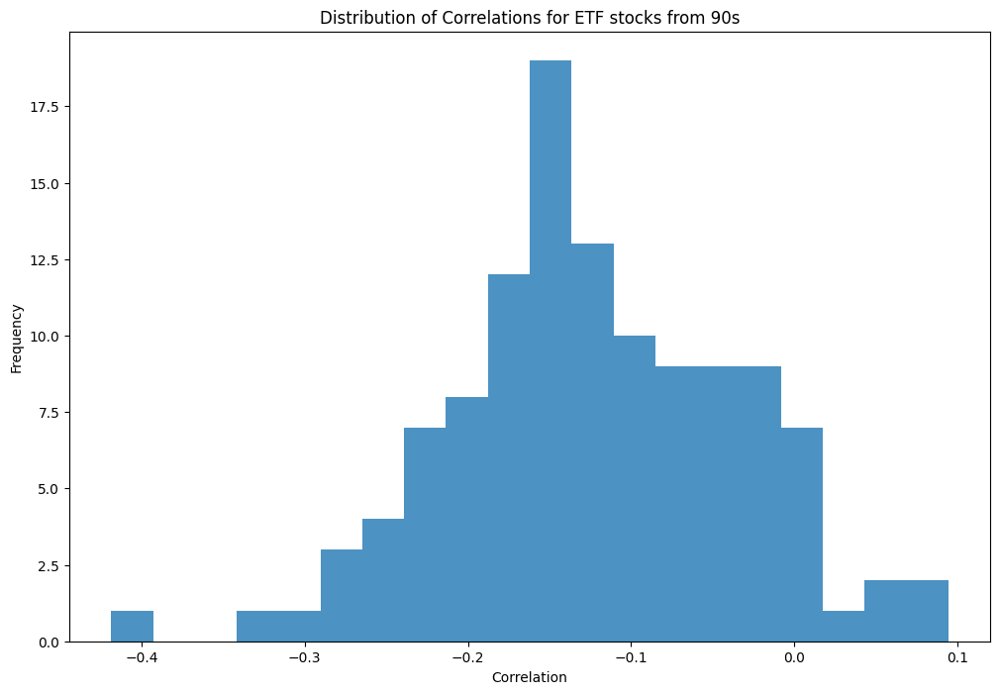

In [19]:
plt.figure(figsize=(12, 8))
plt.hist(filtered_dict.values(), bins=20, alpha=0.8, label='ALL ETF from 90s')
plt.xlabel('Correlation')
plt.ylabel('Frequency')
plt.title('Distribution of Correlations for ETF stocks from 90s')
plt.show()

## Interpreting the correlation distribution

For the stocks in the 90's, we can see a similar central tendency as the oldest 10 stocks we've seen before. We can also notice an almost normal distribution of these values, with a peak frequency of around -0.15, with a skew on the right side. Also, the outliers are stocks like GUT` and `NXN` which have a more significant negative correlation, of approx. -0.42, indicating a negative linear relationship.

The distribution of correlations is still close to zero, with a mixture of positive and negative values. However, there are more values in the negative zone, which indicates a reversed linearity for most stocks.

Most of the correlations are extremely weak and unfit for any linear modeling. 

However, some values have a stronger correlation, on the left (negative) side, having some values around -0.4. Some examples, which have the biggest values, are `GUT` and `NIM`, with a correlation of approx. -0.42.

`GUT`(-0.42), `NIM`(-0.29), and `VTN`(-0.26) have negative correlations, indicating potential inverse (negative) linear relationships with the market. These stocks might move in the opposite direction compared to the overall market. This means that when the market goes down, they may go up. When the market goes up they may go down.

`EWJ`(0.034), `QQQ`(0.04), and `SPY`(0.07) have positive correlations, suggesting that their price movements tend to align with the overall market. We may observe similar trends between these stocks and the market. When the market goes up, they go up. When it goes down, they go down.


## Task 1.3.
3. (calculate correlation for) All the instruments with assetType = "ETF" with IPO dates in the year 2014 (between Jan 1st and Dec 31st)

Let's first create the list of stocks that IPOed in 2014, just like before.

In [20]:
stocks_2014 =  tickers_df[(tickers_df['assetType'] == 'ETF') & (tickers_df['ipoDate'].between('2014-01-01', '2014-12-31'))]
stocks_2014

,symbol,name,exchange,assetType,ipoDate,delistingDate,status
341,AIRR,First Trust RBA American Industrial Renaissanc...,NASDAQ,ETF,2014-03-11,null,Active
526,AMZA,InfraCap MLP ETF 1.25x Shares,NYSE ARCA,ETF,2014-10-02,null,Active
694,ARKG,ARK GENOMIC REVOLUTION ETF,BATS,ETF,2014-10-31,null,Active
695,ARKK,ARK INNOVATION ETF,NYSE ARCA,ETF,2014-10-31,null,Active
697,ARKQ,ARK AUTONOMOUS TECHNOLOGY & ROBOTICS ETF,BATS,ETF,2014-09-30,null,Active
...,...,...,...,...,...,...,...
11080,VUSE,VIDENT U.S. EQUITY STRATEGY ETF,NYSE ARCA,ETF,2014-01-22,null,Active
11133,WBIF,WBI BULLBEAR VALUE 3000 ETF,NYSE ARCA,ETF,2014-08-27,null,Active
11134,WBIG,WBI BULLBEAR YIELD 3000 ETF,NYSE ARCA,ETF,2014-08-27,null,Active
11135,WBIL,WBI BULLBEAR QUALITY 3000 ETF,NYSE ARCA,ETF,2014-08-27,null,Active


We have a total of 109 stocks that IPOed in 2014. Quite a lot in one year, compared to the 90s!

Let's use the function to calculate the correlation for these stocks, and then loop through all of the stocks from the variable `stocks_2014`.

In [21]:
correlations_2014 = {} # Global variable that will store all correlations


In [22]:
for stock in stocks_2014['symbol']:
    correlations_2014[stock] = get_instrument_data(stock)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******


1 Failed download:
['GER']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******

Now let's take a look at the calculated correlations for the stocks that IPOed in 2014!

In [23]:
for element in correlations_2014:
    print("The correlation for stock ticker >>> ", element ," <<< is ->>> ", correlations_2014[element])

The correlation for stock ticker >>>  AIRR  <<< is ->>>  -0.25826430715891985
The correlation for stock ticker >>>  AMZA  <<< is ->>>  -0.194039564040551
The correlation for stock ticker >>>  ARKG  <<< is ->>>  0.22557410738588937
The correlation for stock ticker >>>  ARKK  <<< is ->>>  0.2387232316337284
The correlation for stock ticker >>>  ARKQ  <<< is ->>>  0.2207244767823888
The correlation for stock ticker >>>  ARKW  <<< is ->>>  0.24639410556565794
The correlation for stock ticker >>>  ASHS  <<< is ->>>  -0.34559302550249443
The correlation for stock ticker >>>  BBC  <<< is ->>>  0.06129119559755559
The correlation for stock ticker >>>  BBP  <<< is ->>>  -0.23376396814341438
The correlation for stock ticker >>>  BSCO  <<< is ->>>  -0.1608165510783105
The correlation for stock ticker >>>  BST  <<< is ->>>  0.20311425468149163
The correlation for stock ticker >>>  BYLD  <<< is ->>>  -0.031403110991408786
The correlation for stock ticker >>>  CBON  <<< is ->>>  -0.06500767606758052

Now we have the correlations, but we can see that some stocks from this list were also delisted. Let's remove the NaN values so we can plot the histogram right now.

In [24]:
from math import isnan
# Remove NaN values from the dictionary
filtered_dict_2014 = {key: value for key, value in correlations_2014.items() if not isnan(value)}
filtered_dict_2014

{'AIRR': -0.25826430715891985,
 'AMZA': -0.194039564040551,
 'ARKG': 0.22557410738588937,
 'ARKK': 0.2387232316337284,
 'ARKQ': 0.2207244767823888,
 'ARKW': 0.24639410556565794,
 'ASHS': -0.34559302550249443,
 'BBC': 0.06129119559755559,
 'BBP': -0.23376396814341438,
 'BSCO': -0.1608165510783105,
 'BST': 0.20311425468149163,
 'BYLD': -0.031403110991408786,
 'CBON': -0.06500767606758052,
 'CDC': 0.1778766025679711,
 'CFA': -0.21544716600772176,
 'CFO': 0.16955204728363515,
 'CIZ': -0.2451555867198039,
 'CN': -0.2235853534798709,
 'CNXT': -0.04677867343690717,
 'COMT': -0.15914320766803977,
 'CRBN': -0.14876761305979513,
 'CSF': 0.1146129312573697,
 'DAX': -0.2409475214467316,
 'DBAW': -0.10383949827243913,
 'DBEZ': -0.3544897477797073,
 'DDIV': -0.2922894079961365,
 'DEEP': -0.2652007663159443,
 'DGRO': -0.20843814255714485,
 'DIAX': -0.12707078334831085,
 'DWAT': -0.17125307436311932,
 'ECC': -0.32807930283449677,
 'EDOG': -0.27503568018356556,
 'EFAD': -0.23850253414616532,
 'EMQQ': 0

All NaN's were removed, let's create a histogram for the correlations, and interpret it.

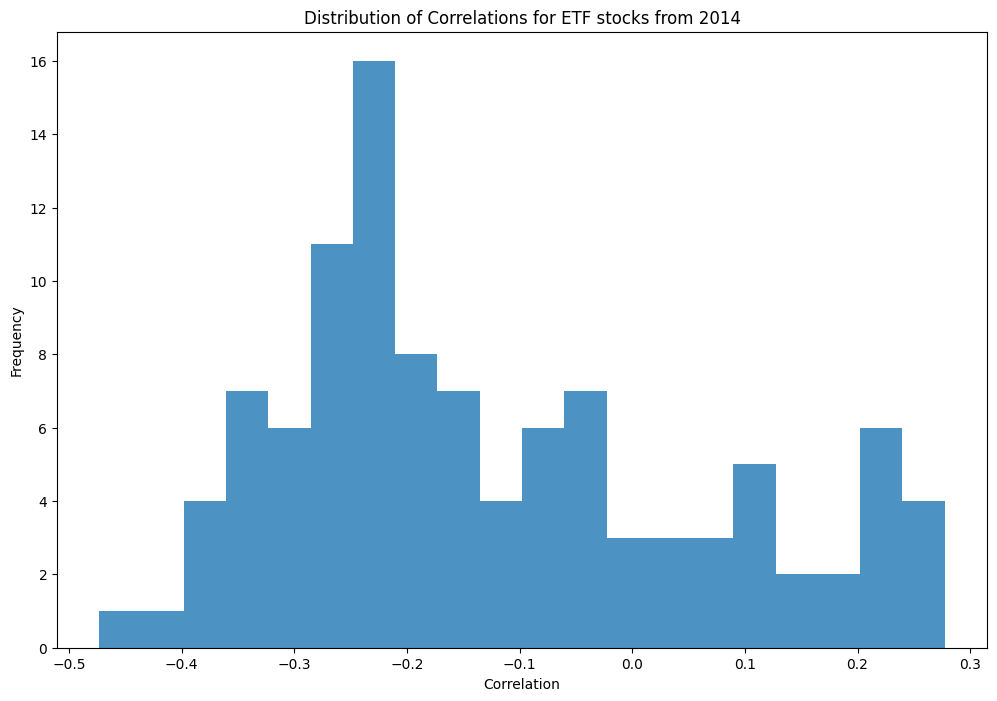

In [25]:
plt.figure(figsize=(12, 8))
plt.hist(filtered_dict_2014.values(), bins=20, alpha=0.8, label='ALL ETF from 2014')
plt.xlabel('Correlation')
plt.ylabel('Frequency')
plt.title('Distribution of Correlations for ETF stocks from 2014')
plt.show()

## Interpreting the correlation distribution

We can see similar things in this distribution, with the one for stocks in the 90s. One of them is that most values have a negative correlation. However, in this case, we can notice more positively correlated values, in the right skew of the distribution. Thus, the correlation values exhibit both stronger negative and positive correlations.

Also, the distribution of the correlation in 2014 is skewed to the right, in the positive area.

We can also notice in this distribution that we have a peak of frequency at approx -0.25, and we can also see an increase in correlation frequency in the positive values zone, between 0.20 and 0.28. The second zone (positive) could potentially still be considered an outlier zone, as the stocks there have a stronger positive correlation than what we've seen in the 90s stocks. This could also happen because the stocks from 2014 are very diversified, including stocks from a variety of sectors, such as technology, energy, biotech, finance, etc. 

Let's order the dictionary, and see the highest and lowest values.

In [26]:
sorted(filtered_dict_2014.items(), key=lambda x:x[1])


[('USFR', -0.473216659667115),
 ('SGDM', -0.402070566381381),
 ('SHYD', -0.3900788954681279),
 ('FTSM', -0.3854549649124845),
 ('FEMB', -0.38435467233204296),
 ('HEWG', -0.3710921485999788),
 ('DBEZ', -0.3544897477797073),
 ('HIE', -0.3515648800672888),
 ('FTHI', -0.35140684205175443),
 ('ASHS', -0.34559302550249443),
 ('ECC', -0.32807930283449677),
 ('EURL', -0.32625681118852773),
 ('REET', -0.3233963290183291),
 ('TOLZ', -0.32158941168460253),
 ('FPL', -0.30827988224515246),
 ('VRP', -0.3065500421613388),
 ('QEFA', -0.3007631430654266),
 ('DDIV', -0.2922894079961365),
 ('PDBC', -0.29124764092588173),
 ('IEUR', -0.2801153158760942),
 ('HEWJ', -0.2795256190397931),
 ('EDOG', -0.27503568018356556),
 ('LQDH', -0.2736243023867968),
 ('DEEP', -0.2652007663159443),
 ('AIRR', -0.25826430715891985),
 ('JGH', -0.25726479934221064),
 ('IPAC', -0.2538711850088216),
 ('FTLS', -0.25100280280556964),
 ('QWLD', -0.24883710318276192),
 ('EUDG', -0.2483265480302138),
 ('CIZ', -0.2451555867198039),
 ('

From above, we can notice that the 3 highest correlation values in the negative area are `USFR` with -0.47, `SGDM` with -0.40 and FTSM with -0.39. Thse 3 stocks stand out with a substantial negative correlation, indicating a potential inverse relationship with the market or benchmark, causing them to move opposite from market movement. 

When it comes to the highest positive correlation, the top 3 stocks are `LMBS` with 0.27, `MBSD` 0.26 and `WBIG` 0.25. They demonstrate notable positive correlations, suggesting a tendency to move in sync with the market.

We can conclude from this and the above histogram that in 2014 most correlations were negative, but, compared to the 90s stocks there are significantly more stocks that exhibit positive correlation.

## Stretch GOAL
* Strech GOAL: Correlation and insights for all the instruments in the tickers dataset!

Let's now see what the correlations for all stocks look like, and see what insights we can get from it.

This will probably take a while since we got 11586 stocks in total!

In [27]:
all_correlations = {} # Global variable that will store all correlations


In [28]:
#for stock in tickers_df['symbol']:
#   all_correlations[stock] = get_instrument_data(stock)

In [29]:
#all_correlations

That's a lot of stocks. Let's remove the NaN from the dictionary.

In [30]:
from math import isnan
# Remove NaN values from the dictionary
filtered_all_corr = {key: value for key, value in all_correlations.items() if not isnan(value)}
#filtered_all_corr

In [31]:
filtered_all_corr

{}

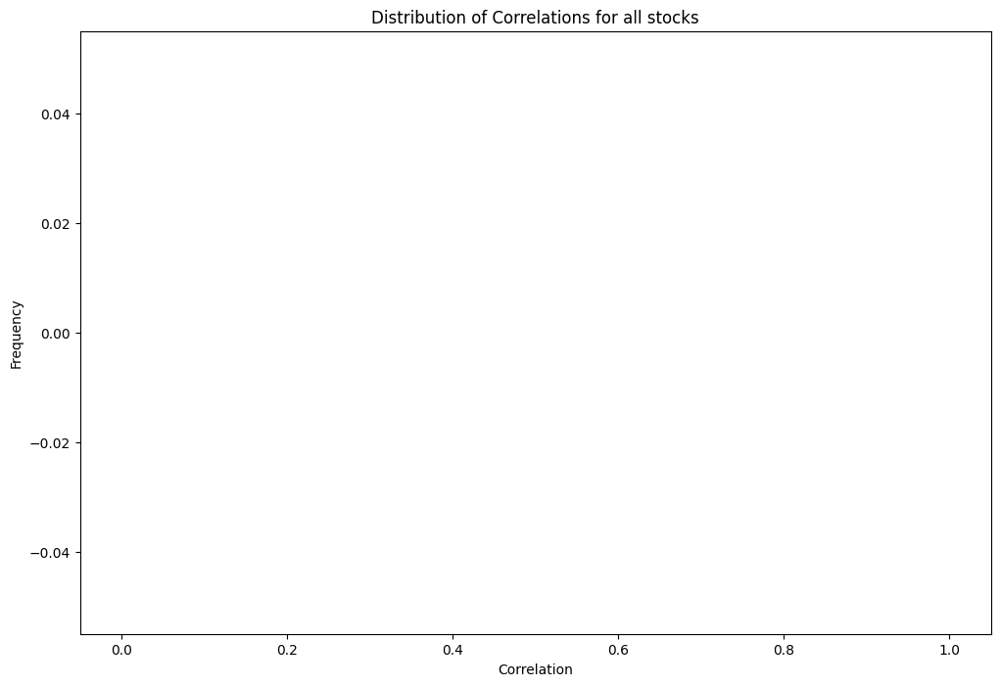

In [32]:
plt.figure(figsize=(12, 8))
plt.hist(filtered_all_corr.values(), bins=20, alpha=0.8, label='ALL stocks')
plt.xlabel('Correlation')
plt.ylabel('Frequency')
plt.title('Distribution of Correlations for all stocks')
plt.show()

We can notice a negative skewness (left skew) for the distribution of all of the stocks.  The distribution is also unimodal, having only one peak.

The central tendency of this distribution is around -0.25 and 0.00, which shows again a skeweness towards the negative side. However, it more closeley resembles a normal distribution, probably due to the high number of stocks.

Overall, the market tendency for all stocks is towards the negative side, as most stocks tend to have a negative correlation. We've seen hints of this in the previous distribution - but now it is clear that stocks tend to have a negative correlation in general.





## TASK 2. Chart Patters

In this exercise you will have to detect and draw what are called **chart patterns**.

Chart patterns are described on this page https://www.investopedia.com/articles/technical/112601.asp

It should help break down this problem into the following order (from simple to complex)

1. Trend and Horizonatal Lines
  - Trendline Support - DELL, TM, BILI
  - Trendline Resistance - NOK, CTVA
  - Horizontal Resistance, Support - NVS, DBX

2. Wedges, Triangles and Channels
  - Wedge - angled Up, angled Down or Horizontal - LLY, BILI
  - Triangle Ascending - ELV, ALVO
  - Triangle Descending - MPC, SQSP
  - Channel- angled Up, angled Down or Horizontal - MU, NOK, NVS, DBX, NVDA

3. **Strech GOAL** Complex patterns
  - Double Top - NFLX, YELP
  - Multiple Top - CPG, MAT
  - Double Bottom - JD, SJW
  - Multiple Bottom - SE, TIGO
  - Head&Shoulders - OHI, CYTK

You can use the tickers after to test your approach for data up to Dec 15th.

You can also have a look at these videos for an example solution however you might need to work out a  https://www.youtube.com/watch?v=wbFoefnidTU




In [33]:
#this code is obsolete/ will keep in case I need it.
def getdata(symbol):
    # Define the stock symbol and the date range
    instrument_symbol = symbol
    instrument_symbol = str(instrument_symbol)
    

    
    # Use yfinance to fetch the instrument data
    instrument_data = yf.download(instrument_symbol)#, start=start_date, end=end_date)
    
    ### Add Indicators
    instrument_data['SMA_20'] = instrument_data['Close'].rolling(window=20).mean()
    instrument_data['SMA_50'] = instrument_data['Close'].rolling(window=50).mean()
    instrument_data['SMA_100'] = instrument_data['Close'].rolling(window=100).mean()
    instrument_data['SMA_200'] = instrument_data['Close'].rolling(window=200).mean()
    
    ### Calculate future Percentage returns ###
    # Define time intervals in days
    
    interval_cols = []
    interval_perc_cols = []
    
    # Create additional columns for future Close prices
    interval = 180
    column_name = f'Close_{interval}d_future'
    interval_cols.append(column_name)
    instrument_data[column_name] = instrument_data['Close'].shift(-interval)
    
    column_name_perc_diff = f"Close_{interval}d_future_Percentage_Return"
    interval_perc_cols.append(column_name_perc_diff)
    instrument_data[column_name_perc_diff] = (
        (instrument_data[column_name] - instrument_data['Close']) / instrument_data['Close']
    ) * 100
    
    ### Calculate Percentage differences between indicators ###
    # Define the list of columns
    columns = ['Close', 'SMA_20', 'SMA_200']
    
    # Generate a list of tuples combining each pair of elements
    pairs = list(combinations(columns, 2))
    perc_cols = []
    
    ### Create new features by calculating the percentage difference
    for pair in pairs:
        col1, col2 = pair
        new_feature_name = f"{col1}_{col2}_PercentageDiff"
        perc_cols.append(new_feature_name)
        instrument_data[new_feature_name] = (
            (instrument_data[col1] - instrument_data[col2]) / instrument_data[col2]
        ) * 100
    
    
    
    # Display the instrument_data
    return instrument_data

# Task 2 Solution


#### Let's define a function that will get the stock market Data for 6 months, up until 15 of December! That means it starts in May 15, and ends in December 15. THis function can be seen below!

In [34]:
import matplotlib.dates as mpl_dates
def get_stock_price_6m(symbol):
  df = yf.download(symbol, start='2023-05-15', end ='2023-12-15',  threads= False) #change starting date if you want
  df['Date'] = pd.to_datetime(df.index)
  df['Date'] = df['Date'].apply(mpl_dates.date2num)
  df = df.loc[:,['Date', 'Open', 'High', 'Low', 'Close']]
  return df

Let's test the function to see if it works correctly, and if its of type Dataframe.

In [35]:
DELL_data=get_stock_price_6m('DELL')

[*********************100%%**********************]  1 of 1 completed


In [36]:
type(DELL_data)

pandas.core.frame.DataFrame

Works just fine. Now let's get the data for the stocks we need, using the same function, which will retrieve stock data of the past 6 months.

In [37]:
DELL_data = get_stock_price_6m('DELL')
TM_data = get_stock_price_6m('TM')
BILI_data = get_stock_price_6m('BILI')
NOK_data = get_stock_price_6m('NOK')
CTVA_data = get_stock_price_6m('CTVA')
NVS_data = get_stock_price_6m('NVS')
DBX_data = get_stock_price_6m('DBX')

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [38]:
DELL_data

,Date,Open,High,Low,Close
Date,,,,,
2023-05-15,19492.0,44.799999,45.000000,44.450001,44.930000
2023-05-16,19493.0,44.840000,46.130001,44.680000,45.380001
2023-05-17,19494.0,45.799999,46.169998,45.240002,45.849998
2023-05-18,19495.0,45.770000,47.310001,45.650002,47.119999
2023-05-19,19496.0,47.360001,48.189999,47.360001,47.750000
...,...,...,...,...,...
2023-12-08,19699.0,68.430000,69.309998,68.430000,68.699997
2023-12-11,19702.0,68.589996,69.760002,68.489998,69.239998
2023-12-12,19703.0,69.099998,70.309998,68.940002,69.989998


To run the code below, you need the mplfinance library. To install it, you can just de-comment the cell below,

In [39]:
#!pip install mplfinance

These are some function that will define and print the trendlines. I will use them for each stock.

We first need to check the trendline, by computing the sum of differences between the line and prices and  return negative val if invalid. We need to find the intercept of the line going through pivot point with given slope.

In [40]:

def check_trend_line(support: bool, pivot: int, slope: float, y: np.array):

    
    # Find the intercept 
    intercept = -slope * pivot + y[pivot]
    line_vals = slope * np.arange(len(y)) + intercept
     
    diffs = line_vals - y
    
    # Check to see if the line is valid, return -1 if it is not valid.
    if support and diffs.max() > 1e-5:
        return -1.0
    elif not support and diffs.min() < -1e-5:
        return -1.0

    # Squared sum of diffs between data and line 
    err = (diffs ** 2.0).sum()
    return err;


def optimize_slope(support: bool, pivot:int , init_slope: float, y: np.array):
    
    # Amount to change slope by. Multiplyed by opt_step
    slope_unit = (y.max() - y.min()) / len(y) 
    
    # Optmization variables
    opt_step = 1.0
    min_step = 0.0001
    curr_step = opt_step # current step
    
    # Initiate at the slope of the line of best fit
    best_slope = init_slope
    best_err = check_trend_line(support, pivot, init_slope, y)
    assert(best_err >= 0.0) # Shouldn't ever fail with initial slope

    get_derivative = True
    derivative = None
    while curr_step > min_step:

        if get_derivative:
            # Numerical differentiation, increase slope by very small amount
            # to see if error increases/decreases. 
            # Gives us the direction to change slope.
            slope_change = best_slope + slope_unit * min_step
            test_err = check_trend_line(support, pivot, slope_change, y)
            derivative = test_err - best_err;
            
            # If increasing by a small amount fails, 
            # try decreasing by a small amount
            if test_err < 0.0:
                slope_change = best_slope - slope_unit * min_step
                test_err = check_trend_line(support, pivot, slope_change, y)
                derivative = best_err - test_err

            if test_err < 0.0: # Derivative failed, give up
                raise Exception("Derivative failed. Check your data. ")

            get_derivative = False

        if derivative > 0.0: # Increasing slope increased error
            test_slope = best_slope - slope_unit * curr_step
        else: # Increasing slope decreased error
            test_slope = best_slope + slope_unit * curr_step
        

        test_err = check_trend_line(support, pivot, test_slope, y)
        if test_err < 0 or test_err >= best_err: 
            # slope failed/didn't reduce error
            curr_step *= 0.5 # Reduce step size
        else: # test slope reduced error
            best_err = test_err 
            best_slope = test_slope
            get_derivative = True # Recompute derivative
    
    # Optimize done, return best slope and intercept
    return (best_slope, -best_slope * pivot + y[pivot])


def fit_trendlines_single(data: np.array):
    # find line of best fit (least squared) 
    # coefs[0] = slope,  coefs[1] = intercept 
    x = np.arange(len(data))
    coefs = np.polyfit(x, data, 1)

    # Get points of line.
    line_points = coefs[0] * x + coefs[1]

    # Find upper and lower pivot points
    upper_pivot = (data - line_points).argmax() 
    lower_pivot = (data - line_points).argmin() 
   
    # Optimize the slope for both trend lines
    support_coefs = optimize_slope(True, lower_pivot, coefs[0], data)
    resist_coefs = optimize_slope(False, upper_pivot, coefs[0], data)

    return (support_coefs, resist_coefs) 



def fit_trendlines_high_low(high: np.array, low: np.array, close: np.array):
    x = np.arange(len(close))
    coefs = np.polyfit(x, close, 1)
    # coefs[0] = slope,  coefs[1] = intercept
    line_points = coefs[0] * x + coefs[1]
    upper_pivot = (high - line_points).argmax() 
    lower_pivot = (low - line_points).argmin() 
    
    support_coefs = optimize_slope(True, lower_pivot, coefs[0], low)
    resist_coefs = optimize_slope(False, upper_pivot, coefs[0], high)

    return (support_coefs, resist_coefs)






The code below will extract the needed columsn from the data we retrived, and will find the Trendline Support for: DELL, TM, BILI.

## Dell Data Trendline support

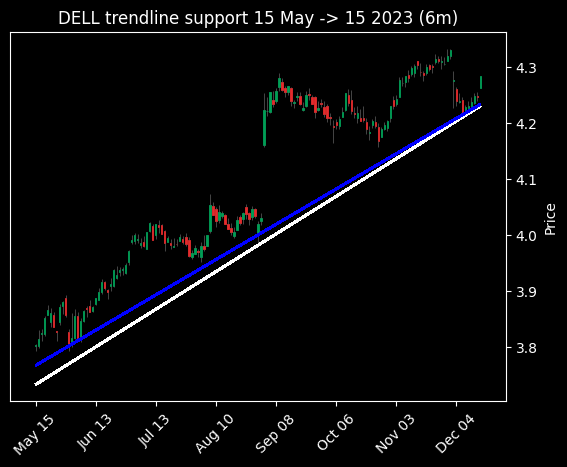

In [41]:
#print(DELL_data)
# Load data!!!!!!!!!!!!!!!!!!!!!
data = pd.DataFrame(DELL_data[['Date','Open','High','Low','Close']])
#data['Date'] = data['Date'].reset_index()
#astype('datetime64[s]')
#data = data.set_index('Date')
#print(data)
# Take natural log of data to resolve price scaling issues
data = np.log(data)
# Trendline parameter
lookback = 180

support_slope = [np.nan] * len(data)
resist_slope = [np.nan] * len(data)
for i in range(0, len(data)):
    candles = data.iloc[:]
    support_coefs, resist_coefs =  fit_trendlines_high_low(candles['High'], 
                                                           candles['Low'], 
                                                           candles['Close'])
    support_slope[i] = support_coefs[0]
    resist_slope[i] = resist_coefs[0]

data['support_slope'] = support_slope
data['resist_slope'] = resist_slope

# Plot Trendlines on candles 
# Library for plotting candles
#!pip install mplfinance
import mplfinance as mpf 


candles = data.iloc[:] # Last 30 candles in data
support_coefs_c, resist_coefs_c = fit_trendlines_single(candles['Close'])
support_coefs, resist_coefs = fit_trendlines_high_low(candles['High'], candles['Low'], candles['Close'])

support_line_c = support_coefs_c[0] * np.arange(len(candles)) + support_coefs_c[1]
resist_line_c = resist_coefs_c[0] * np.arange(len(candles)) + resist_coefs_c[1]

support_line = support_coefs[0] * np.arange(len(candles)) + support_coefs[1]
resist_line = resist_coefs[0] * np.arange(len(candles)) + resist_coefs[1]

plt.style.use('dark_background')
ax = plt.gca()

def get_line_points(candles, line_points):
    # Place line points in tuples for matplotlib finance
    # https://github.com/matplotlib/mplfinance/blob/master/examples/using_lines.ipynb
    idx = candles.index
    line_i = len(candles) - len(line_points)
    assert(line_i >= 0)
    points = []
    for i in range(line_i, len(candles)):
        points.append((idx[i], line_points[i - line_i]))
    return points

s_seq = get_line_points(candles, support_line)
#r_seq = get_line_points(candles, resist_line)
s_seq2 = get_line_points(candles, support_line_c)
#r_seq2 = get_line_points(candles, resist_line_c)
plt.title("DELL trendline support 15 May -> 15 2023 (6m)")
ax.set_facecolor('xkcd:black')
ax.grid(False)
mpf.plot(candles, alines=dict(alines=[s_seq, s_seq2], colors=['w', 'b']), type='candle', style='yahoo', ax=ax)
plt.show()

In the graph above you can see the **Trendline support** lines. The reason why you see 2 lines, is because one of them is based on the **high/low prices**, and the other is based on the **closing** price. Let's move on and show the trendline for TM and BILI.

## TM trendline support

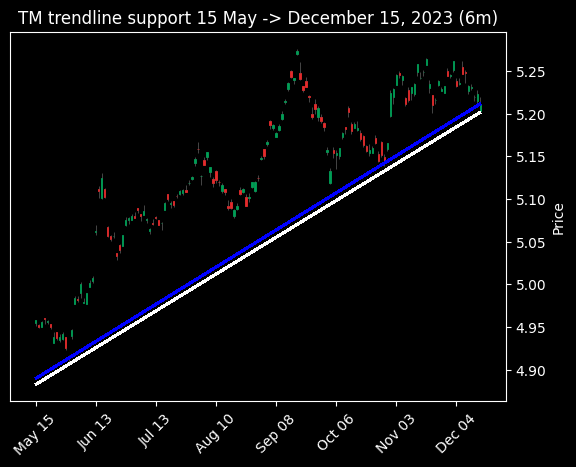

In [42]:
# Load data!!!!!!!!!!!!!!!!!!!!!
data = pd.DataFrame(TM_data[['Date','Open','High','Low','Close']])

# Take natural log of data to resolve price scaling issues
data = np.log(data)
# Trendline parameter
lookback = 180

support_slope = [np.nan] * len(data)
resist_slope = [np.nan] * len(data)
for i in range(0, len(data)):
    candles = data.iloc[:]
    support_coefs, resist_coefs =  fit_trendlines_high_low(candles['High'], 
                                                           candles['Low'], 
                                                           candles['Close'])
    support_slope[i] = support_coefs[0]
    resist_slope[i] = resist_coefs[0]

data['support_slope'] = support_slope
data['resist_slope'] = resist_slope

# Library for plotting candles
#!pip install mplfinance
import mplfinance as mpf 


candles = data.iloc[:] # Last 30 candles in data
support_coefs_c, resist_coefs_c = fit_trendlines_single(candles['Close'])
support_coefs, resist_coefs = fit_trendlines_high_low(candles['High'], candles['Low'], candles['Close'])

support_line_c = support_coefs_c[0] * np.arange(len(candles)) + support_coefs_c[1]
resist_line_c = resist_coefs_c[0] * np.arange(len(candles)) + resist_coefs_c[1]

support_line = support_coefs[0] * np.arange(len(candles)) + support_coefs[1]
resist_line = resist_coefs[0] * np.arange(len(candles)) + resist_coefs[1]

plt.style.use('dark_background')
ax = plt.gca()

def get_line_points(candles, line_points):
    # Place line points in tuples for matplotlib finance
    # https://github.com/matplotlib/mplfinance/blob/master/examples/using_lines.ipynb
    idx = candles.index
    line_i = len(candles) - len(line_points)
    assert(line_i >= 0)
    points = []
    for i in range(line_i, len(candles)):
        points.append((idx[i], line_points[i - line_i]))
    return points

s_seq = get_line_points(candles, support_line)
#r_seq = get_line_points(candles, resist_line)
s_seq2 = get_line_points(candles, support_line_c)
#r_seq2 = get_line_points(candles, resist_line_c)
plt.title("TM trendline support 15 May -> December 15, 2023 (6m)")
ax.set_facecolor('xkcd:black')
ax.grid(False)
mpf.plot(candles, alines=dict(alines=[s_seq, s_seq2], colors=['w', 'b']), type='candle', style='yahoo', ax=ax)
plt.show()

## BILI trendline support

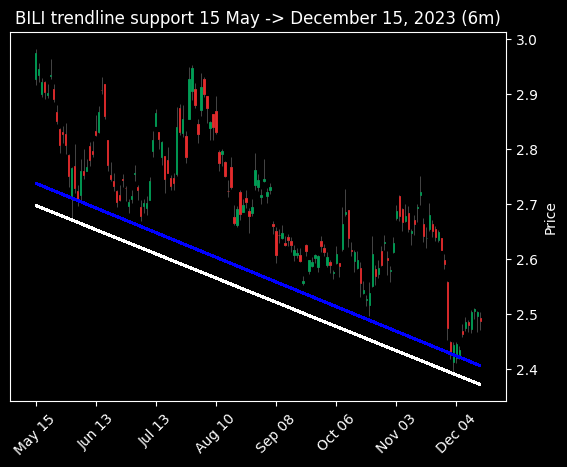

In [43]:
# Load data!!!!!!!!!!!!!!!!!!!!!
data = pd.DataFrame(BILI_data[['Date','Open','High','Low','Close']])

# Take natural log of data to resolve price scaling issues
data = np.log(data)
# Trendline parameter
lookback = 180

support_slope = [np.nan] * len(data)
resist_slope = [np.nan] * len(data)
for i in range(0, len(data)):
    candles = data.iloc[:]
    support_coefs, resist_coefs =  fit_trendlines_high_low(candles['High'], 
                                                           candles['Low'], 
                                                           candles['Close'])
    support_slope[i] = support_coefs[0]
    resist_slope[i] = resist_coefs[0]

data['support_slope'] = support_slope
data['resist_slope'] = resist_slope

# Library for plotting candles




candles = data.iloc[:] # Last 30 candles in data
support_coefs_c, resist_coefs_c = fit_trendlines_single(candles['Close'])
support_coefs, resist_coefs = fit_trendlines_high_low(candles['High'], candles['Low'], candles['Close'])

support_line_c = support_coefs_c[0] * np.arange(len(candles)) + support_coefs_c[1]
resist_line_c = resist_coefs_c[0] * np.arange(len(candles)) + resist_coefs_c[1]

support_line = support_coefs[0] * np.arange(len(candles)) + support_coefs[1]
resist_line = resist_coefs[0] * np.arange(len(candles)) + resist_coefs[1]

plt.style.use('dark_background')
ax = plt.gca()

def get_line_points(candles, line_points):
    # Place line points in tuples for matplotlib finance
    # https://github.com/matplotlib/mplfinance/blob/master/examples/using_lines.ipynb
    idx = candles.index
    line_i = len(candles) - len(line_points)
    assert(line_i >= 0)
    points = []
    for i in range(line_i, len(candles)):
        points.append((idx[i], line_points[i - line_i]))
    return points

s_seq = get_line_points(candles, support_line)
#r_seq = get_line_points(candles, resist_line)
s_seq2 = get_line_points(candles, support_line_c)
#r_seq2 = get_line_points(candles, resist_line_c)
plt.title("BILI trendline support 15 May -> December 15, 2023 (6m)")
ax.set_facecolor('xkcd:black')
ax.grid(False)
mpf.plot(candles, alines=dict(alines=[s_seq, s_seq2], colors=['w', 'b']), type='candle', style='yahoo', ax=ax)
plt.show()

All of the trendline supports were calculated and shown. Moving on to resistance, for NOK and CTVA

## NOK Resistence line

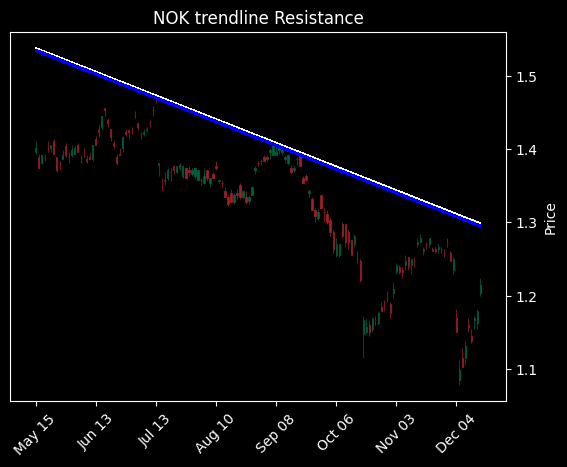

In [44]:
# Load data!!!!!!!!!!!!!!!!!!!!!
data = pd.DataFrame(NOK_data[['Date','Open','High','Low','Close']])

# Take natural log of data to resolve price scaling issues
data = np.log(data)
# Trendline parameter
lookback = 180

support_slope = [np.nan] * len(data)
resist_slope = [np.nan] * len(data)
for i in range(0, len(data)):
    candles = data.iloc[:]
    support_coefs, resist_coefs =  fit_trendlines_high_low(candles['High'], 
                                                           candles['Low'], 
                                                           candles['Close'])
    support_slope[i] = support_coefs[0]
    resist_slope[i] = resist_coefs[0]

data['support_slope'] = support_slope
data['resist_slope'] = resist_slope

# Library for plotting candles



candles = data.iloc[:] # all candles in data
support_coefs_c, resist_coefs_c = fit_trendlines_single(candles['Close'])
support_coefs, resist_coefs = fit_trendlines_high_low(candles['High'], candles['Low'], candles['Close'])

support_line_c = support_coefs_c[0] * np.arange(len(candles)) + support_coefs_c[1]
resist_line_c = resist_coefs_c[0] * np.arange(len(candles)) + resist_coefs_c[1]

support_line = support_coefs[0] * np.arange(len(candles)) + support_coefs[1]
resist_line = resist_coefs[0] * np.arange(len(candles)) + resist_coefs[1]

plt.style.use('dark_background')
ax = plt.gca()

def get_line_points(candles, line_points):
    # Place line points in tuples for matplotlib finance
    # https://github.com/matplotlib/mplfinance/blob/master/examples/using_lines.ipynb
    idx = candles.index
    line_i = len(candles) - len(line_points)
    assert(line_i >= 0)
    points = []
    for i in range(line_i, len(candles)):
        points.append((idx[i], line_points[i - line_i]))
    return points

#s_seq = get_line_points(candles, support_line)
r_seq = get_line_points(candles, resist_line)
#s_seq2 = get_line_points(candles, support_line_c)
r_seq2 = get_line_points(candles, resist_line_c)
plt.title("NOK trendline Resistance")
mpf.plot(candles, alines=dict(alines=[r_seq, r_seq2], colors=['w', 'b']), type='candle', style='charles', ax=ax)
plt.show()

Let's now look at the CTVA trendline resistence!
## CTVA trendline resistence

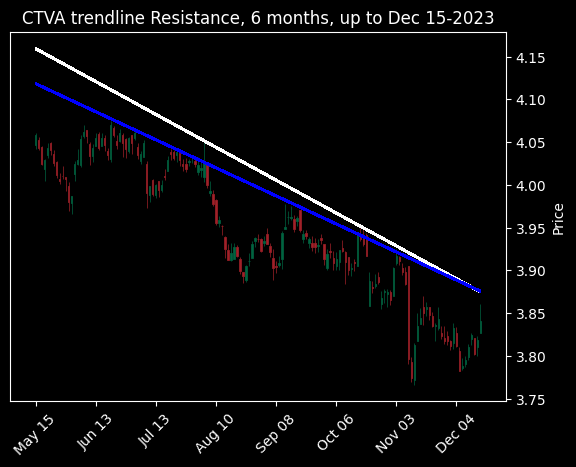

In [45]:
# Load data!!!!!!!!!!!!!!!!!!!!!
data = pd.DataFrame(CTVA_data[['Date','Open','High','Low','Close']])

# Take natural log of data to resolve price scaling issues
data = np.log(data)
# Trendline parameter
lookback = 180

support_slope = [np.nan] * len(data)
resist_slope = [np.nan] * len(data)
for i in range(0, len(data)):
    candles = data.iloc[:]
    support_coefs, resist_coefs =  fit_trendlines_high_low(candles['High'], 
                                                           candles['Low'], 
                                                           candles['Close'])
    support_slope[i] = support_coefs[0]
    resist_slope[i] = resist_coefs[0]

data['support_slope'] = support_slope
data['resist_slope'] = resist_slope

# Library for plotting candles



candles = data.iloc[:] # all candles in data
support_coefs_c, resist_coefs_c = fit_trendlines_single(candles['Close'])
support_coefs, resist_coefs = fit_trendlines_high_low(candles['High'], candles['Low'], candles['Close'])

support_line_c = support_coefs_c[0] * np.arange(len(candles)) + support_coefs_c[1]
resist_line_c = resist_coefs_c[0] * np.arange(len(candles)) + resist_coefs_c[1]

support_line = support_coefs[0] * np.arange(len(candles)) + support_coefs[1]
resist_line = resist_coefs[0] * np.arange(len(candles)) + resist_coefs[1]

plt.style.use('dark_background')
ax = plt.gca()

def get_line_points(candles, line_points):
    # Place line points in tuples for matplotlib finance
    # https://github.com/matplotlib/mplfinance/blob/master/examples/using_lines.ipynb
    idx = candles.index
    line_i = len(candles) - len(line_points)
    assert(line_i >= 0)
    points = []
    for i in range(line_i, len(candles)):
        points.append((idx[i], line_points[i - line_i]))
    return points

#s_seq = get_line_points(candles, support_line)
r_seq = get_line_points(candles, resist_line)
#s_seq2 = get_line_points(candles, support_line_c)
r_seq2 = get_line_points(candles, resist_line_c)
plt.title("CTVA trendline Resistance, 6 months, up to Dec 15-2023")
mpf.plot(candles, alines=dict(alines=[r_seq, r_seq2], colors=['w', 'b']), type='candle', style='charles', ax=ax)
plt.show()

# Horizontal Resistance, Support for NVS

In [46]:
#decoment this if you don't have mplfinance
#!pip install mlpfinance

In [47]:
import math
from mplfinance.original_flavor import candlestick_ohlc
import matplotlib.dates as mpl_dates
import matplotlib.pyplot as plt

In [48]:
#not needed anymore, i have one that extracts for 6months called get_stock_price_6m - keeping it here for any further need - can be deleted later
'''
def get_stock_price(symbol):
  df = yf.download(symbol, start='2023-01-01', threads= False) #change starting date if you want
  df['Date'] = pd.to_datetime(df.index)
  df['Date'] = df['Date'].apply(mpl_dates.date2num)
  df = df.loc[:,['Date', 'Open', 'High', 'Low', 'Close']]
  return df
'''

"\ndef get_stock_price(symbol):\n  df = yf.download(symbol, start='2023-01-01', threads= False) #change starting date if you want\n  df['Date'] = pd.to_datetime(df.index)\n  df['Date'] = df['Date'].apply(mpl_dates.date2num)\n  df = df.loc[:,['Date', 'Open', 'High', 'Low', 'Close']]\n  return df\n"

In [49]:
#getting the stock data
symbol = 'NVS'
df = get_stock_price_6m(symbol)

[*********************100%%**********************]  1 of 1 completed


In [50]:

# determine bullish fractal 
def is_support(df,i):  
  cond1 = df['Low'][i] < df['Low'][i-1]   
  cond2 = df['Low'][i] < df['Low'][i+1]   
  cond3 = df['Low'][i+1] < df['Low'][i+2]   
  cond4 = df['Low'][i-1] < df['Low'][i-2]  
  return (cond1 and cond2 and cond3 and cond4) 
# determine bearish fractal
def is_resistance(df,i):  
  cond1 = df['High'][i] > df['High'][i-1]   
  cond2 = df['High'][i] > df['High'][i+1]   
  cond3 = df['High'][i+1] > df['High'][i+2]   
  cond4 = df['High'][i-1] > df['High'][i-2]  
  return (cond1 and cond2 and cond3 and cond4)
# to make sure the new level area does not exist already
def is_far_from_level(value, levels, df):    
  ave =  np.mean(df['High'] - df['Low'])    
  return np.sum([abs(value-level)<ave for _,level in levels])==0
# a list to store resistance and support levels
levels = []
for i in range(2, df.shape[0] - 2):  
  if is_support(df, i):    
    low = df['Low'][i]    
    if is_far_from_level(low, levels, df):      
      levels.append((i, low))  
  elif is_resistance(df, i):    
    high = df['High'][i]    
    if is_far_from_level(high, levels, df):      
      levels.append((i, high))

In [51]:
# for visualization
def plot_all(levels, df):    
  fig, ax = plt.subplots(figsize=(16, 9))   
  candlestick_ohlc(ax,df.values,width=0.6, colorup='green', 
    colordown='red', alpha=0.8)    
  date_format = mpl_dates.DateFormatter('%d %b %Y')
  ax.xaxis.set_major_formatter(date_format)    
  for level in levels:        
    plt.hlines(level[1], xmin = df['Date'][level[0]], xmax = 
      max(df['Date']), colors='blue', linestyle='--')
  #fig.show()


#### You can see below the horizontal support and resistance for NVS in 2023

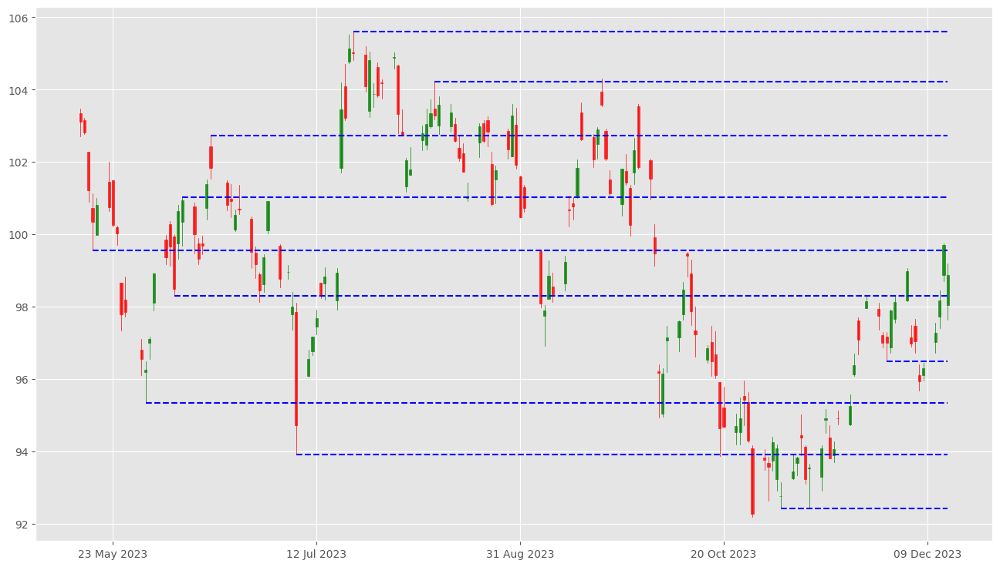

In [52]:
plt.style.use('ggplot')
plot_all(levels,df)

### You can see the trendline support and resistence levels for 6 months, up until 15 Dec 2023 for the NVS stock above. 

In [53]:
#getting the stock data
symbol = 'DBX'
df = get_stock_price_6m(symbol)

[*********************100%%**********************]  1 of 1 completed


In [54]:
# a list to store resistance and support levels
levels = []
for i in range(2, df.shape[0] - 2):  
  if is_support(df, i):    
    low = df['Low'][i]    
    if is_far_from_level(low, levels, df):      
      levels.append((i, low))  
  elif is_resistance(df, i):    
    high = df['High'][i]    
    if is_far_from_level(high, levels, df):      
      levels.append((i, high))

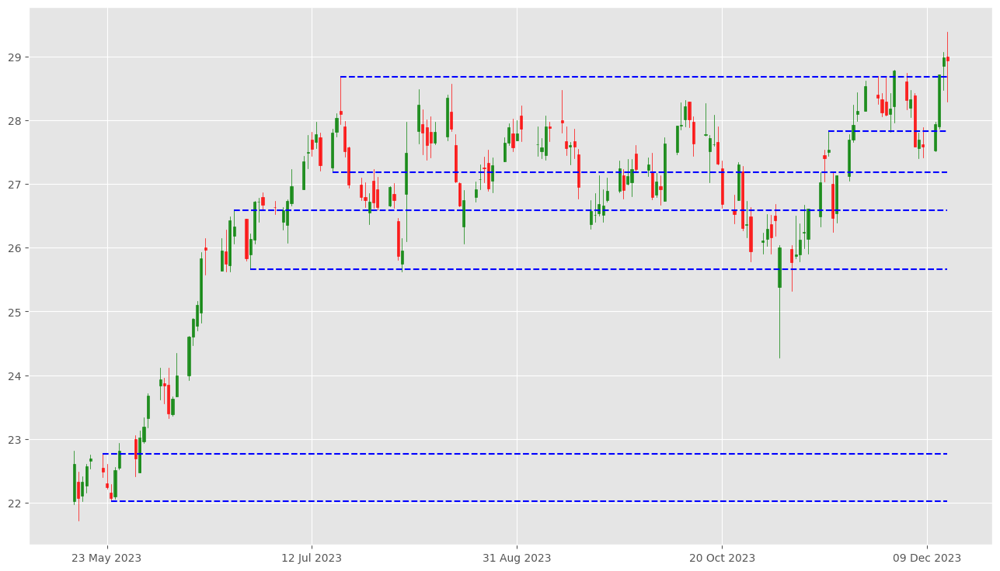

In [55]:
plt.style.use('ggplot')

plot_all(levels,df)

### You can see the horizontal trendile Resistence and support levels 6 months, up until 15 DECEMBER 2023, for DBX stock, above.

# Task 2.2. Wedges. Triangles and Channels
1. Wedge - angled up, angled down or horizontal - LLY, BILI
2. Triangle Ascending - ELV, ALVO
3. Triangle Descending - MPC, SQSP
4. Channel - angled up, angled down or horizontal - MU, NOK, NVS, DBX, NVDA

### FInding all wedgepoints for LLY
The code below will find all wedge points, no matter if it is angled up, down or horizontally.

The period on which the algorithm works, is from 15.06.2023 to 15.12.2023.

[*********************100%%**********************]  1 of 1 completed
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
Completed 25.0%
Completed 50.0%
Completed 75.0%
Completed 100.0%


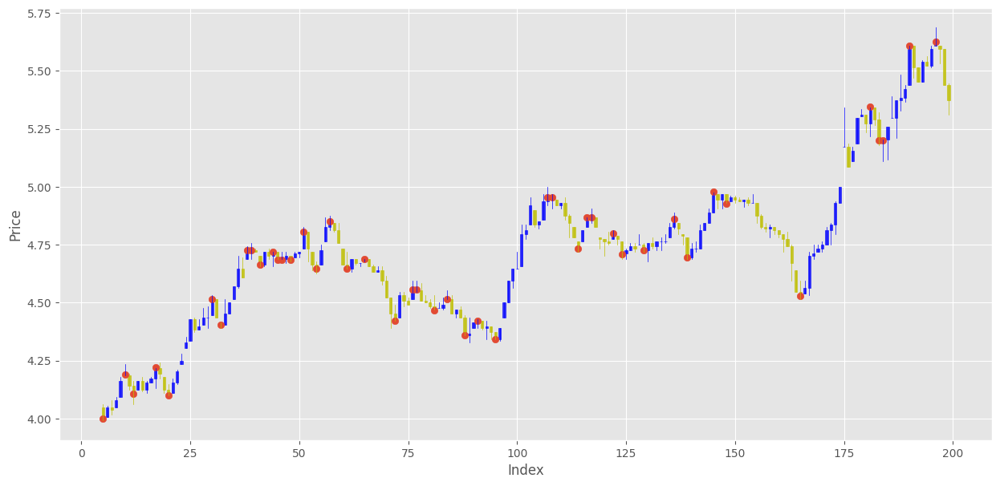

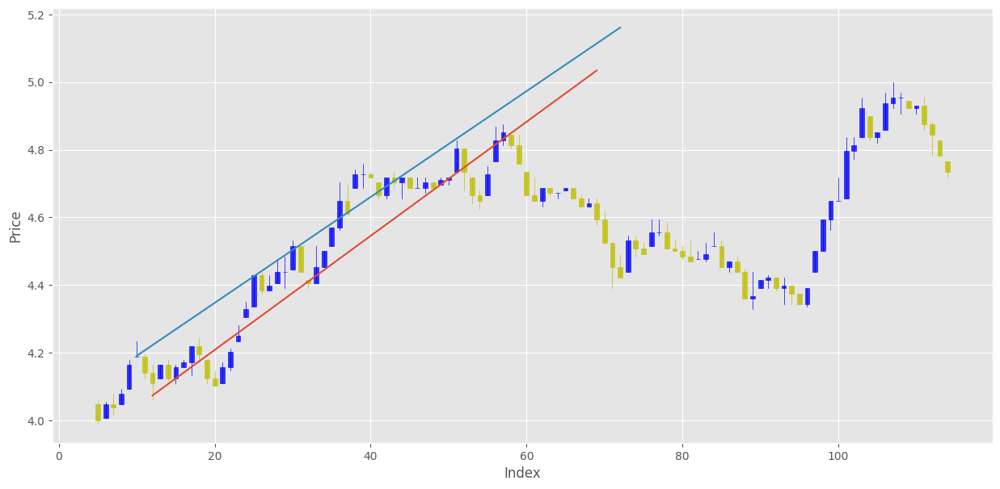

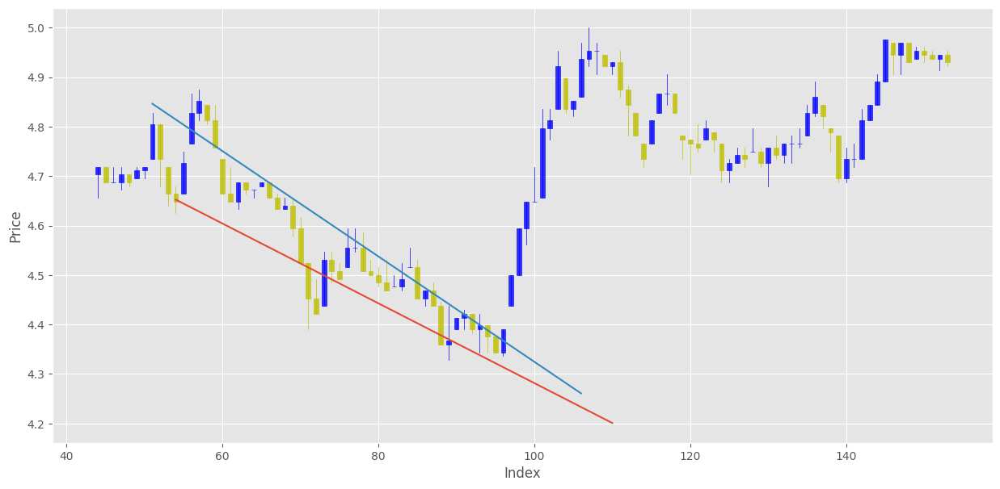

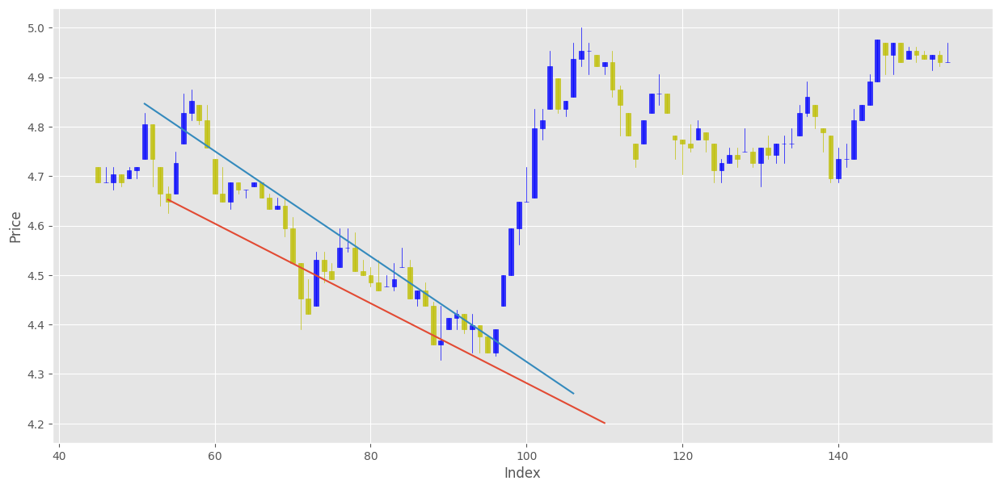

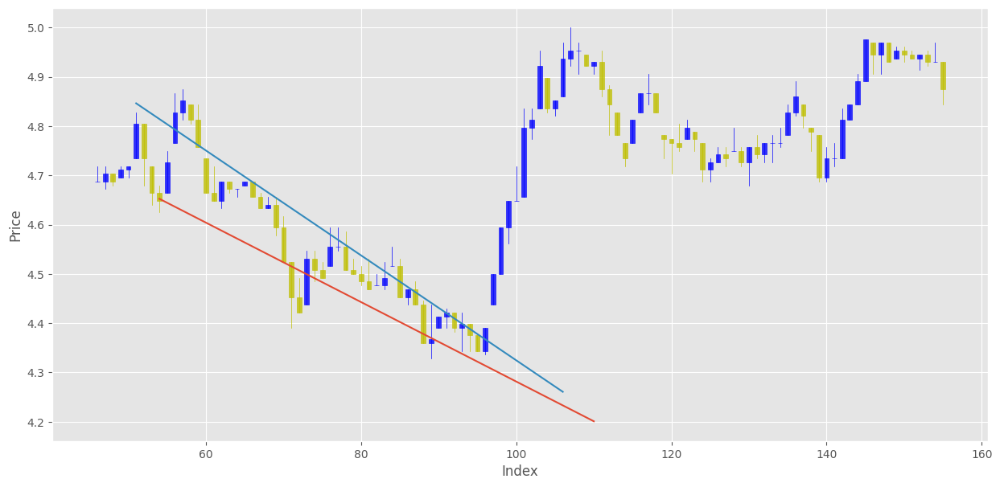

In [56]:
import matplotlib.dates as mpdates
import os
from scipy.stats import linregress
#!pip install scipy 
# run above if you don't have scipy installed

def pivot_id(ohlc, l, n1, n2):
    """
    Get the pivot id 

    :params ohlc is a dataframe
    :params l is the l'th row
    :params n1 is the number of candles to the left
    :params n2 is the number of candles to the right
    :return int  
    """

    # Check if the length conditions met
    if l-n1 < 0 or l+n2 >= len(ohlc):
        return 0
    
    pivot_low  = 1
    pivot_high = 1

    for i in range(l-n1, l+n2+1):
        if(ohlc.loc[l,"Close"] > ohlc.loc[i, "Close"]):
            pivot_low = 0

        if(ohlc.loc[l, "Close"] < ohlc.loc[i, "Close"]):
            pivot_high = 0

    if pivot_low and pivot_high:
        return 3

    elif pivot_low:
        return 1

    elif pivot_high:
        return 2
    else:
        return 0


def pivot_point_position(row):
    """
    Get the Pivot Point position and assign a Close value

    :params row -> row of the ohlc dataframe
    :return float
    """
   
    if row['Pivot']==1:
        return row['Close']-1e-3
    elif row['Pivot']==2:
        return row['Close']+1e-3
    else:
        return np.nan


def find_wedge_points_for_period(ohlc, start_date, end_date, back_candles):
    """
    Find wedge points within a specified time period

    :params ohlc         -> dataframe that has OHLC data
    :params start_date   -> start date of the period (in datetime format)
    :params end_date     -> end date of the period (in datetime format)
    :params back_candles -> number of periods to lookback
    :return all_points
    """
    all_points = []
    
    # Filter the dataframe based on the specified time period
    period_df = ohlc[(ohlc['Date'] >= mpdates.date2num(start_date)) & (ohlc['Date'] <= mpdates.date2num(end_date))]

    for candle_idx in range(back_candles + 10, len(period_df)):
        maxim = np.array([])
        minim = np.array([])
        xxmin = np.array([])
        xxmax = np.array([])

        for i in range(candle_idx-back_candles, candle_idx+1):
            if ohlc.loc[i,"Pivot"] == 1:
                minim = np.append(minim, ohlc.loc[i, "Close"])
                xxmin = np.append(xxmin, i) 
            if ohlc.loc[i,"Pivot"] == 2:
                maxim = np.append(maxim, ohlc.loc[i,"Close"])
                xxmax = np.append(xxmax, i)

        
        if (xxmax.size <3 and xxmin.size <3) or xxmax.size==0 or xxmin.size==0:
            continue

        slmin, intercmin, rmin, pmin, semin = linregress(xxmin, minim)
        slmax, intercmax, rmax, pmax, semax = linregress(xxmax, maxim)
        

        # Check if the lines are in the same direction
        if abs(rmax)>=0.9 and abs(rmin)>=0.9 and ((slmin>=1e-3 and slmax>=1e-3 ) or (slmin<=-1e-3 and slmax<=-1e-3)):
                # Check if lines are parallel but converge fast 
                x_ =   (intercmin -intercmax)/(slmax-slmin)
                cors = np.hstack([xxmax, xxmin])  
                if (x_ - max(cors))>0 and (x_ - max(cors))<(max(cors) - min(cors))*3 and slmin/slmax > 0.75 and slmin/slmax < 1.25:  
                     all_points.append(candle_idx)
            

    return all_points




def point_position_plot(ohlc, start_index, end_index):
        """
        Plot the pivot points over a sample period

        :params ohlc        -> dataframe that has OHLC data
        :params start_index -> index where to start taking the sample data
        :params end_index   -> index where to stop taking the sample data
        :return 
        """
        ohlc_subset = ohlc[start_index:end_index]
        ohlc_subset_copy = ohlc_subset.copy()
        ohlc_subset_copy.loc[:,"Index"] = ohlc_subset_copy.index 



        fig, ax = plt.subplots(figsize=(15,7))
        candlestick_ohlc(ax, ohlc_subset_copy.loc[:, ["Index","Open", "High", "Low", "Close"] ].values, width=0.6, colorup='b', colordown='y', alpha=0.8)
        ax.scatter(ohlc_subset_copy["Index"], ohlc_subset_copy["PointPos"])

        ax.grid(True)
        ax.set_xlabel('Index')
        ax.set_ylabel('Price')

      
        #fn   = f"wedge-pivot-point-sample.png"
        #file = os.path.join( dir_,'images','analysis',fn)
        #plt.savefig(file, format="png")
        plt.plot()
        return

def save_plot(ohlc, all_points, back_candles):
    """
    Save all the wedge graphs

    :params ohlc         -> dataframe that has OHLC data
    :params all_points   -> wedge points
    :params back_candles -> number of periods to lookback
    :return 
    """

    total = len(all_points)
    for j, point in enumerate(all_points):

        maxim = np.array([])
        minim = np.array([])
        xxmin = np.array([])
        xxmax = np.array([])

        for i in range(point-back_candles, point+1):
            if ohlc.loc[i,"Pivot"] == 1:
                minim = np.append(minim, ohlc.loc[i, "Close"])
                xxmin = np.append(xxmin, i) 
            if ohlc.loc[i,"Pivot"] == 2:
                maxim = np.append(maxim, ohlc.loc[i,"Close"])
                xxmax = np.append(xxmax, i)
                

        slmin, intercmin, rmin, pmin, semin = linregress(xxmin, minim)
        slmax, intercmax, rmax, pmax, semax = linregress(xxmax, maxim)

        xxmin = np.append(xxmin, xxmin[-1]) 
        xxmax = np.append(xxmax, xxmax[-1])

        ohlc_subset = ohlc[point-back_candles-5:point+back_candles+5]
        ohlc_subset_copy = ohlc_subset.copy()
        ohlc_subset_copy.loc[:,"Index"] = ohlc_subset_copy.index
    
        xxmin = np.append(xxmin, xxmin[-1]+15)
        xxmax = np.append(xxmax, xxmax[-1]+15)

        fig, ax = plt.subplots(figsize=(15,7))

        
        candlestick_ohlc(ax, ohlc_subset_copy.loc[:, ["Index","Open", "High", "Low", "Close"] ].values, width=0.6, colorup='b', colordown='y', alpha=0.8)
        ax.plot(xxmin, xxmin*slmin + intercmin)
        ax.plot(xxmax, xxmax*slmax + intercmax)

        ax.grid(True)
        ax.set_xlabel('Index')
        ax.set_ylabel('Price')


  
        #fn = f"wedge-{point}.png"
        #file = os.path.join( dir_,fn)
        #plt.savefig(file,'images', format="png")
        print(f"Completed {round((j+1)/total,2)*100}%")

    return

if __name__ == "__main__":
 
    df = getdata('LLY')
    print(type(df))
    df.reset_index(inplace=True)
    print(type(df))
    # Remove all non-trading periods
    #df=df[df['Volume']!=0]
    #df.reset_index(drop=True, inplace=True)

    ohlc         = df.loc[:, ["Date", "Open", "High", "Low", "Close"] ]
    ohlc["Date"] = pd.to_datetime(ohlc["Date"])
    ohlc["Date"] = ohlc["Date"].map(mpdates.date2num)

    ohlc["Pivot"] = 0


    # Get the minimas and maximas 
    ohlc["Pivot"]    = ohlc.apply(lambda x: pivot_id(ohlc, x.name, 3, 3), axis=1)
    ohlc['PointPos'] = ohlc.apply(lambda x: pivot_point_position(x), axis=1) # Used for visualising the pivot points


    # Plot sample point positions
    point_position_plot(ohlc, 5, 200)

    # # Find all wedge pattern points
    back_candles = 50
    start_date = pd.to_datetime("2023-06-15")
    end_date = start_date + pd.DateOffset(months=6)
    # Function to look for wedge points in a 6 months period
    all_points = find_wedge_points_for_period(ohlc, start_date, end_date, back_candles)

    # Plot the wedge pattern graphs
    save_plot(ohlc, all_points, back_candles)

#### All of the red points in the first plot represent a wedge that the algorithm detected. The function will plot the most important patterns found for the period 06.16.2023 to 12.16.2023.

#### Also, the function can save all of the wedge points found as PNG in a folder called "images", because they are a lot found in the stock. To do that, just uncomment the last lines in `save_plot` function! You need to have an `images` folder on desktop, otherwise you will get an error.

## Wedge for BILI stock
Now that we have all of the functions defined, we just need to re-run the main, using the BILI stock. Let's do that!

[*********************100%%**********************]  1 of 1 completed
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
Completed 100.0%


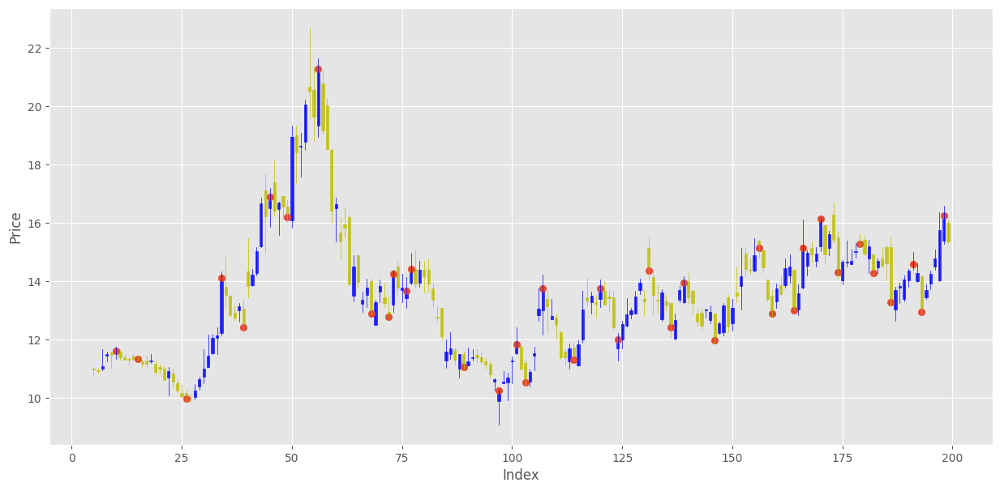

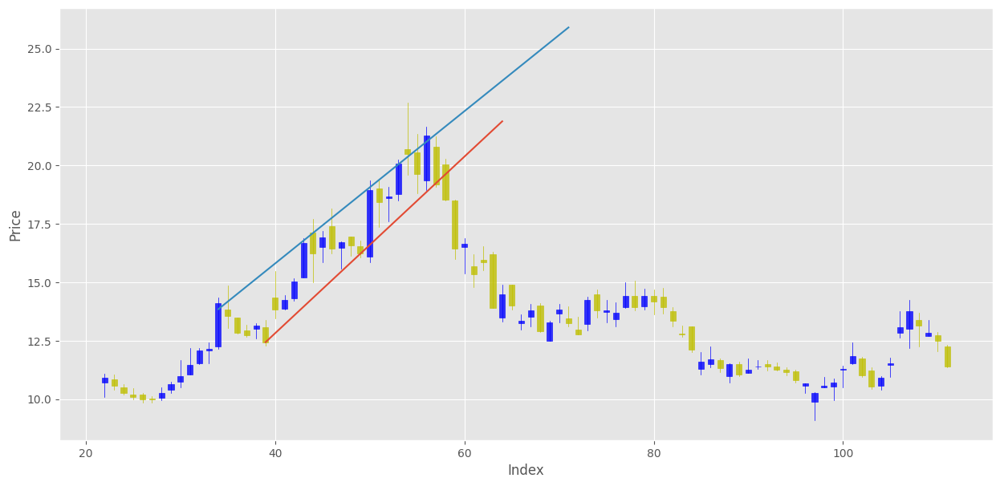

In [57]:
if __name__ == "__main__":
 
    df = getdata('BILI')
    print(type(df))
    df.reset_index(inplace=True)
    print(type(df))
    # Remove all non-trading periods
    #df=df[df['Volume']!=0]
    #df.reset_index(drop=True, inplace=True)

    ohlc         = df.loc[:, ["Date", "Open", "High", "Low", "Close"] ]
    ohlc["Date"] = pd.to_datetime(ohlc["Date"])
    ohlc["Date"] = ohlc["Date"].map(mpdates.date2num)

    ohlc["Pivot"] = 0


    # Get the minimas and maximas 
    ohlc["Pivot"]    = ohlc.apply(lambda x: pivot_id(ohlc, x.name, 3, 3), axis=1)
    ohlc['PointPos'] = ohlc.apply(lambda x: pivot_point_position(x), axis=1) # Used for visualising the pivot points


    # Plot sample point positions
    point_position_plot(ohlc, 5, 200)

    # # Find all wedge pattern points
    back_candles = 40
    start_date = pd.to_datetime("2023-06-15")
    end_date = start_date + pd.DateOffset(months=6)
    # Function to look for wedge points in a 6 months period
    all_points = find_wedge_points_for_period(ohlc, start_date, end_date, back_candles)

    # Plot the wedge pattern graphs
    save_plot(ohlc, all_points, back_candles)

You can see the wedge pattern that the algorithm found ploted above!

## Triangle Ascending
### For ELV

This algorithm will find the ascending and descending triangle patterns for the stocks ELV, ALVO, MPC, SQSP. The window parameter in the cell below, in the `detect_triangle_pattern` function, specifies the range of candlesticks to look for ascending/descending triangles. If it's set at 10, it will look at 10 candlesticks around the window it checks.

The algorithm detects both ascending and descending triangles.

**The Period for this algorith is from 15.06.2023 to 15.12.2023.**

## Ascending Triangles for ELV stock

For the triangle detection, I need to also get the Volume when extracting price data. THe function can  be seen below, that extracts from 2023-06-15 to 2023-12-15.

The code below detects the BEST ascending triangle for a 6 months period.

The best triangle found is determined by a multiplication between the period that the triangle runs for, and the height (from high to low) of the triangle - so both factors are taken into account when scoring.

[*********************100%%**********************]  1 of 1 completed


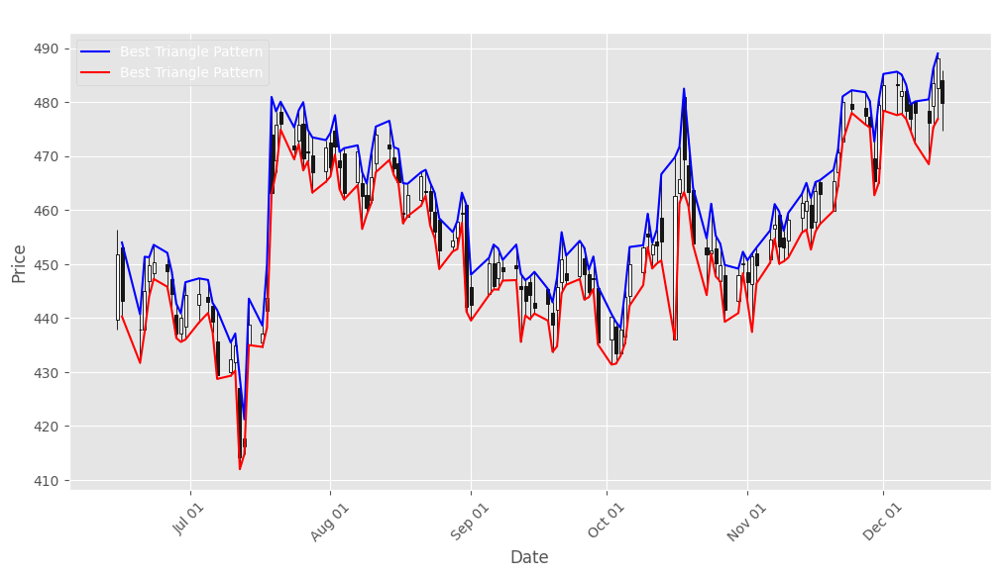

In [149]:
import pandas as pd
import numpy as np
import yfinance as yf
import mplfinance as mpf
import matplotlib.pyplot as plt

def get_stock_price_6m_volume(symbol):
    df = yf.download(symbol, start='2023-06-15', end='2023-12-15', threads=False)
    df['Date'] = pd.to_datetime(df.index)
    df = df[['Date', 'Open', 'High', 'Low', 'Close', 'Volume']]
    return df

def detect_triangle_pattern(df, window=125):
    patterns = []
    if len(df) < window:
        return patterns

    # Define the rolling window
    roll_window = window
    
    # Create a rolling window for High and Low
    df['high_roll_max'] = df['High'].rolling(window=roll_window).max()
    df['low_roll_min'] = df['Low'].rolling(window=roll_window).min()

    # Create a boolean mask for ascending triangle pattern
    mask_asc = (df['high_roll_max'] >= df['High'].shift(1)) & (df['low_roll_min'] <= df['Low'].shift(1)) & (df['Close'] > df['Close'].shift(1))
    
    # Create a boolean mask for descending triangle pattern
    mask_desc = (df['high_roll_max'] <= df['High'].shift(1)) & (df['low_roll_min'] >= df['Low'].shift(1)) & (df['Close'] < df['Close'].shift(1)) & (df['Close'].shift(1) < df['Close'].shift(2))
    
    # Create a new column for triangle pattern and populate it using the boolean masks
    df['triangle_pattern'] = np.nan
    df.loc[mask_asc, 'triangle_pattern'] = 'Ascending Triangle'
    df.loc[mask_desc, 'triangle_pattern'] = 'Descending Triangle'
    
    for i in range(len(df) - window + 1):
        pattern_data = df.iloc[i:i+window]
        patterns.append(pattern_data)

    return patterns

def calculate_pattern_score(pattern):
    # Calculate the duration of the triangle (difference in trading days)
    duration_days = len(pattern)

    # Calculate the height of the triangle (difference between high and low)
    triangle_height = pattern['High'].max() - pattern['Low'].min()

    # You can add more factors to the scoring logic based on your requirements
    # For example, you might consider breakout volume, trend strength, etc.

    # Assign a score based on the combination of duration and height
    score = duration_days * triangle_height

    return score

def find_best_triangle_pattern(df):
    patterns = detect_triangle_pattern(df)
    best_pattern = None
    best_score = 0
    
    for pattern in patterns:
        score = calculate_pattern_score(pattern)
        if score > best_score:
            best_score = score
            best_pattern = pattern
    
    return best_pattern

def plot_best_triangle_pattern(df, best_pattern):
    # Ensure 'Date' is set as DatetimeIndex
    df.set_index('Date', inplace=True)
    
    # Plot candlestick chart
    fig, ax = plt.subplots(figsize=(12, 6))
    mpf.plot(df, type='candle', ax=ax, show_nontrading=True)

    ax.plot(best_pattern['Date'], best_pattern['High'], color='blue', label='Best Triangle Pattern')
    ax.plot(best_pattern['Date'], best_pattern['Low'], color='red', label='Best Triangle Pattern')
    # Set labels and title
    ax.set_xlabel('Date')
    ax.set_ylabel('Price')
    
    # Manually add title
    plt.title('Best Triangle Pattern for Stock (6 months up to December 15, 2023)')

    # Add legend
    ax.legend()

# Main execution
df_raw = get_stock_price_6m_volume('ELV')
df = df_raw[['Date', 'Open', 'High', 'Low', 'Close', 'Volume']]
df = df[df['Volume'] != 0]
df.reset_index(drop=True, inplace=True)

best_triangle_pattern = find_best_triangle_pattern(df)

# Plot the best triangle pattern
plot_best_triangle_pattern(df, best_triangle_pattern)

plt.show()


In [140]:
df

,Open,High,Low,Close,Volume,high_roll_max,low_roll_min,triangle_pattern
Date,,,,,,,,
2023-06-15,439.630005,456.380005,437.869995,451.730011,1753200,NaN,NaN,NaN
2023-06-16,453.040009,454.000000,440.299988,443.209991,2487200,NaN,NaN,NaN
2023-06-20,437.799988,440.679993,431.709991,437.929993,2582300,NaN,NaN,NaN
2023-06-21,437.920013,451.359985,437.429993,445.029999,1383900,NaN,NaN,NaN
2023-06-22,446.880005,451.250000,444.000000,449.869995,1146800,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2023-12-08,480.119995,480.119995,472.390015,477.970001,1099200,NaN,NaN,NaN
2023-12-11,478.359985,480.510010,468.510010,476.100006,1423100,NaN,NaN,NaN
2023-12-12,479.260010,486.209991,475.350006,483.529999,1178700,486.209991,412.0,Ascending Triangle


Detecting all triangles for a 6 month period.

[*********************100%%**********************]  1 of 1 completed


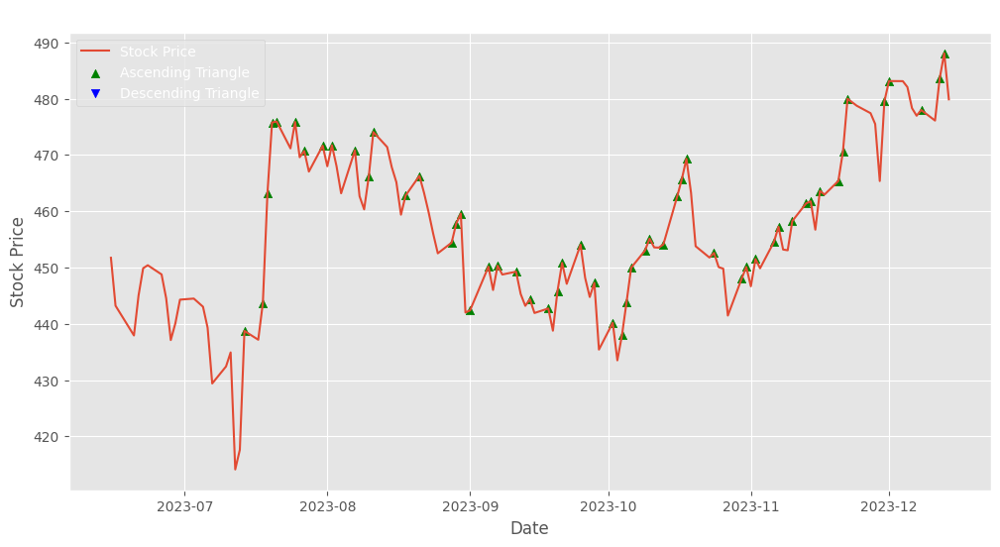

In [59]:



def detect_triangle_pattern_all(df, window=3):
    # Define the rolling window
    roll_window = window
    
    # Create a rolling window for High and Low
    df['high_roll_max'] = df['High'].rolling(window=roll_window).max()
    df['low_roll_min'] = df['Low'].rolling(window=roll_window).min()
    
    # Create a boolean mask for ascending triangle pattern
    mask_asc = (df['high_roll_max'] >= df['High'].shift(1)) & (df['low_roll_min'] <= df['Low'].shift(1)) & (df['Close'] > df['Close'].shift(1))
    
    # Create a boolean mask for descending triangle pattern
    mask_desc = (df['high_roll_max'] <= df['High'].shift(1)) & (df['low_roll_min'] >= df['Low'].shift(1)) & (df['Close'] < df['Close'].shift(1)) & (df['Close'].shift(1) < df['Close'].shift(2))
    
    # Create a new column for triangle pattern and populate it using the boolean masks
    df['triangle_pattern'] = np.nan
    df.loc[mask_asc, 'triangle_pattern'] = 'Ascending Triangle'
    df.loc[mask_desc, 'triangle_pattern'] = 'Descending Triangle'
    
    return df


if __name__ == "__main__":
    # Fetch stock data
    df_raw = get_stock_price_6m_volume('ELV')

    # Check if NA values are in data
    df = df_raw[df_raw['Volume'] != 0]
    df.reset_index(drop=True, inplace=True)
    df.isna().sum()

    # Detect triangle patterns
    df_with_triangles = detect_triangle_pattern_all(df, window=20)  # Adjust the window size as needed

    # Filter data for the year 2023
    df_2023 = df_with_triangles

    # Plot stock prices
    plt.figure(figsize=(12, 6))
    plt.plot(df_2023['Date'], df_2023['Close'], label='Stock Price')

    # Plot ascending triangles
    asc_triangles = df_2023[df_2023['triangle_pattern'] == 'Ascending Triangle']
    plt.scatter(asc_triangles['Date'], asc_triangles['Close'], marker='^', color='g', label='Ascending Triangle')

    # Plot descending triangles
    desc_triangles = df_2023[df_2023['triangle_pattern'] == 'Descending Triangle']
    plt.scatter(desc_triangles['Date'], desc_triangles['Close'], marker='v', color='b', label='Descending Triangle')

    # Customize the plot
    plt.title('Stock Price with Triangle Patterns ELV (2023)')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

As it can be seen above (may need to scroll down) the algorith finds Ascending and Descending triangle patterns. The code below will print all of the ascending and descending triangles for ALV, only for 2023, 6 months, up until december 15.


## Triangles for ALVO
I will do all of what I've done in the code above for ELV, by only modifying the get data stock parameter to the ALVO stock.

The period windiw will still be only 6 months, since the extraction function only gets data for 6 months. The code below will detect the best ascending triangle pattern in that period.

[*********************100%%**********************]  1 of 1 completed


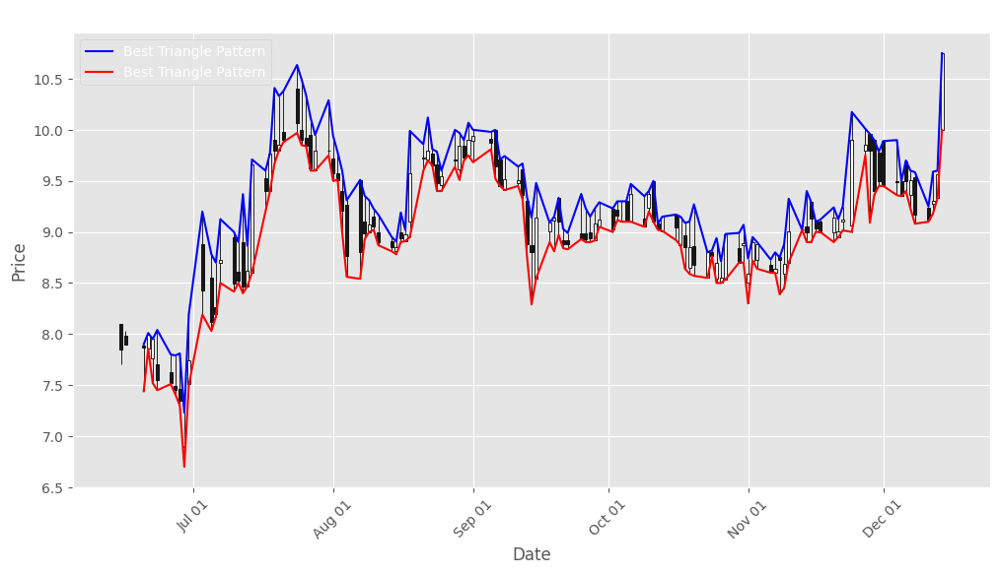

In [150]:
# Main execution
df_raw = get_stock_price_6m_volume('ALVO')
#print(df_raw)
df = df_raw[['Date', 'Open', 'High', 'Low', 'Close', 'Volume']]
df = df[df['Volume'] != 0]
df.reset_index(drop=True, inplace=True)

best_triangle_pattern = find_best_triangle_pattern(df)

# Plot the best triangle pattern
plot_best_triangle_pattern(df, best_triangle_pattern)

#### The code below detects all triangle patterns for the period of 6 months, up until Dec. 15,2023

[*********************100%%**********************]  1 of 1 completed


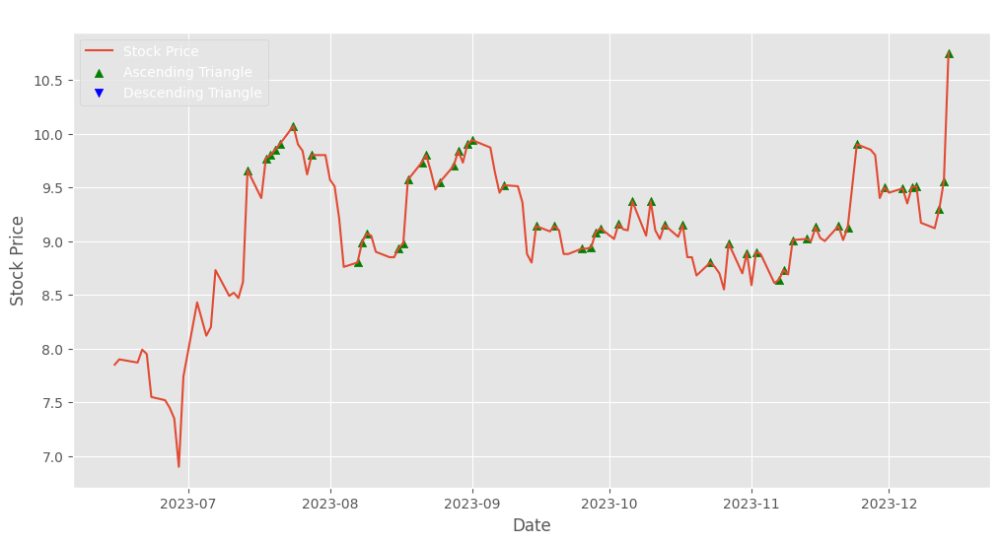

In [61]:

if __name__ == "__main__":
    # Fetch stock data
    df_raw = get_stock_price_6m_volume('ALVO')

    # Check if NA values are in data
    df = df_raw[df_raw['Volume'] != 0]
    df.reset_index(drop=True, inplace=True)
    df.isna().sum()

    # Detect triangle patterns
    df_with_triangles = detect_triangle_pattern_all(df, window=20)  # Adjust the window size as needed

    # Filter data for the year 2023
    df_2023 = df_with_triangles

    # Plot stock prices
    plt.figure(figsize=(12, 6))
    plt.plot(df_2023['Date'], df_2023['Close'], label='Stock Price')

    # Plot ascending triangles
    asc_triangles = df_2023[df_2023['triangle_pattern'] == 'Ascending Triangle']
    plt.scatter(asc_triangles['Date'], asc_triangles['Close'], marker='^', color='g', label='Ascending Triangle')

    # Plot descending triangles
    desc_triangles = df_2023[df_2023['triangle_pattern'] == 'Descending Triangle']
    plt.scatter(desc_triangles['Date'], desc_triangles['Close'], marker='v', color='b', label='Descending Triangle')

    # Customize the plot
    plt.title('Stock Price with Triangle Patterns ELV (2023)')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

## Triangles for MPC

[*********************100%%**********************]  1 of 1 completed


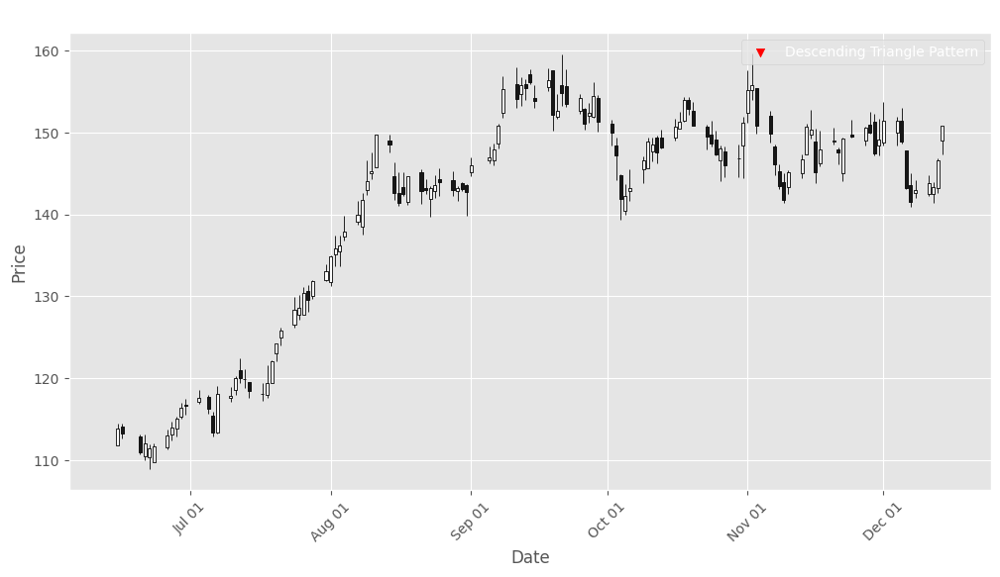

In [151]:




# Main execution
df_raw = get_stock_price_6m_volume('MPC')
df, desc_triangle_indices = detect_descending_triangle_pattern(df_raw)

# Plotting
fig, ax = plt.subplots(figsize=(12, 6))
mpf.plot(df, type='candle', ax=ax, show_nontrading=True)

# Highlight the descending triangle pattern
ax.scatter(df.loc[desc_triangle_indices, 'Date'], df.loc[desc_triangle_indices, 'Low'], 
           color='red', marker='v', label='Descending Triangle Pattern')

# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Price')
plt.title('Stock Price with Descending Triangle Patterns Highlighted')

# Add legend
ax.legend()
plt.show()


[*********************100%%**********************]  1 of 1 completed
          Date        Open        High         Low       Close    Volume  \
0   2023-06-15  111.809998  114.489998  111.809998  113.830002   3240400   
1   2023-06-16  114.059998  114.500000  112.589996  113.290001  10770500   
2   2023-06-20  112.910004  113.129997  110.690002  110.940002   3816300   
3   2023-06-21  110.449997  113.139999  109.940002  112.000000   2943500   
4   2023-06-22  110.300003  111.889999  108.879997  111.419998   2911800   
..         ...         ...         ...         ...         ...       ...   
120 2023-12-06  147.759995  147.759995  143.089996  143.179993   4039700   
121 2023-12-07  143.610001  145.000000  140.979996  141.580002   3606600   
122 2023-12-08  142.610001  144.149994  142.070007  143.020004   3092100   
123 2023-12-11  142.500000  144.740005  142.270004  143.850006   3017800   
124 2023-12-12  142.529999  143.970001  141.449997  143.369995   2930200   

     high_roll_max

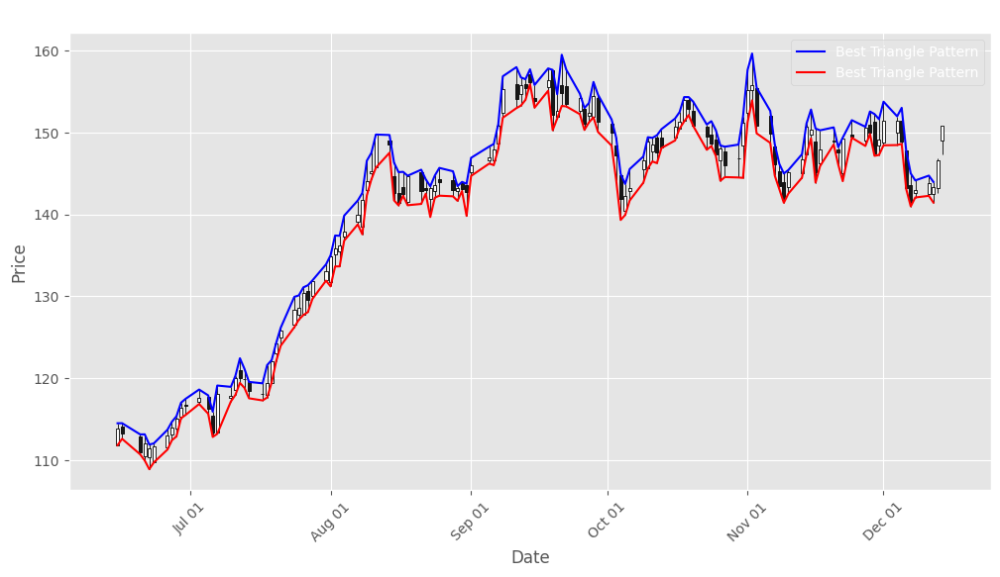

In [152]:

# Main execution
df_raw = get_stock_price_6m_volume('MPC')
df = df_raw[['Date', 'Open', 'High', 'Low', 'Close', 'Volume']]
df = df[df['Volume'] != 0]
df.reset_index(drop=True, inplace=True)

best_triangle_pattern = find_best_triangle_pattern(df)
print(best_triangle_pattern)
# Plot the best descending triangle pattern
plot_best_triangle_pattern(df, best_triangle_pattern)


[*********************100%%**********************]  1 of 1 completed


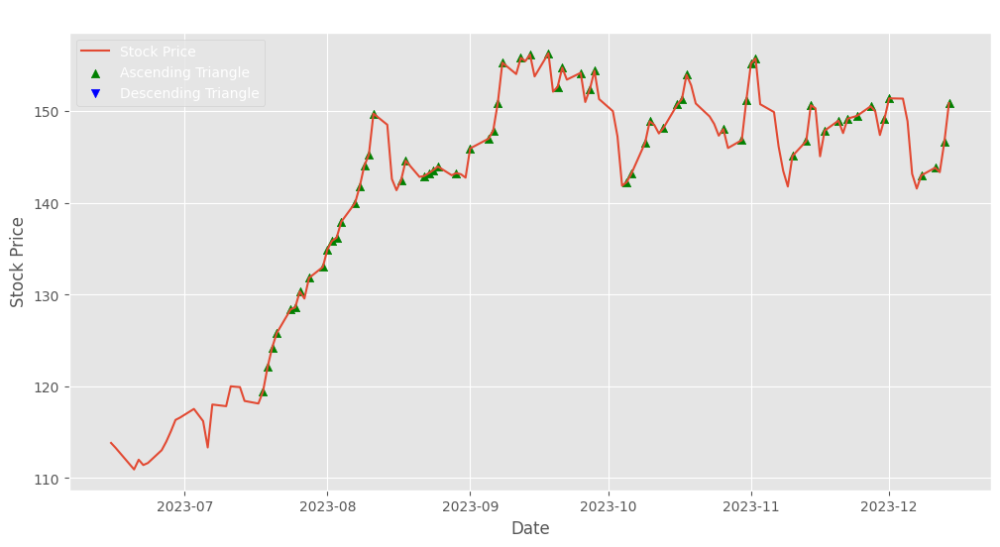

In [155]:

if __name__ == "__main__":
    # Fetch stock data
    df_raw = get_stock_price_6m_volume('MPC')

    # Check if NA values are in data
    df = df_raw[df_raw['Volume'] != 0]
    df.reset_index(drop=True, inplace=True)
    df.isna().sum()

    # Detect triangle patterns
    df_with_triangles = detect_triangle_pattern_all(df, window=20)  # Adjust the window size as needed

    # Filter data for the year 2023
    df_2023 = df_with_triangles

    # Plot stock prices
    plt.figure(figsize=(12, 6))
    plt.plot(df_2023['Date'], df_2023['Close'], label='Stock Price')

    # Plot ascending triangles
    asc_triangles = df_2023[df_2023['triangle_pattern'] == 'Ascending Triangle']
    plt.scatter(asc_triangles['Date'], asc_triangles['Close'], marker='^', color='g', label='Ascending Triangle')

    # Plot descending triangles
    desc_triangles = df_2023[df_2023['triangle_pattern'] == 'Descending Triangle']
    plt.scatter(desc_triangles['Date'], desc_triangles['Close'], marker='v', color='b', label='Descending Triangle')

    # Customize the plot
    plt.title('Stock Price with Triangle Patterns ELV (2023)')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

## Triangles for SQSP

In [157]:


# Main execution
df_raw = get_stock_price_6m_volume('SQSP')
df, desc_triangle_indices = detect_descending_triangle_pattern(df_raw)

# Plotting
fig, ax = plt.subplots(figsize=(12, 6))
mpf.plot(df, type='candle', ax=ax, show_nontrading=True)

# Highlight the descending triangle pattern
ax.scatter(df.loc[desc_triangle_indices, 'Date'], df.loc[desc_triangle_indices, 'Low'], 
           color='red', marker='v', label='Descending Triangle Pattern')

# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Price')
plt.title('Stock Price with Descending Triangle Patterns Highlighted')

# Add legend
ax.legend()
plt.show()


[*********************100%%**********************]  1 of 1 completed


ValueError: too many values to unpack (expected 2)

[*********************100%%**********************]  1 of 1 completed


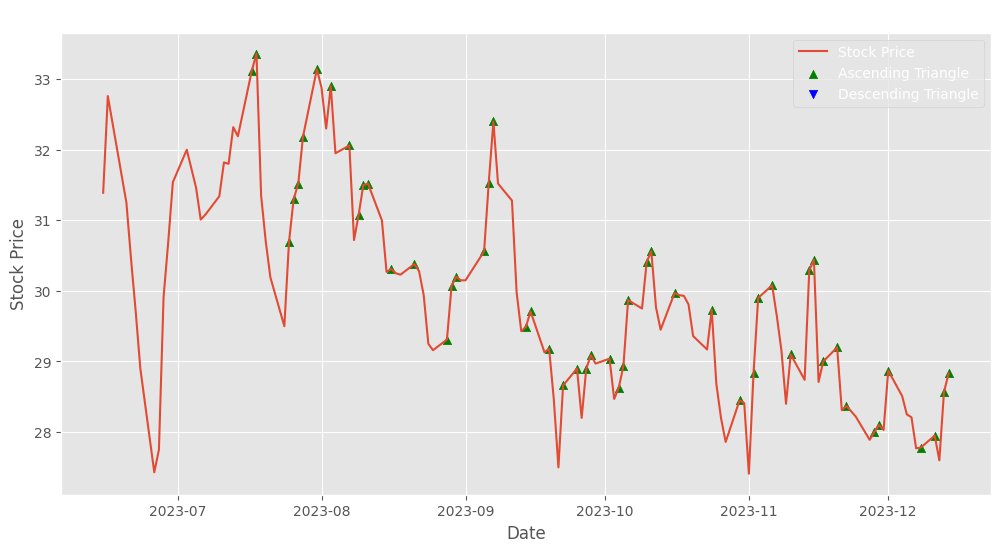

In [66]:

if __name__ == "__main__":
    # Fetch stock data
    df_raw = get_stock_price_6m_volume('SQSP')

    # Check if NA values are in data
    df = df_raw[df_raw['Volume'] != 0]
    df.reset_index(drop=True, inplace=True)
    df.isna().sum()

    # Detect triangle patterns
    df_with_triangles = detect_triangle_pattern_all(df, window=20)  # Adjust the window size as needed

    # Filter data for the year 2023
    df_2023 = df_with_triangles

    # Plot stock prices
    plt.figure(figsize=(12, 6))
    plt.plot(df_2023['Date'], df_2023['Close'], label='Stock Price')

    # Plot ascending triangles
    asc_triangles = df_2023[df_2023['triangle_pattern'] == 'Ascending Triangle']
    plt.scatter(asc_triangles['Date'], asc_triangles['Close'], marker='^', color='g', label='Ascending Triangle')

    # Plot descending triangles
    desc_triangles = df_2023[df_2023['triangle_pattern'] == 'Descending Triangle']
    plt.scatter(desc_triangles['Date'], desc_triangles['Close'], marker='v', color='b', label='Descending Triangle')

    # Customize the plot
    plt.title('Stock Price with Triangle Patterns ELV (2023)')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

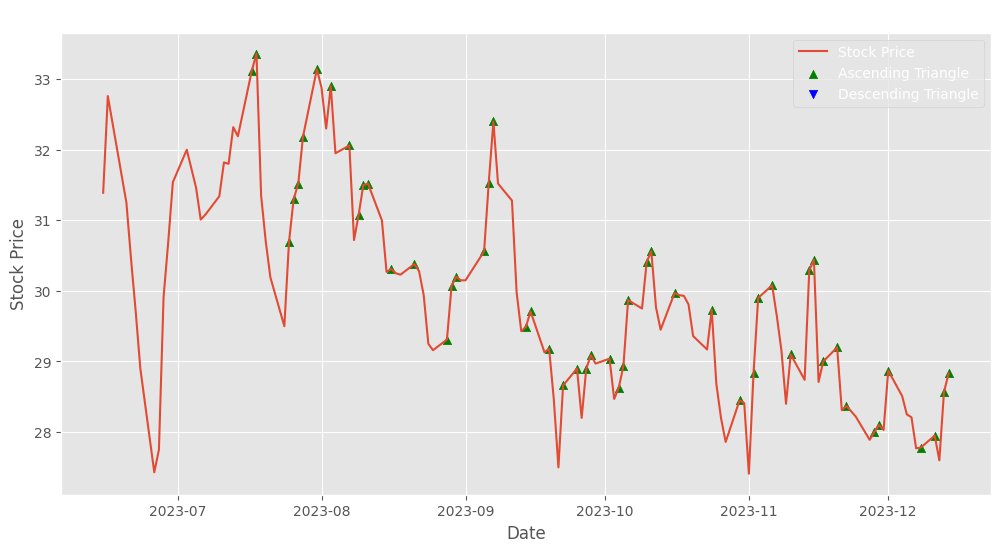

In [67]:
# Filter data for the year 2023
df_2023 = df_with_triangles

# Plot stock prices
plt.figure(figsize=(12, 6))
plt.plot(df_2023['Date'], df_2023['Close'], label='Stock Price')

# Plot ascending triangles
asc_triangles = df_2023[df_2023['triangle_pattern'] == 'Ascending Triangle']
plt.scatter(asc_triangles['Date'], asc_triangles['Close'], marker='^', color='g', label='Ascending Triangle')

# Plot descending triangles
desc_triangles = df_2023[df_2023['triangle_pattern'] == 'Descending Triangle']
plt.scatter(desc_triangles['Date'], desc_triangles['Close'], marker='v', color='b', label='Descending Triangle')

# Customize the plot
plt.title('Stock Price with Triangle Patterns SQSP (2023)')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

## Channel UP and Channel DOWN for MU, NOK, NVS, DBX, NVDA

**The algorithm below will detect the best  Channel patterns, be them Angled UP, DOWN or HORIZONTAL. Only the most important (best) channels will be printed out.**

**It will detect the best channel patterns in the period 2023/06/16 to 2023/12/15.**

**However, for the algorithm to work on such a small date-time, I needed to take the HOURLY candlestick patterns (high, low, open, close) for that period.**

#### Important! By changing the `WINDOW_SIZE` variable in the `detect_channel_6m`, you can specify what the maximum range of the Channel should be. 1 means 1 hour, 24 means 24 hours or 1 day, 60x24 means 60 days. Choose the range that you want to check. If nothing is printed, that means that no good channels were found. By Default, the window size will be 240, which means 10 days (24hx10). That parameter can be mentioned as part of the function, when calling it.

In [68]:
import numpy as np
import numba
from scipy.stats import linregress
from tqdm import tqdm
import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import datetime

In [69]:
# Define the ticker symbol and the date range
ticker_symbol = "MU"
start_date = datetime.datetime(2023, 6, 15)
end_date = datetime.datetime(2023, 12, 15)

# Download hourly data
ohlcv = yf.download(ticker_symbol, start=start_date, end=end_date, interval='1h')

# Print the first few rows of the hourly data
print(ohlcv.head())




[*********************100%%**********************]  1 of 1 completed
                                Open       High        Low      Close  \
Datetime                                                                
2023-06-15 09:30:00-04:00  68.589996  69.480003  68.410004  68.720001   
2023-06-15 10:30:00-04:00  68.730003  69.019997  68.435097  69.019997   
2023-06-15 11:30:00-04:00  69.014999  69.199997  68.720001  68.820000   
2023-06-15 12:30:00-04:00  68.809998  68.889999  68.360001  68.629997   
2023-06-15 13:30:00-04:00  68.650002  69.080002  68.650002  69.029999   

                           Adj Close   Volume  
Datetime                                       
2023-06-15 09:30:00-04:00  68.720001  2172735  
2023-06-15 10:30:00-04:00  69.019997   910624  
2023-06-15 11:30:00-04:00  68.820000   884195  
2023-06-15 12:30:00-04:00  68.629997   673183  
2023-06-15 13:30:00-04:00  69.029999   808448  


In [70]:

def shift_nb(arr, num, fill_value=np.nan):
    if num >= 0:
        return np.concatenate((np.full(num, fill_value), arr[:-num]))
    else:
        return np.concatenate((arr[-num:], np.full(-num, fill_value)))

def get_ranked_extrema(h, l, max_neighbours=10):
    maxima = np.zeros(shape=(h.shape[0]), dtype=int)
    minima = np.zeros(shape=(h.shape[0]), dtype=int)

    for n in range(1, max_neighbours+1):
        maxima_filter = np.where(maxima == n-1)[0]
        maxima[maxima_filter] += ((h >= shift_nb(h, n)) & (h > shift_nb(h, -n)))[maxima_filter]

        minima_filter = np.where(minima == n-1)[0]
        minima[minima_filter] += ((l <= shift_nb(l, n)) & (l < shift_nb(l, -n)))[minima_filter]

    return maxima, minima

def get_best_channel(
        h, l, c, max_rank_possible=2000, min_rank_for_detection=200,
        min_pivot_point_count=3, max_age_latest_pivot_point=40,
        min_r_squared=0.0, max_p_value=1.0, max_crossing_perc=0.2,
        min_pivot_points_inbetween=0):
    # Calculate the rank of each high and low
    all_maxima, all_minima = get_ranked_extrema(h, l, max_rank_possible)

    # Filter out minima whose rank is too low
    all_minima_x = np.where(all_minima >= min_rank_for_detection)[0]
    all_minima_y = l[all_minima_x]
    all_minima_weights = all_minima[all_minima_x]

    # Filter out maxima whose rank is too low
    all_maxima_x = np.where(all_maxima >= min_rank_for_detection)[0]
    all_maxima_y = h[all_maxima_x]
    all_maxima_weights = all_maxima[all_maxima_x]

    best_lower_trend_line = None
    best_lower_trend_stats = None
    best_upper_trend_line = None
    best_upper_trend_stats = None
    best_channel_score = -1

    # "Sort minima by their rank and after each iteration remove the minimum with the lowest rank"
    for minima_count in range(min_pivot_point_count, all_minima_x.shape[0]+1):
        minima_comb = np.argpartition(all_minima_weights, -minima_count)[-minima_count:]

        # Get combination of minima
        minima_x = all_minima_x[minima_comb]
        minima_y = all_minima_y[minima_comb]
        minima_weights = all_minima_weights[minima_comb]

        # Do linear regression for these minima
        min_slope, min_intercept, min_r, min_p, min_err = linregress(minima_x, minima_y)
        # The coefficient of determination needs to be high enough
        if min_r*min_r <= min_r_squared or min_p >= max_p_value:
            continue

        # Calculate the regression line
        min_line_x = np.arange(np.min(minima_x), c.shape[0])
        min_line_y = min_intercept + min_slope * min_line_x
        # Calculate the crossing price percentage
        min_crossing_price_perc = np.mean(c[min_line_x] < min_line_y)
        # This needs to be sufficiently small
        if min_crossing_price_perc >= max_crossing_perc:
            continue

        # "Sort maxima by their rank and after each iteration remove the maximum with the lowest rank"
        for maxima_count in range(min_pivot_point_count, all_maxima_x.shape[0]+1):
            maxima_comb = np.argpartition(all_maxima_weights, -maxima_count)[-maxima_count:]

            # Get combination of maxima
            maxima_x = all_maxima_x[maxima_comb]
            maxima_y = all_maxima_y[maxima_comb]
            maxima_weights = all_maxima_weights[maxima_comb]

            # At least <min_pivot_points_inbetween> minima need to be between the first and the last maxima
            if np.sum((np.min(maxima_x) <= minima_x) & (minima_x <= np.max(maxima_x))) < min_pivot_points_inbetween:
                continue
            # At least <min_pivot_points_inbetween> maxima need to be between the first and the last minima
            if np.sum((np.min(minima_x) <= maxima_x) & (maxima_x <= np.max(minima_x))) < min_pivot_points_inbetween:
                continue

            # Do linear regression for these maxima
            max_slope, max_intercept, max_r, max_p, max_err = linregress(maxima_x, maxima_y)
            # The coefficient of determination needs to be high enough
            if max_r*max_r <= min_r_squared or max_p >= max_p_value:
                continue

            # Calculate the regression line
            max_line_x = np.arange(np.min(maxima_x), c.shape[0])
            max_line_y = max_intercept + max_slope * max_line_x
            # Calculate the crossing price percentage
            max_crossing_price_perc = np.mean(c[max_line_x] > max_line_y)
            # This needs to be sufficiently small
            if max_crossing_price_perc >= max_crossing_perc:
                continue

            # The latest pivot point should not be too old
            if c.shape[0] - max(np.max(minima_x), np.max(maxima_x)) > max_age_latest_pivot_point:
                continue

            # Calculate a score that makes channel A better than channel B (difficult and can be definitely changed)
            channel_score = (np.sum(minima_weights) * np.sum(maxima_weights)) * min_r*min_r * max_r*max_r * (1-min_p)*(1-max_p)

            if best_channel_score < channel_score:
                best_channel_score = channel_score
                best_lower_trend_line = {
                    "line_x": min_line_x,
                    "line_y": min_line_y,
                    "points_x": minima_x,
                    "points_y": minima_y,
                    "points_weights": minima_weights
                }
                best_lower_trend_stats = {
                    "slope": min_slope,
                    "intercept": min_intercept,
                    "r": min_r,
                    "p": min_p,
                    "err": min_err,
                    "crossing_price_perc": min_crossing_price_perc
                }
                best_upper_trend_line = {
                    "line_x": max_line_x,
                    "line_y": max_line_y,
                    "points_x": maxima_x,
                    "points_y": maxima_y,
                    "points_weights": maxima_weights
                }
                best_upper_trend_stats = {
                    "slope": max_slope,
                    "intercept": max_intercept,
                    "r": max_r,
                    "p": max_p,
                    "err": max_err,
                    "crossing_price_perc": max_crossing_price_perc
                }

    return best_lower_trend_line, best_lower_trend_stats, best_upper_trend_line, best_upper_trend_stats, best_channel_score

In [71]:
def detect_channel_6m(df,WINDOW_SIZE=240):
    
    WINDOW_SIZE = WINDOW_SIZE # this means the max window size(channel size) is 10 days (24hx10)
    PLOT_FUTURE_PERIODS = 20
    
    last_plotted_i = -999
    
    for i in tqdm(range(WINDOW_SIZE, ohlcv.shape[0])):
        o = ohlcv.iloc[i-WINDOW_SIZE+1:i+1, 0].values
        h = ohlcv.iloc[i-WINDOW_SIZE+1:i+1, 1].values
        l = ohlcv.iloc[i-WINDOW_SIZE+1:i+1, 2].values
        c = ohlcv.iloc[i-WINDOW_SIZE+1:i+1, 3].values
        v = ohlcv.iloc[i-WINDOW_SIZE+1:i+1, 5].values
    
        best_lower_trend_line, best_lower_trend_stats, best_upper_trend_line, best_upper_trend_stats, best_channel_score = get_best_channel(
            h=h, l=l, c=c,
            max_rank_possible=20,
            min_rank_for_detection=3,
            min_pivot_point_count=3,
            max_age_latest_pivot_point=20,
            min_r_squared=0.9,
            max_p_value=0.5,
            max_crossing_perc=0.05,
            min_pivot_points_inbetween=1
        )
    
        if best_channel_score < 1000:
            continue
    
        # This is just to prevent plotting the same channels a lot times in a row,
        # so the very first appearance of the channel is shown
        if i - last_plotted_i < 10:
            continue
    
        #print(" best_lower_trend_line: ", best_lower_trend_line)
        #print("best_lower_trend_stats: ", best_lower_trend_stats)
        #print(" best_upper_trend_line: ", best_upper_trend_line)
        #print("best_upper_trend_stats: ", best_upper_trend_stats)
        #print("    best_channel_score: ", best_channel_score)
    
        plot_future_periods = min(i+PLOT_FUTURE_PERIODS+1, ohlcv.shape[0])
        o1 = ohlcv.iloc[i-WINDOW_SIZE+1:plot_future_periods, 0].values
        h1 = ohlcv.iloc[i-WINDOW_SIZE+1:plot_future_periods, 1].values
        l1 = ohlcv.iloc[i-WINDOW_SIZE+1:plot_future_periods, 2].values
        c1 = ohlcv.iloc[i-WINDOW_SIZE+1:plot_future_periods, 3].values
        v1 = ohlcv.iloc[i-WINDOW_SIZE+1:plot_future_periods, 5].values
    
        fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                    vertical_spacing=0.07, subplot_titles=('OHLC', 'Volume'),
                    row_width=[0.15, 0.7], )
    
        fig.add_trace(go.Candlestick(
            x=np.arange(o1.shape[0]),
            open=o1,
            high=h1,
            low=l1,
            close=c1,
            name="OHLC"),
            row=1, col=1
        )
    
        fig.add_trace(go.Scatter(x=best_upper_trend_line["points_x"], y=best_upper_trend_line["points_y"], text=['Rank: {}'.format(r) for r in best_upper_trend_line["points_weights"]], mode="markers",opacity=0.7, marker=dict(
                color='Purple',
                size=best_upper_trend_line["points_weights"]/2+10
            ), showlegend=False), row=1, col=1)
        fig.add_trace(go.Scatter(x=best_lower_trend_line["points_x"], y=best_lower_trend_line["points_y"], text=['Rank: {}'.format(r) for r in best_lower_trend_line["points_weights"]], mode="markers", opacity=0.7, marker=dict(
                color='Blue',
                size=best_lower_trend_line["points_weights"]/2+10
            ), showlegend=False), row=1, col=1)
        fig.add_trace(go.Scatter(x=best_upper_trend_line["line_x"], y=best_upper_trend_line["line_y"], opacity=0.7, showlegend=False, text=f"Error: {best_upper_trend_stats['err']}<br>R: {best_upper_trend_stats['r']}<br>P: {best_upper_trend_stats['p']}"), row=1, col=1)
        fig.add_trace(go.Scatter(x=best_lower_trend_line["line_x"], y=best_lower_trend_line["line_y"], opacity=0.7, showlegend=False, text=f"Error: {best_lower_trend_stats['err']}<br>R: {best_lower_trend_stats['r']}<br>P: {best_lower_trend_stats['p']}"), row=1, col=1)
    
        fig.add_vline(x=WINDOW_SIZE-1, line_width=1, line_dash="dash", line_color="black", row=1, col=1, annotation_text="now")
    
        fig.add_trace(go.Bar(x=np.arange(o1.shape[0]), y=v1, showlegend=False), row=2, col=1)
        fig.update_layout(height=500, width=800)
        fig.update(layout_xaxis_rangeslider_visible=False)
        fig.show()
    
        last_plotted_i = i
    
        #if input("Hit any key for the next plot! 'q' for exit.").lower().strip() == "q":
            #break

### Detecting best Channels for MU: 15-06-2023 to 15-12-2023

 13%|██████████▋                                                                     | 86/641 [00:00<00:01, 285.02it/s]

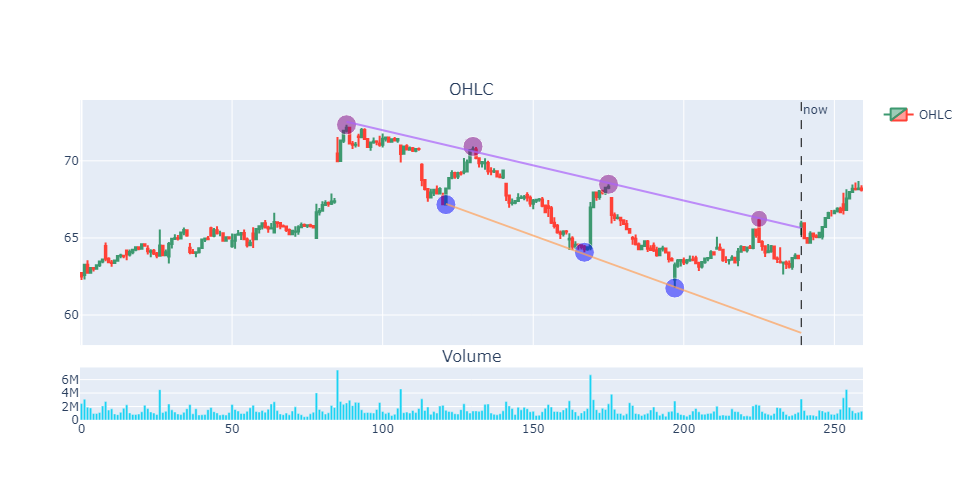

100%|███████████████████████████████████████████████████████████████████████████████| 641/641 [00:02<00:00, 247.78it/s]


In [72]:
detect_channel_6m(ohlcv)

## Channel up/down/horizontal for NOK

[*********************100%%**********************]  1 of 1 completed


 58%|█████████████████████████████████████████████▋                                 | 371/641 [00:01<00:01, 253.08it/s]

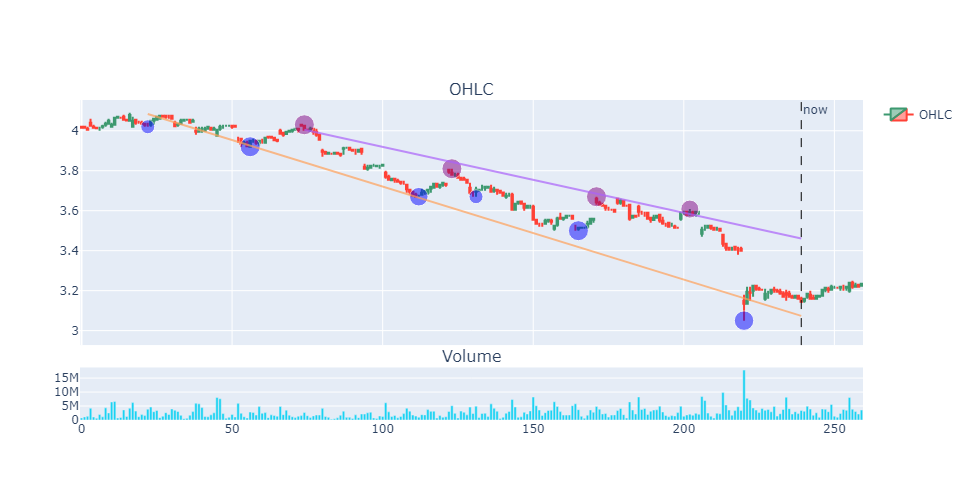

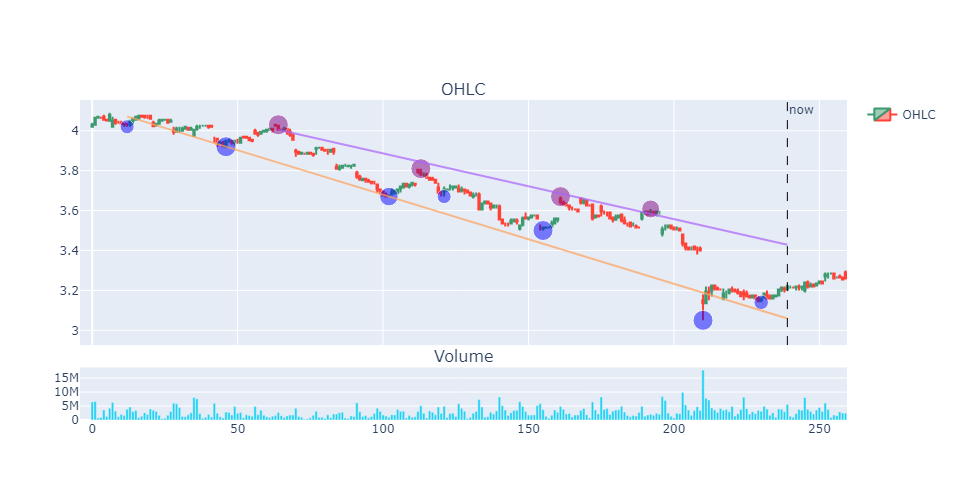

 62%|█████████████████████████████████████████████████▏                             | 399/641 [00:01<00:01, 144.27it/s]

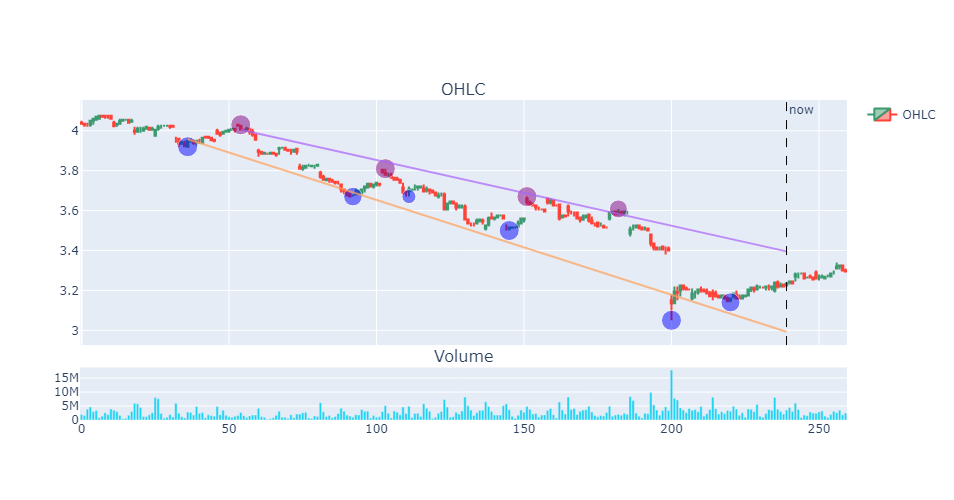

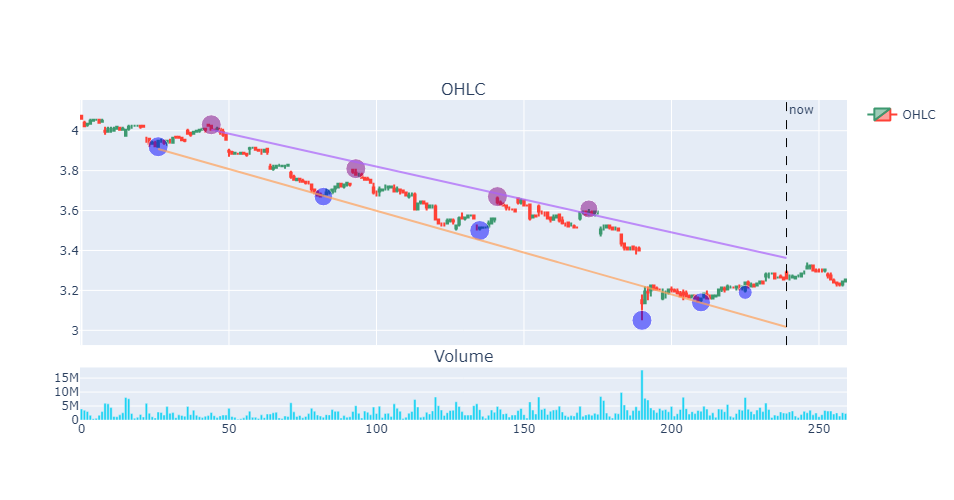

 66%|███████████████████████████████████████████████████▊                           | 420/641 [00:02<00:02, 101.35it/s]

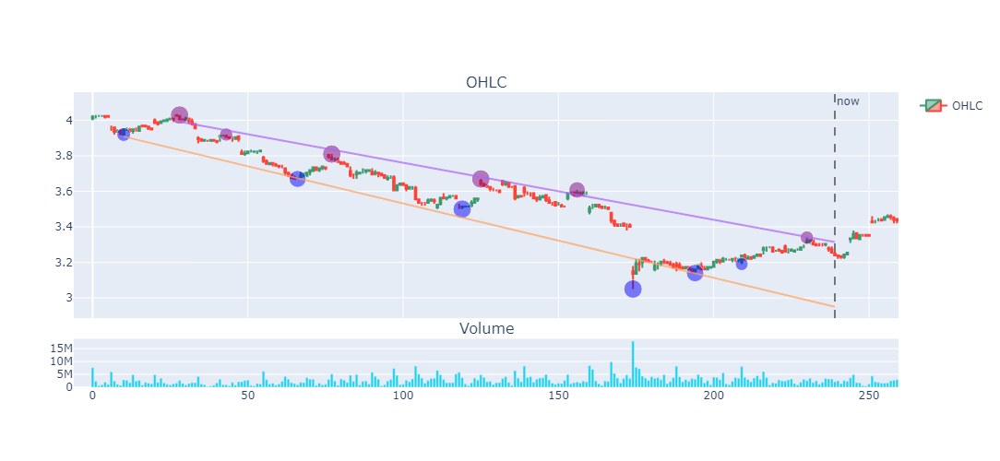

 68%|██████████████████████████████████████████████████████▌                         | 437/641 [00:02<00:02, 93.71it/s]

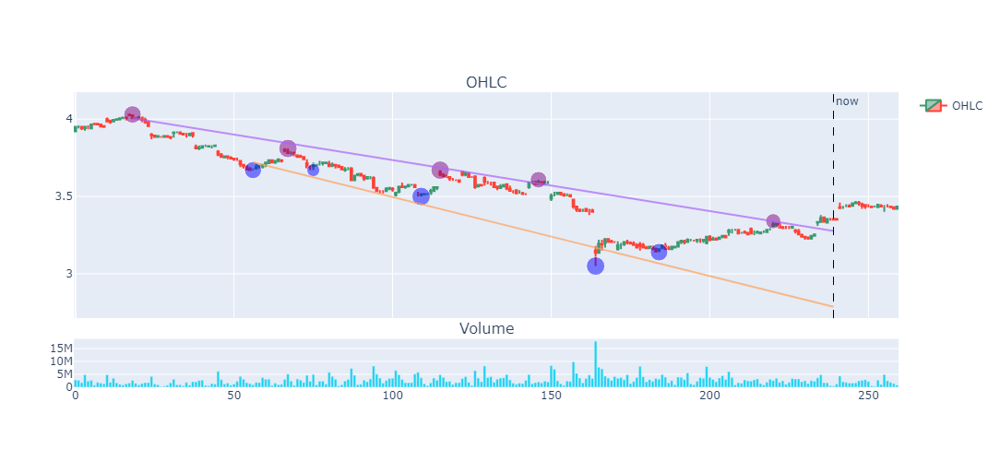

100%|███████████████████████████████████████████████████████████████████████████████| 641/641 [00:03<00:00, 193.54it/s]


In [73]:
# Define the ticker symbol and the date range
ticker_symbol = "NOK"
start_date = datetime.datetime(2023, 6, 15)
end_date = datetime.datetime(2023, 12, 15)

# Download hourly data
ohlcv = yf.download(ticker_symbol, start=start_date, end=end_date, interval='1h')

detect_channel_6m(ohlcv)


## For NVS

[*********************100%%**********************]  1 of 1 completed


 17%|█████████████▎                                                                 | 108/641 [00:00<00:01, 335.20it/s]

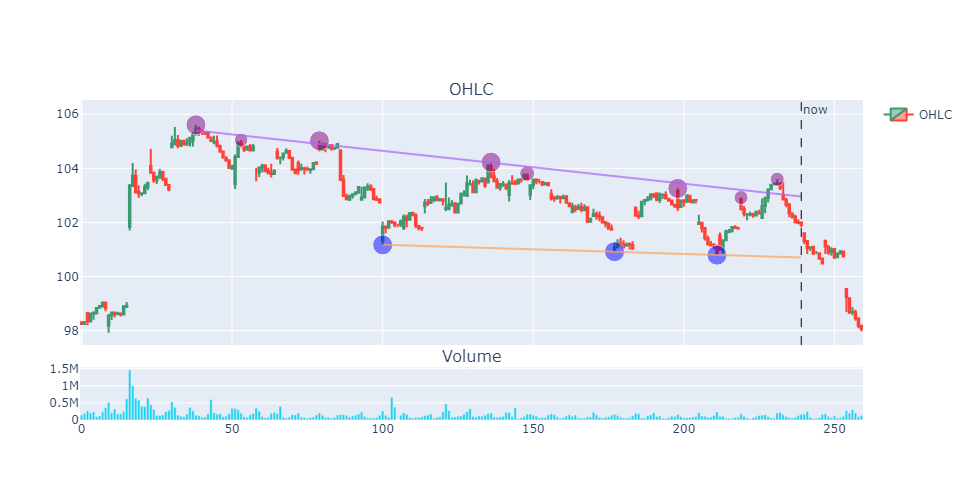

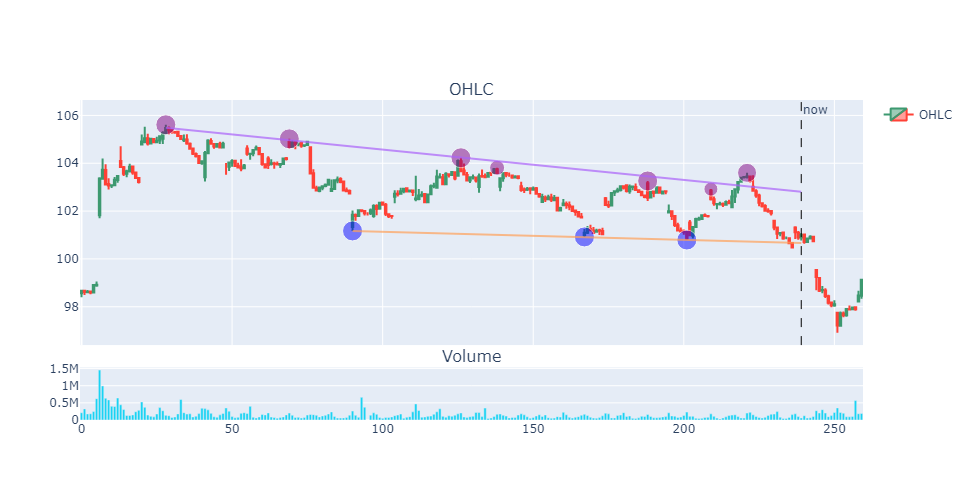

100%|███████████████████████████████████████████████████████████████████████████████| 641/641 [00:02<00:00, 289.46it/s]


In [74]:
# Define the ticker symbol and the date range
ticker_symbol = "NVS"
start_date = datetime.datetime(2023, 6, 15)
end_date = datetime.datetime(2023, 12, 15)

# Download hourly data
ohlcv = yf.download(ticker_symbol, start=start_date, end=end_date, interval='1h')

detect_channel_6m(ohlcv)


## For DBX

[*********************100%%**********************]  1 of 1 completed


  0%|                                                                                          | 0/761 [00:00<?, ?it/s]

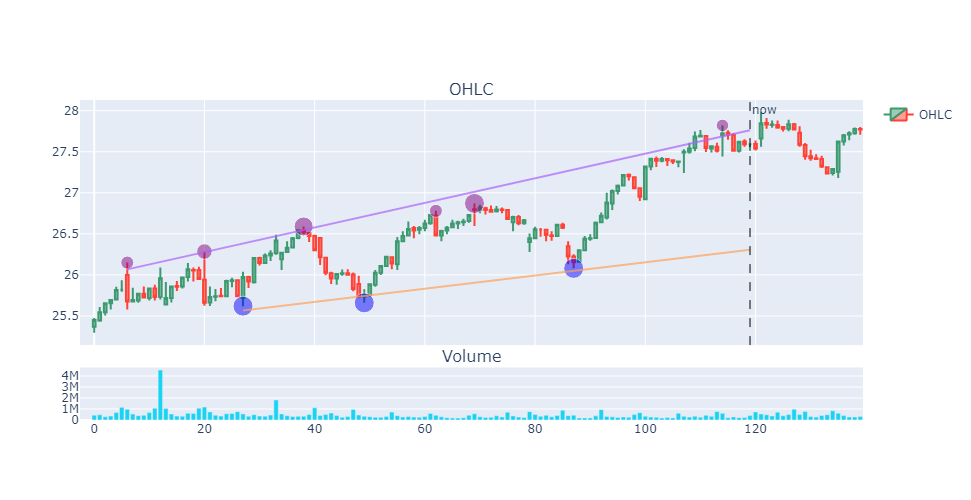

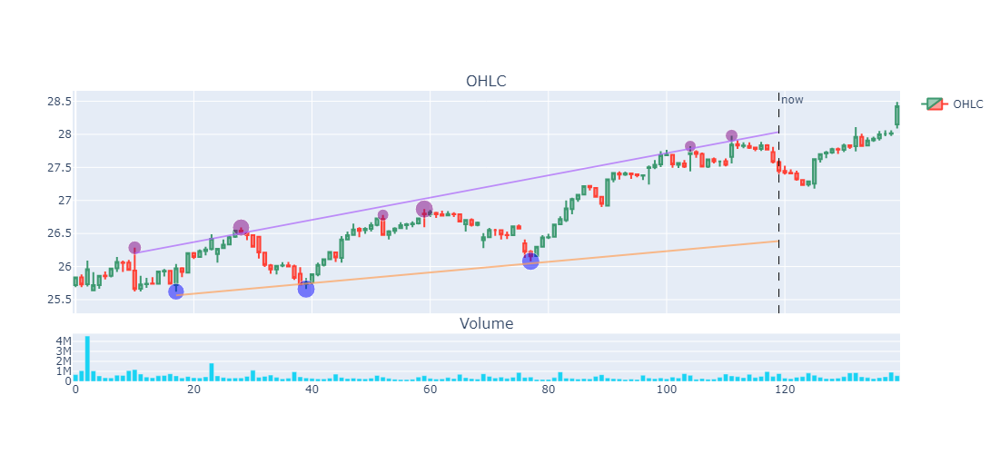

  1%|█▏                                                                              | 11/761 [00:00<00:07, 100.58it/s]

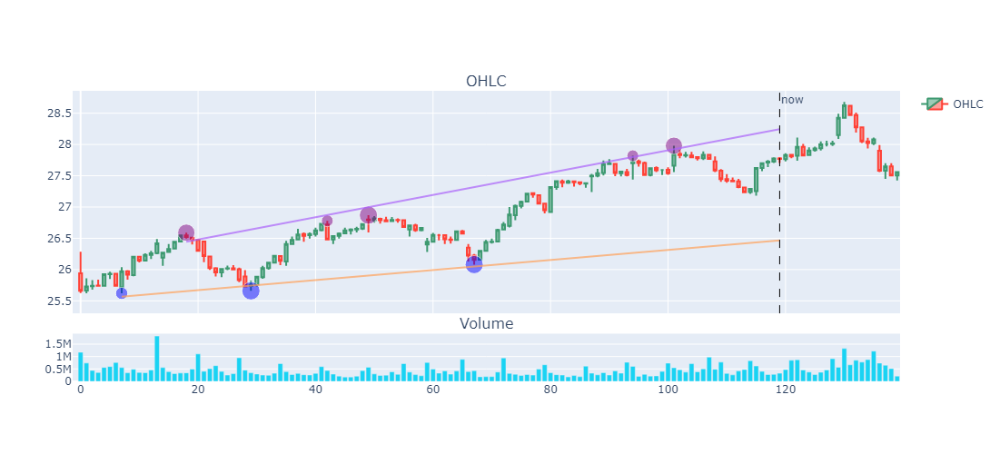

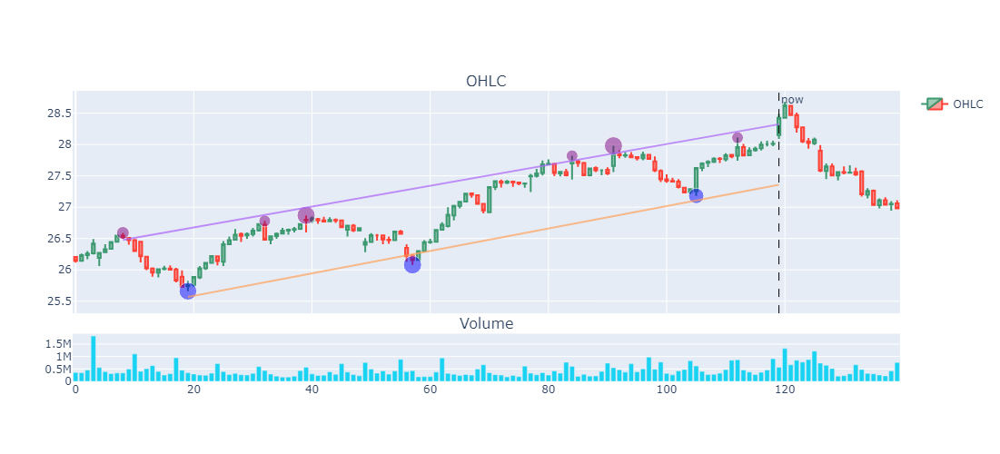

  4%|███▎                                                                            | 31/761 [00:00<00:05, 130.89it/s]

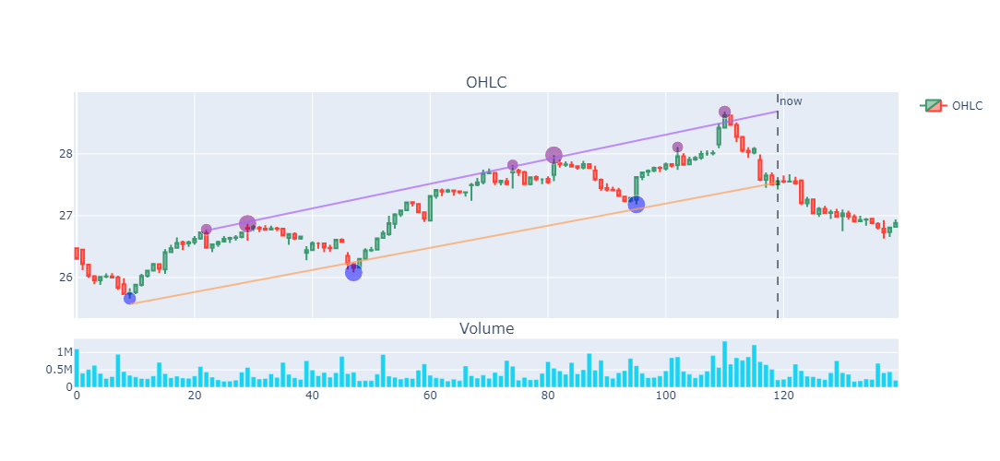

 39%|██████████████████████████████▍                                                | 293/761 [00:00<00:01, 389.99it/s]

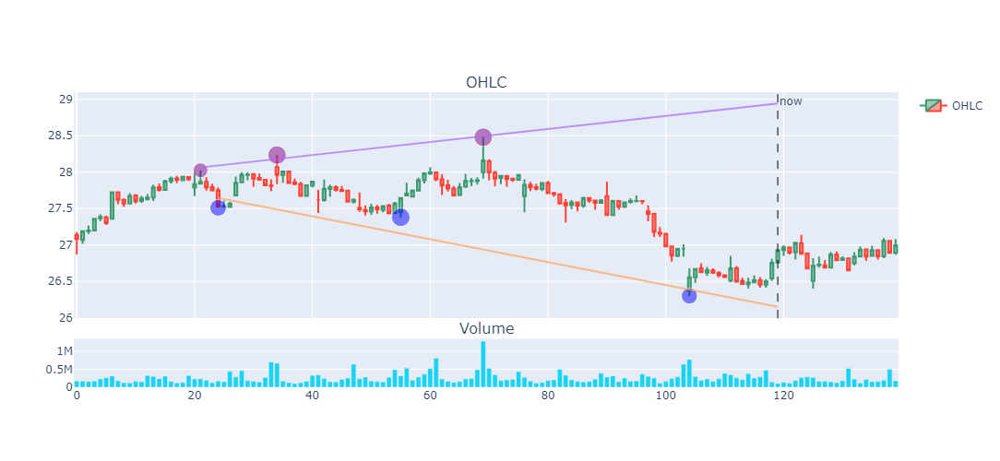

 51%|████████████████████████████████████████                                       | 386/761 [00:01<00:00, 395.82it/s]

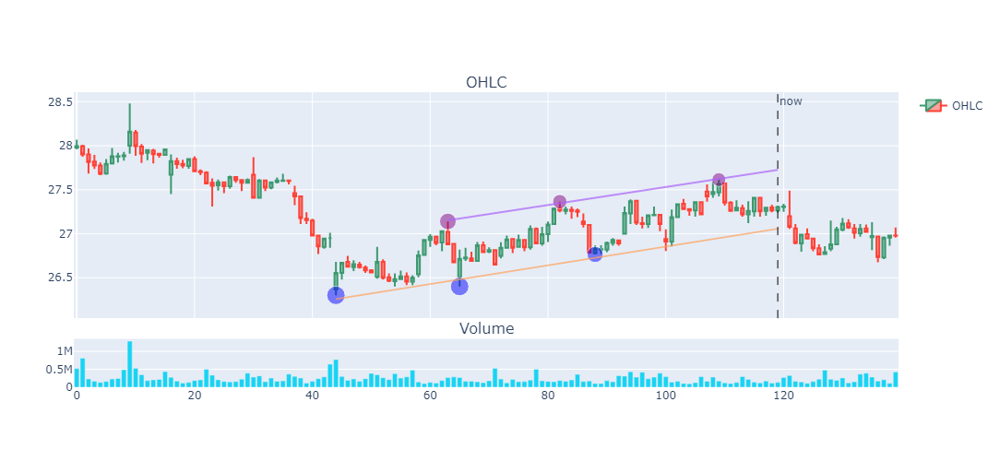

 70%|███████████████████████████████████████████████████████                        | 530/761 [00:01<00:00, 416.19it/s]

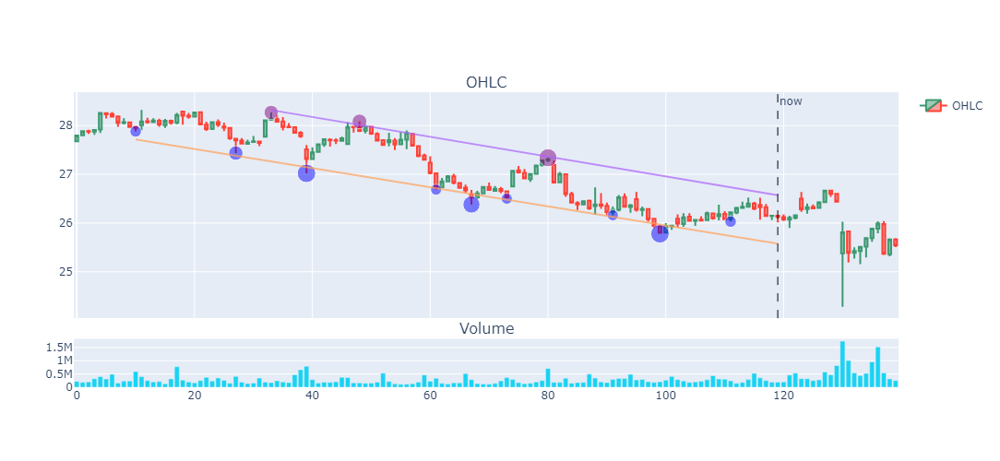

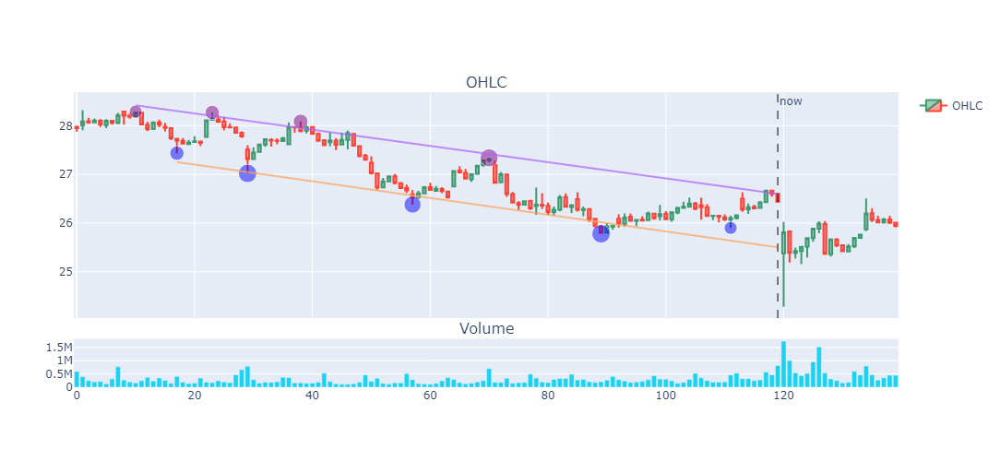

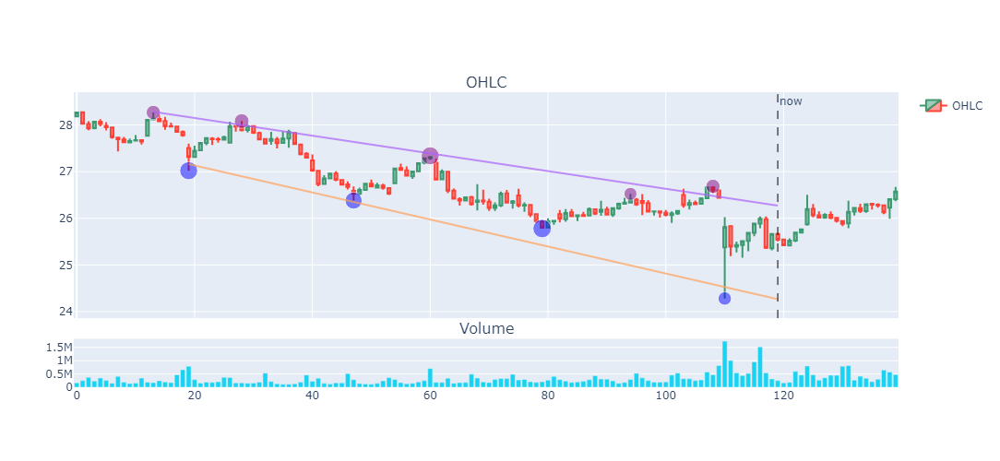

 75%|███████████████████████████████████████████████████████████▍                   | 573/761 [00:01<00:00, 234.14it/s]

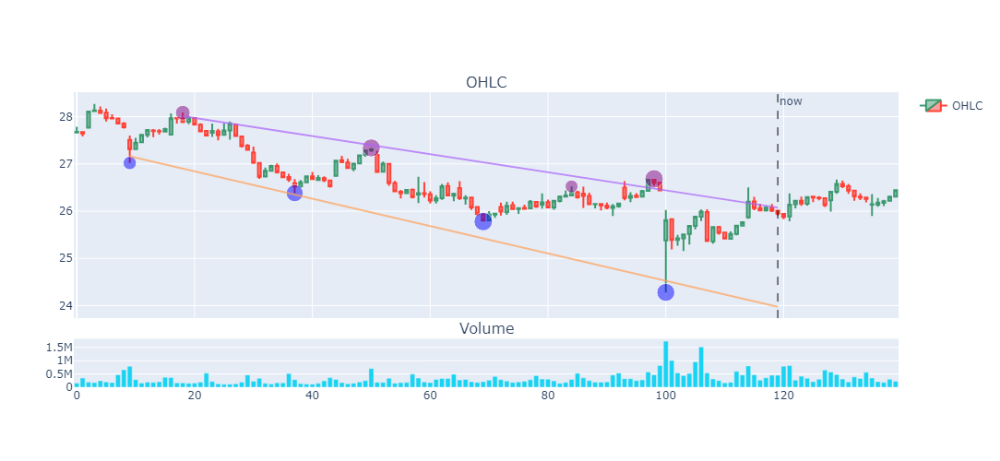

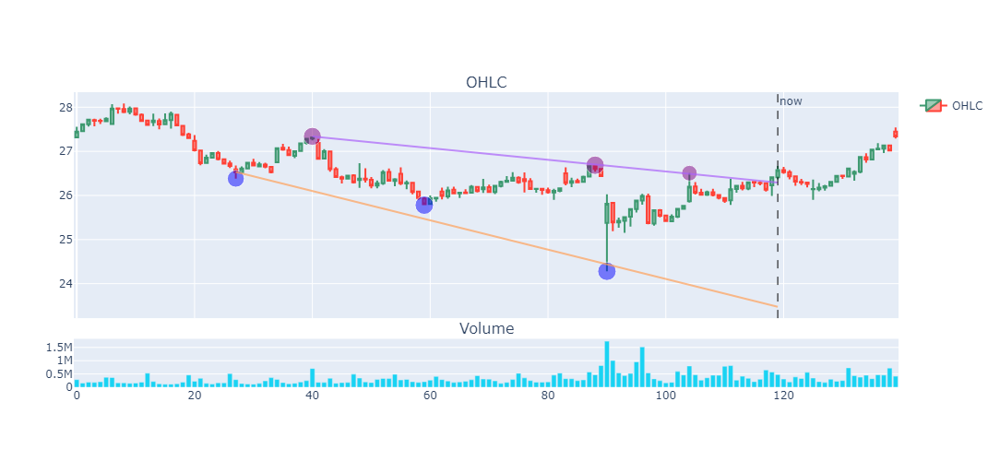

 86%|███████████████████████████████████████████████████████████████████▊           | 653/761 [00:02<00:00, 248.94it/s]

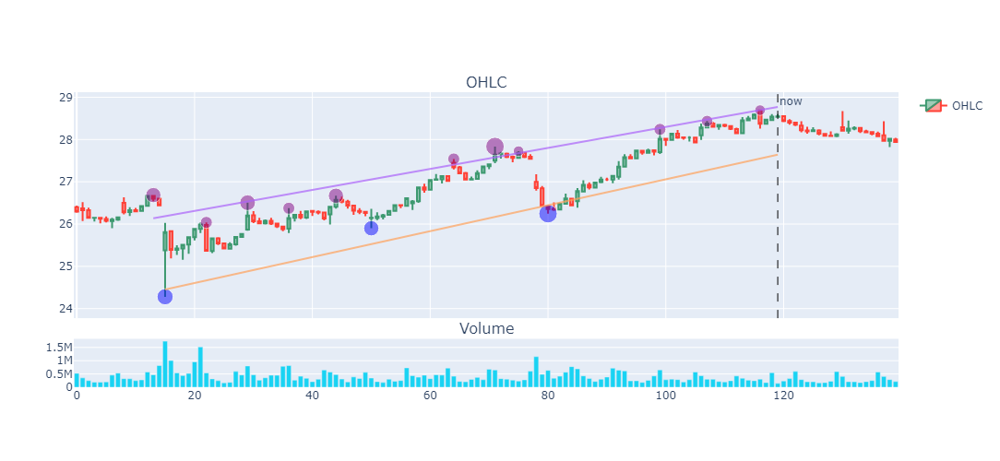

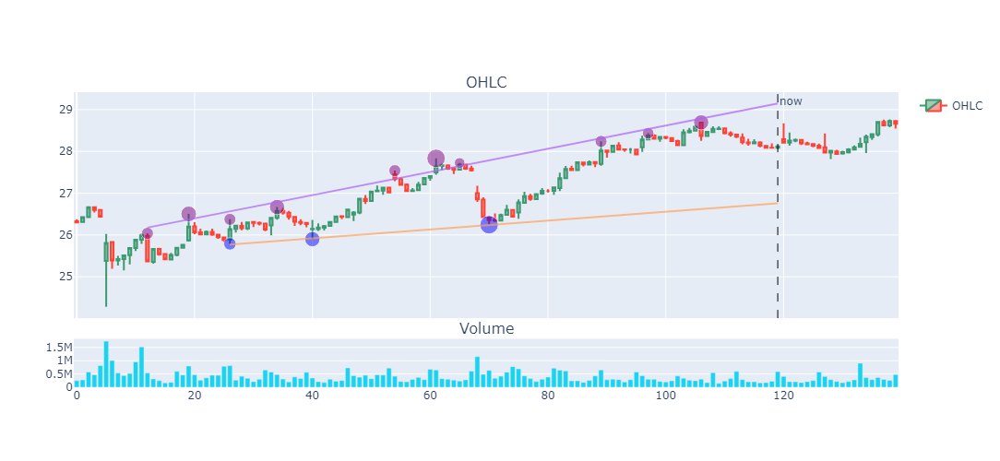

 90%|███████████████████████████████████████████████████████████████████████▏       | 686/761 [00:02<00:00, 232.10it/s]

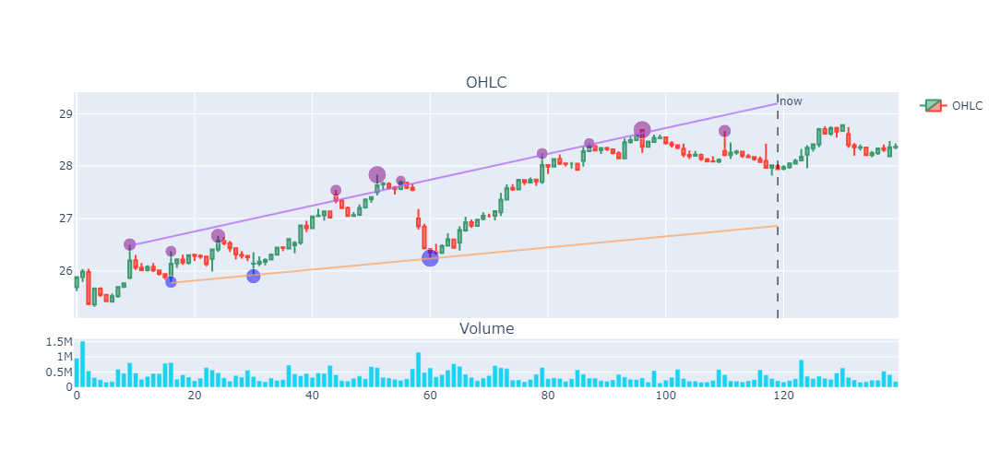

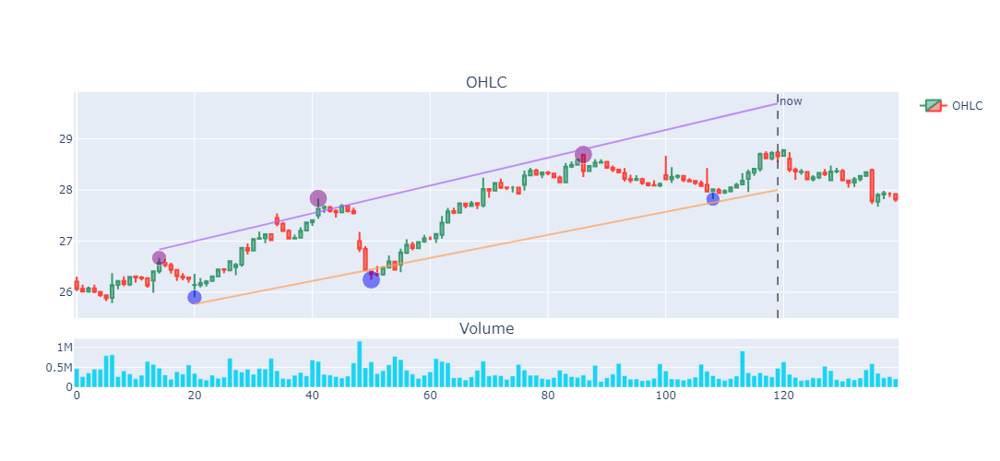

100%|███████████████████████████████████████████████████████████████████████████████| 761/761 [00:02<00:00, 286.69it/s]


In [75]:
# Define the ticker symbol and the date range
ticker_symbol = "DBX"
start_date = datetime.datetime(2023, 6, 15)
end_date = datetime.datetime(2023, 12, 15)

# Download hourly data
ohlcv = yf.download(ticker_symbol, start=start_date, end=end_date, interval='1h')

detect_channel_6m(ohlcv,WINDOW_SIZE = 120) # 5 days window size


## For NVDA

[*********************100%%**********************]  1 of 1 completed


  0%|                                                                                          | 0/713 [00:00<?, ?it/s]

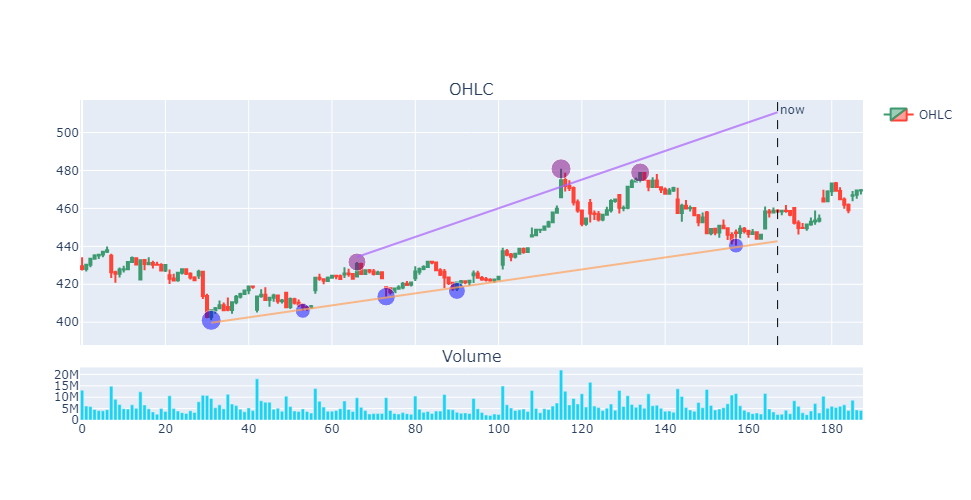

  2%|█▋                                                                              | 15/713 [00:00<00:05, 137.15it/s]

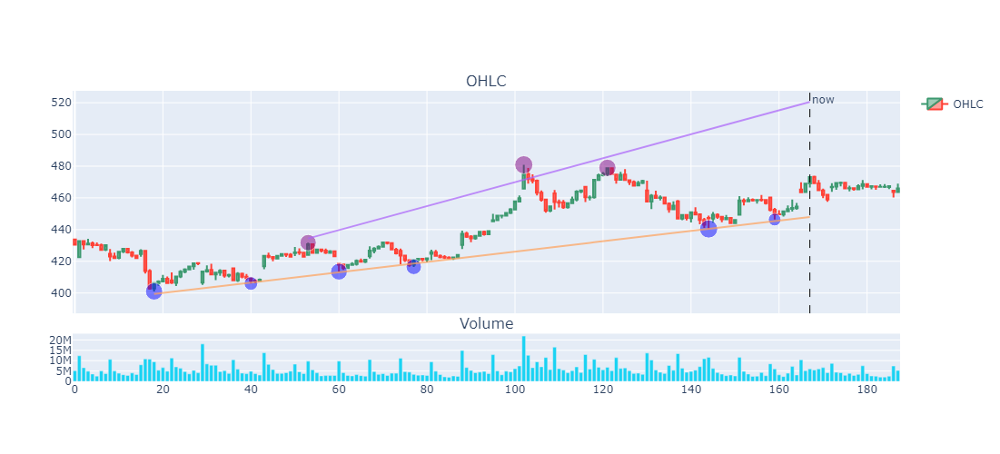

  6%|████▌                                                                            | 40/713 [00:00<00:06, 96.90it/s]

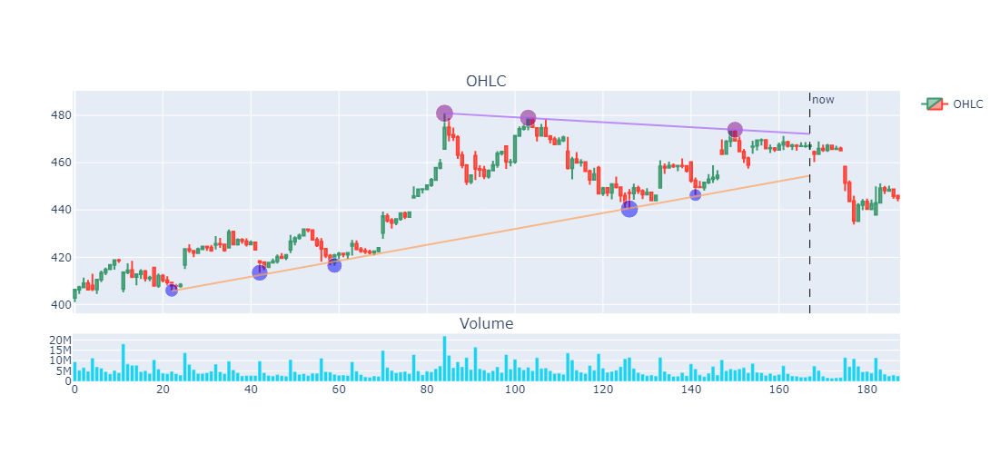

 45%|███████████████████████████████████▊                                           | 323/713 [00:01<00:01, 321.75it/s]

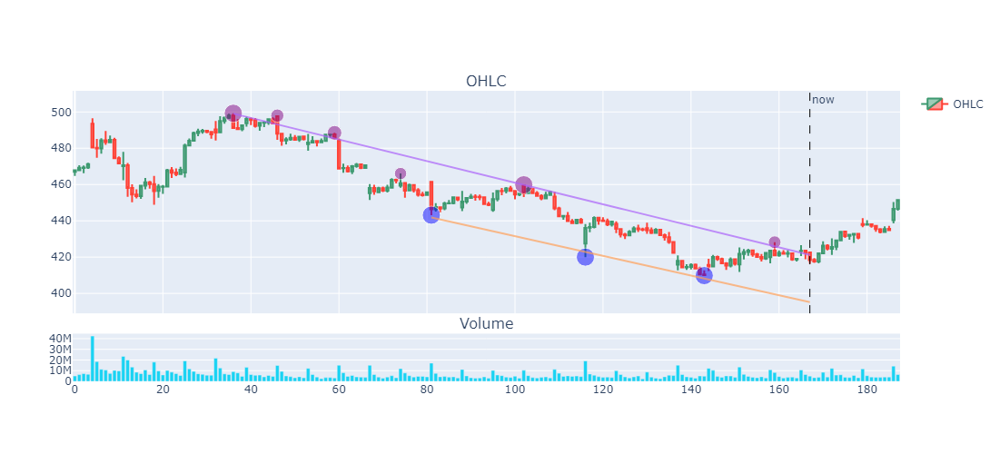

 68%|█████████████████████████████████████████████████████▋                         | 484/713 [00:01<00:00, 344.81it/s]

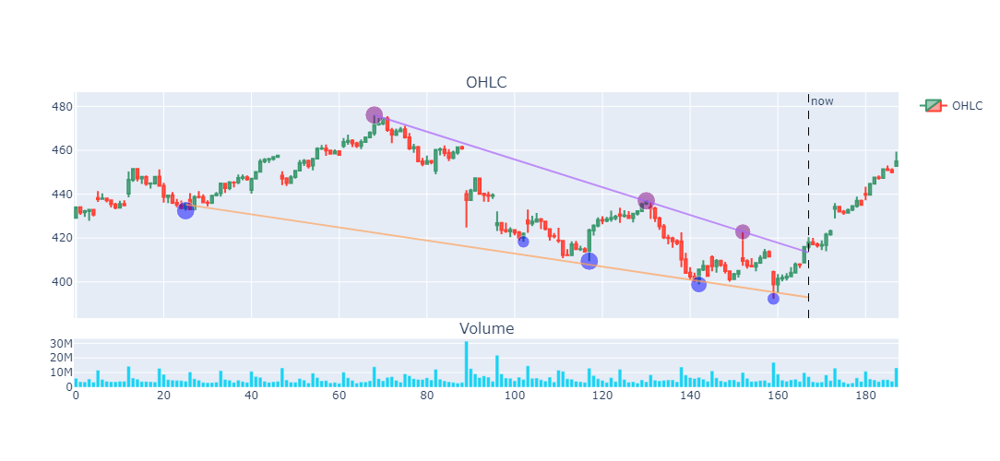

100%|███████████████████████████████████████████████████████████████████████████████| 713/713 [00:03<00:00, 219.17it/s]


In [76]:
# Define the ticker symbol and the date range
ticker_symbol = "NVDA"
start_date = datetime.datetime(2023, 6, 15)
end_date = datetime.datetime(2023, 12, 15)

# Download hourly data
ohlcv = yf.download(ticker_symbol, start=start_date, end=end_date, interval='1h')

detect_channel_6m(ohlcv,WINDOW_SIZE = 168)#7 days window size (7x24)



# Stretch Goal for Task 2 
Let's define a function that will detect double Top. It's pretty simmilar for both double top and double bottom, so I will define to do both in one,

In [77]:
def detect_double_top(df, window=30, threshold=0.05):
    # Define the rolling window
    roll_window = window
    # Define a threshold to check for the range of pattern
    range_threshold = threshold

    # Create a rolling window for High and Low
    df['high_roll_max'] = df['High'].rolling(window=roll_window).max()
    df['low_roll_min'] = df['Low'].rolling(window=roll_window).min()

    # Create a boolean mask for Double Top pattern
    mask_double_top = (df['high_roll_max'] >= df['High'].shift(1)) & (df['high_roll_max'] >= df['High'].shift(-1)) & (df['High'] < df['High'].shift(1)) & (df['High'] < df['High'].shift(-1)) & ((df['High'].shift(1) - df['Low'].shift(1)) <= range_threshold * (df['High'].shift(1) + df['Low'].shift(1))/2) & ((df['High'].shift(-1) - df['Low'].shift(-1)) <= range_threshold * (df['High'].shift(-1) + df['Low'].shift(-1))/2)
    # Create a boolean mask for Double Bottom pattern
    #mask_double_bottom = (df['low_roll_min'] <= df['Low'].shift(1)) & (df['low_roll_min'] <= df['Low'].shift(-1)) & (df['Low'] > df['Low'].shift(1)) & (df['Low'] > df['Low'].shift(-1)) & ((df['High'].shift(1) - df['Low'].shift(1)) <= range_threshold * (df['High'].shift(1) + df['Low'].shift(1))/2) & ((df['High'].shift(-1) - df['Low'].shift(-1)) <= range_threshold * (df['High'].shift(-1) + df['Low'].shift(-1))/2)

    # Create a new column for Double Top and Double Bottom pattern and populate it using the boolean masks
    df['double_pattern'] = np.nan
    df.loc[mask_double_top, 'double_pattern'] = 'Double Top'
    #df.loc[mask_double_bottom, 'double_pattern'] = 'Double Bottom'

    return df

# Double top For NFLX in 2023

[*********************100%%**********************]  1 of 1 completed


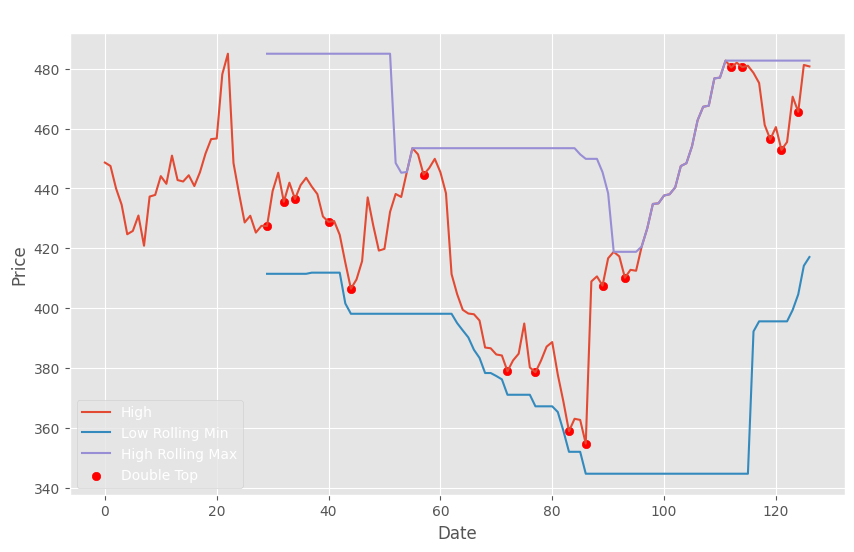

,Date,Open,High,Low,Close,Volume,high_roll_max,low_roll_min,double_pattern
0,2023-06-15,444.100006,448.649994,439.500000,445.269989,7099900,NaN,NaN,NaN
1,2023-06-16,446.149994,447.510010,430.899994,431.959991,8745500,NaN,NaN,NaN
2,2023-06-20,430.179993,440.000000,430.000000,434.700012,4756000,NaN,NaN,NaN
3,2023-06-21,432.649994,434.549988,422.540009,424.450012,5146400,NaN,NaN,NaN
4,2023-06-22,422.929993,424.709991,418.679993,422.480011,4869500,NaN,NaN,NaN
5,2023-06-23,418.589996,425.820007,417.730011,424.019989,8293900,NaN,NaN,NaN
6,2023-06-26,422.440002,430.959991,414.899994,415.940002,4640000,NaN,NaN,NaN
7,2023-06-27,417.390015,420.880005,411.500000,417.079987,4818100,NaN,NaN,NaN
8,2023-06-28,423.100006,437.290009,422.890015,429.839996,8811300,NaN,NaN,NaN
9,2023-06-29,434.329987,437.850006,426.149994,428.239990,4932300,NaN,NaN,NaN


In [78]:
df_NFLX = get_stock_price_6m_volume('NFLX')#getting only 6 months, from 15-06 to 15-12 in year 2023


#df_NFLX  = df_NFLX .reset_index()
df = df_NFLX [['Date','Open','High','Low','Close','Volume']]
#Check if NA values are in data
df=df[df['Volume']!=0]
df.reset_index(drop=True, inplace=True)
df.isna().sum()


#print(df_with_channels.head(60))
#---------------#############


df_2023_doubletop = detect_double_top(df)
df_2023_doubletop = df_2023_doubletop[df_2023_doubletop['Date'].dt.year == 2023]

# Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_2023_doubletop.index, df_2023_doubletop['High'], label='High')
plt.plot(df_2023_doubletop.index, df_2023_doubletop['low_roll_min'], label='Low Rolling Min')
plt.plot(df_2023_doubletop.index, df_2023_doubletop['high_roll_max'], label='High Rolling Max')

# Mark Double Tops on the plot
double_top_indices = df_2023_doubletop.index[df_2023_doubletop['double_pattern'] == 'Double Top']
double_top_values = df_2023_doubletop.loc[df_2023_doubletop['double_pattern'] == 'Double Top', 'High']
plt.scatter(double_top_indices, double_top_values, color='red', label='Double Top')

plt.title('Double Top Detection')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()
df_2023_doubletop.head(50)

# Double Top for YELP in 2023

[*********************100%%**********************]  1 of 1 completed


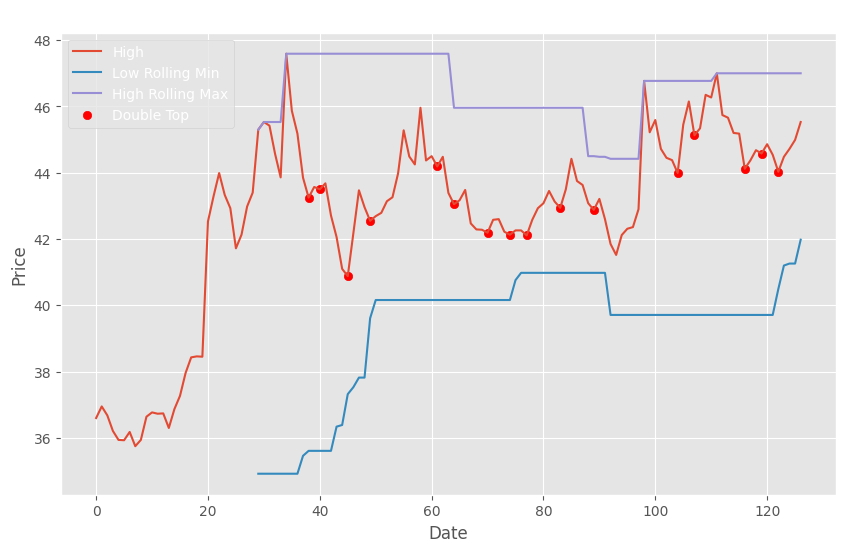

,Date,Open,High,Low,Close,Volume,high_roll_max,low_roll_min,double_pattern
0,2023-06-15,35.560001,36.599998,35.279999,36.560001,617000,NaN,NaN,NaN
1,2023-06-16,36.849998,36.950001,36.009998,36.410000,1581800,NaN,NaN,NaN
2,2023-06-20,36.290001,36.680000,36.070000,36.459999,623300,NaN,NaN,NaN
3,2023-06-21,36.189999,36.209999,35.389999,35.549999,544900,NaN,NaN,NaN
4,2023-06-22,35.369999,35.939999,35.169998,35.919998,533200,NaN,NaN,NaN
5,2023-06-23,35.340000,35.930000,35.080002,35.910000,810600,NaN,NaN,NaN
6,2023-06-26,35.680000,36.180000,35.080002,35.090000,449500,NaN,NaN,NaN
7,2023-06-27,35.250000,35.750000,34.919998,35.430000,349400,NaN,NaN,NaN
8,2023-06-28,35.470001,35.939999,35.459999,35.849998,342200,NaN,NaN,NaN
9,2023-06-29,35.869999,36.639999,35.830002,36.470001,451800,NaN,NaN,NaN


In [79]:
df_YELP = get_stock_price_6m_volume('YELP')#getting only 6 months, from 15-06 to 15-12 in year 2023


#df_YELP  = df_YELP.reset_index()
df = df_YELP [['Date','Open','High','Low','Close','Volume']]
#Check if NA values are in data
df=df[df['Volume']!=0]
df.reset_index(drop=True, inplace=True)
df.isna().sum()


#print(df_with_channels.head(60))
#---------------#############


df_2023_doubletop = detect_double_top(df)
df_2023_doubletop = df_2023_doubletop[df_2023_doubletop['Date'].dt.year == 2023]

# Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_2023_doubletop.index, df_2023_doubletop['High'], label='High')
plt.plot(df_2023_doubletop.index, df_2023_doubletop['low_roll_min'], label='Low Rolling Min')
plt.plot(df_2023_doubletop.index, df_2023_doubletop['high_roll_max'], label='High Rolling Max')

# Mark Double Tops on the plot
double_top_indices = df_2023_doubletop.index[df_2023_doubletop['double_pattern'] == 'Double Top']
double_top_values = df_2023_doubletop.loc[df_2023_doubletop['double_pattern'] == 'Double Top', 'High']
plt.scatter(double_top_indices, double_top_values, color='red', label='Double Top')

plt.title('Double Top Detection')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()
df_2023_doubletop.head(50)

## Multiple tops Detection Function 

In [80]:
def detect_multiple_tops(df, window=3):
# Define the rolling window
    roll_window = window
    # Create a rolling window for High and Low
    df['high_roll_max'] = df['High'].rolling(window=roll_window).max()
    df['low_roll_min'] = df['Low'].rolling(window=roll_window).min()
    df['close_roll_max'] = df['Close'].rolling(window=roll_window).max()
    df['close_roll_min'] = df['Close'].rolling(window=roll_window).min()
    # Create a boolean mask for multiple top pattern
    mask_top = (df['high_roll_max'] >= df['High'].shift(1)) & (df['close_roll_max'] < df['Close'].shift(1))
    # Create a boolean mask for multiple bottom pattern
    #mask_bottom = (df['low_roll_min'] <= df['Low'].shift(1)) & (df['close_roll_min'] > df['Close'].shift(1))
    # Create a new column for multiple top bottom pattern and populate it using the boolean masks
    df['multiple_top_bottom_pattern'] = np.nan
    df.loc[mask_top, 'multiple_top_bottom_pattern'] = 'Multiple Top'
    #df.loc[mask_bottom, 'multiple_top_bottom_pattern'] = 'Multiple Bottom'
    return df

## Multiple Top for CPG

[*********************100%%**********************]  1 of 1 completed


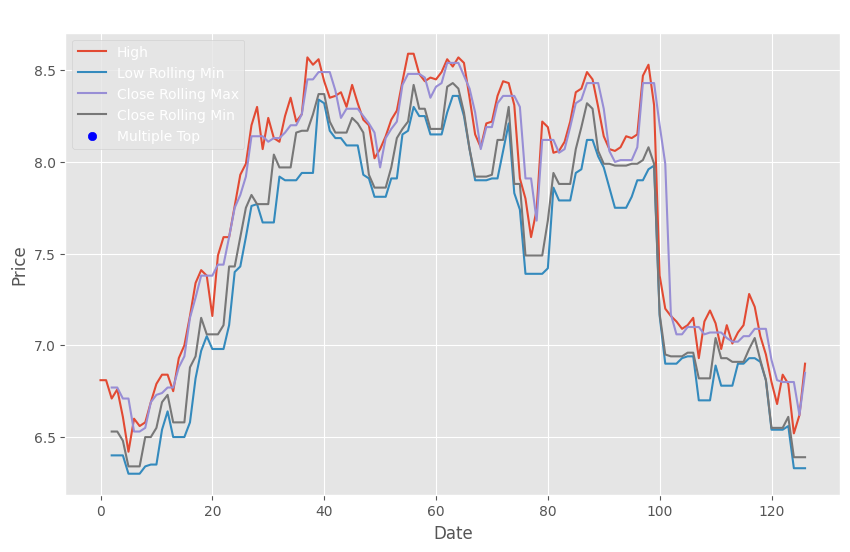

In [81]:
df_CPG = get_stock_price_6m_volume('CPG')


#df_CPG  = df_CPG.reset_index()
df = df_CPG [['Date','Open','High','Low','Close','Volume']]
#Check if NA values are in data
df=df[df['Volume']!=0]
df.reset_index(drop=True, inplace=True)
df.isna().sum()


#print(df_with_channels.head(60))
#---------------#############


df_2023_multitop = detect_multiple_tops(df)
df_2023_multitop = df_2023_multitop[df_2023_multitop['Date'].dt.year == 2023]


# Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_2023_multitop.index, df_2023_multitop['High'], label='High')
plt.plot(df_2023_multitop.index, df_2023_multitop['low_roll_min'], label='Low Rolling Min')
plt.plot(df_2023_multitop.index, df_2023_multitop['close_roll_max'], label='Close Rolling Max')
plt.plot(df_2023_multitop.index, df_2023_multitop['close_roll_min'], label='Close Rolling Min')

# Mark Multiple Tops on the plot
multiple_top_indices = df_2023_multitop.index[df_2023_multitop['multiple_top_bottom_pattern'] == 'Multiple Top']
multiple_top_values = df_2023_multitop.loc[df_2023_multitop['multiple_top_bottom_pattern'] == 'Multiple Top', 'High']
plt.scatter(multiple_top_indices, multiple_top_values, color='blue', label='Multiple Top')

plt.title('Multiple Top Detection')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Apparently there are no multiple tops?... or I did something wrong.

## Multiple Top for MAT

[*********************100%%**********************]  1 of 1 completed


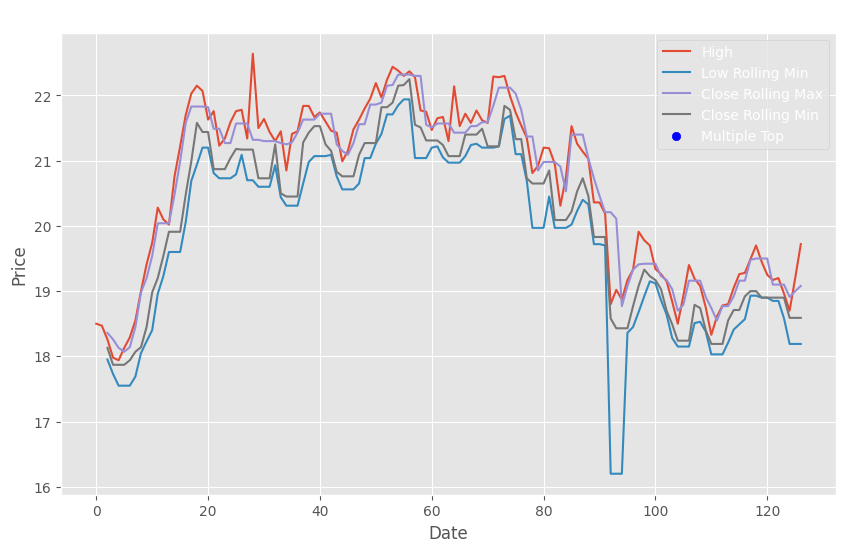

In [82]:
df_MAT = get_stock_price_6m_volume('MAT')


#df_MAT  = df_MAT.reset_index()
df = df_MAT [['Date','Open','High','Low','Close','Volume']]
#Check if NA values are in data
df=df[df['Volume']!=0]
df.reset_index(drop=True, inplace=True)
df.isna().sum()

#---------------#############


df_2023_multitop = detect_multiple_tops(df)
df_2023_multitop = df_2023_multitop[df_2023_multitop['Date'].dt.year == 2023]
#print(df_2023_multitop.head(60))

# Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_2023_multitop.index, df_2023_multitop['High'], label='High')
plt.plot(df_2023_multitop.index, df_2023_multitop['low_roll_min'], label='Low Rolling Min')
plt.plot(df_2023_multitop.index, df_2023_multitop['close_roll_max'], label='Close Rolling Max')
plt.plot(df_2023_multitop.index, df_2023_multitop['close_roll_min'], label='Close Rolling Min')

# Mark Multiple Tops on the plot
multiple_top_indices = df_2023_multitop.index[df_2023_multitop['multiple_top_bottom_pattern'] == 'Multiple Top']
multiple_top_values = df_2023_multitop.loc[df_2023_multitop['multiple_top_bottom_pattern'] == 'Multiple Top', 'High']
plt.scatter(multiple_top_indices, multiple_top_values, color='blue', label='Multiple Top')

plt.title('Multiple Top Detection')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

## Detect Multiple Bottoms Function

In [83]:
def detect_multiple_bots(df, window=3):
# Define the rolling window
    roll_window = window
    # Create a rolling window for High and Low
    df['high_roll_max'] = df['High'].rolling(window=roll_window).max()
    df['low_roll_min'] = df['Low'].rolling(window=roll_window).min()
    df['close_roll_max'] = df['Close'].rolling(window=roll_window).max()
    df['close_roll_min'] = df['Close'].rolling(window=roll_window).min()
    # Create a boolean mask for multiple top pattern
    mask_top = (df['high_roll_max'] >= df['High'].shift(1)) & (df['close_roll_max'] < df['Close'].shift(1))
    # Create a boolean mask for multiple bottom pattern
    mask_bottom = (df['low_roll_min'] <= df['Low'].shift(1)) & (df['close_roll_min'] > df['Close'].shift(1))
    # Create a new column for multiple top bottom pattern and populate it using the boolean masks
    df['multiple_top_bottom_pattern'] = np.nan
    df.loc[mask_top, 'multiple_top_bottom_pattern'] = 'Multiple Top'
    df.loc[mask_bottom, 'multiple_top_bottom_pattern'] = 'Multiple Bottom'
    return df

## Multiple Bots for SE

[*********************100%%**********************]  1 of 1 completed


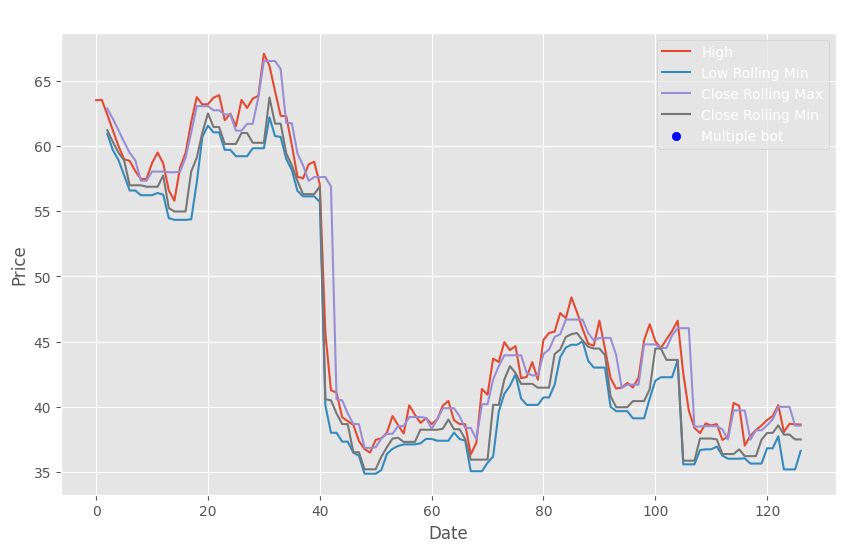

In [84]:
df_SE = get_stock_price_6m_volume('SE')


#df_SE  = df_SE.reset_index()
df = df_SE [['Date','Open','High','Low','Close','Volume']]
#Check if NA values are in data
df=df[df['Volume']!=0]
df.reset_index(drop=True, inplace=True)
df.isna().sum()
#---------------#############

df_2023_multitop = detect_multiple_bots(df)
df_2023_multitop = df_2023_multitop[df_2023_multitop['Date'].dt.year == 2023]
#print(df_2023_multitop.head(60))

# Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_2023_multitop.index, df_2023_multitop['High'], label='High')
plt.plot(df_2023_multitop.index, df_2023_multitop['low_roll_min'], label='Low Rolling Min')
plt.plot(df_2023_multitop.index, df_2023_multitop['close_roll_max'], label='Close Rolling Max')
plt.plot(df_2023_multitop.index, df_2023_multitop['close_roll_min'], label='Close Rolling Min')

# Mark Multiple Tops on the plot
multiple_top_indices = df_2023_multitop.index[df_2023_multitop['multiple_top_bottom_pattern'] == 'Multiple Top']
multiple_top_values = df_2023_multitop.loc[df_2023_multitop['multiple_top_bottom_pattern'] == 'Multiple Top', 'High']
plt.scatter(multiple_top_indices, multiple_top_values, color='blue', label='Multiple bot')

plt.title('Multiple Top Detection')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

## Multiple Bots for TIGO

[*********************100%%**********************]  1 of 1 completed


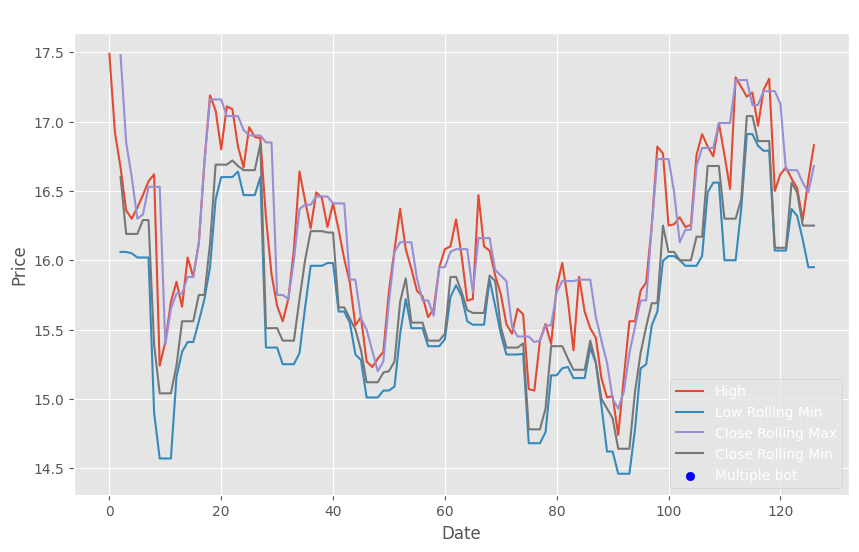

In [85]:
df_TIGO = get_stock_price_6m_volume('TIGO')


#df_TIGO  = df_TIGO.reset_index()
df = df_TIGO [['Date','Open','High','Low','Close','Volume']]
#Check if NA values are in data
df=df[df['Volume']!=0]
df.reset_index(drop=True, inplace=True)
df.isna().sum()
#---------------#############

df_2023_multitop = detect_multiple_bots(df)
df_2023_multitop = df_2023_multitop[df_2023_multitop['Date'].dt.year == 2023]
#print(df_2023_multitop.head(60))

# Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_2023_multitop.index, df_2023_multitop['High'], label='High')
plt.plot(df_2023_multitop.index, df_2023_multitop['low_roll_min'], label='Low Rolling Min')
plt.plot(df_2023_multitop.index, df_2023_multitop['close_roll_max'], label='Close Rolling Max')
plt.plot(df_2023_multitop.index, df_2023_multitop['close_roll_min'], label='Close Rolling Min')

# Mark Multiple Tops on the plot
multiple_top_indices = df_2023_multitop.index[df_2023_multitop['multiple_top_bottom_pattern'] == 'Multiple Top']
multiple_top_values = df_2023_multitop.loc[df_2023_multitop['multiple_top_bottom_pattern'] == 'Multiple Top', 'High']
plt.scatter(multiple_top_indices, multiple_top_values, color='blue', label='Multiple bot')

plt.title('Multiple Top Detection')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Something is wrong, for sure... But I can't seem to find out a way to fix it...

## Double Bot Detection Function

In [86]:
def detect_double_bot(df, window=3, threshold=0.05):
    # Define the rolling window
    roll_window = window
    # Define a threshold to check for the range of pattern
    range_threshold = threshold

    # Create a rolling window for High and Low
    df['high_roll_max'] = df['High'].rolling(window=roll_window).max()
    df['low_roll_min'] = df['Low'].rolling(window=roll_window).min()

    # Create a boolean mask for Double Top pattern
    #mask_double_top = (df['high_roll_max'] >= df['High'].shift(1)) & (df['high_roll_max'] >= df['High'].shift(-1)) & (df['High'] < df['High'].shift(1)) & (df['High'] < df['High'].shift(-1)) & ((df['High'].shift(1) - df['Low'].shift(1)) <= range_threshold * (df['High'].shift(1) + df['Low'].shift(1))/2) & ((df['High'].shift(-1) - df['Low'].shift(-1)) <= range_threshold * (df['High'].shift(-1) + df['Low'].shift(-1))/2)
    # Create a boolean mask for Double Bottom pattern
    mask_double_bottom = (df['low_roll_min'] <= df['Low'].shift(1)) & (df['low_roll_min'] <= df['Low'].shift(-1)) & (df['Low'] > df['Low'].shift(1)) & (df['Low'] > df['Low'].shift(-1)) & ((df['High'].shift(1) - df['Low'].shift(1)) <= range_threshold * (df['High'].shift(1) + df['Low'].shift(1))/2) & ((df['High'].shift(-1) - df['Low'].shift(-1)) <= range_threshold * (df['High'].shift(-1) + df['Low'].shift(-1))/2)

    # Create a new column for Double Top and Double Bottom pattern and populate it using the boolean masks
    df['double_pattern'] = np.nan
    #df.loc[mask_double_top, 'double_pattern'] = 'Double Top'
    df.loc[mask_double_bottom, 'double_pattern'] = 'Double Bottom'

    return df

## Double Bottom for JD

[*********************100%%**********************]  1 of 1 completed


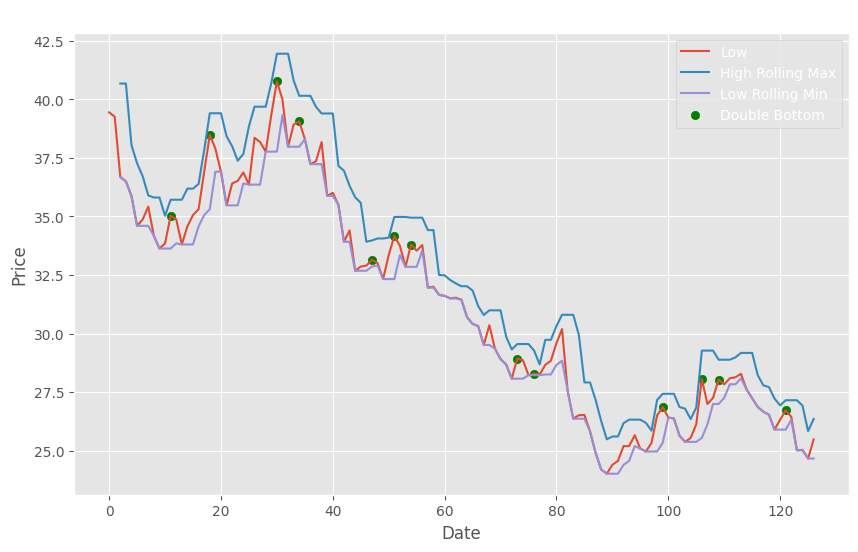

In [87]:
df_JD = get_stock_price_6m_volume('JD')


#df_JD  = df_JD.reset_index()
df = df_JD[['Date','Open','High','Low','Close','Volume']]
#Check if NA values are in data
df=df[df['Volume']!=0]
df.reset_index(drop=True, inplace=True)
df.isna().sum()

#print(df_with_channels.head(60))
#---------------#############

df_2023_doublebot = detect_double_bot(df)
df_2023_doublebot = df_2023_doublebot[df_2023_doublebot['Date'].dt.year == 2023]

#  Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_2023_doublebot.index, df_2023_doublebot['Low'], label='Low')
plt.plot(df_2023_doublebot.index, df_2023_doublebot['high_roll_max'], label='High Rolling Max')
plt.plot(df_2023_doublebot.index, df_2023_doublebot['low_roll_min'], label='Low Rolling Min')

# Mark Double Bottoms on the plot
double_bottom_indices = df_2023_doublebot.index[df_2023_doublebot['double_pattern'] == 'Double Bottom']
double_bottom_values = df_2023_doublebot.loc[df_2023_doublebot['double_pattern'] == 'Double Bottom', 'Low']
plt.scatter(double_bottom_indices, double_bottom_values, color='green', label='Double Bottom')

plt.title('Double Bottom Detection')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()
#df_2023_doubletop.head(50)

## Double Bottom for SJW

[*********************100%%**********************]  1 of 1 completed


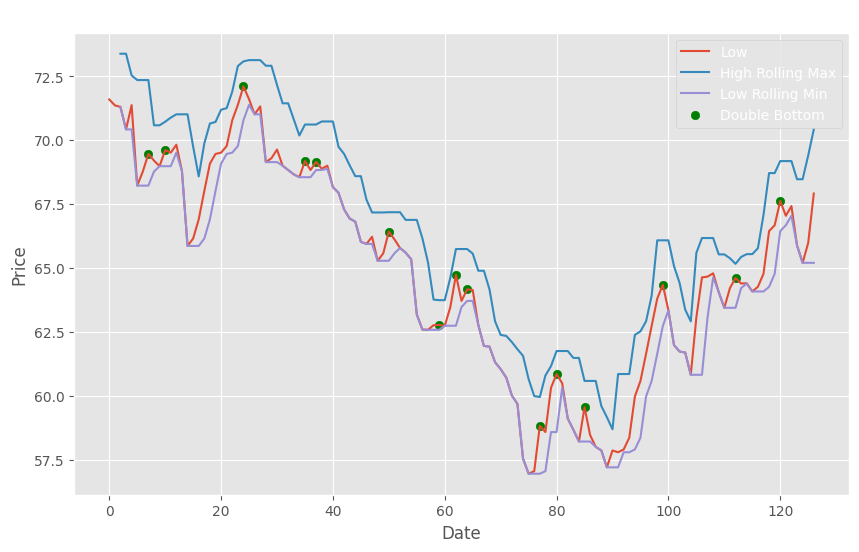

,Date,Open,High,Low,Close,Volume,high_roll_max,low_roll_min,double_pattern
0,2023-06-15,35.560001,36.599998,35.279999,36.560001,617000,NaN,NaN,NaN
1,2023-06-16,36.849998,36.950001,36.009998,36.410000,1581800,NaN,NaN,NaN
2,2023-06-20,36.290001,36.680000,36.070000,36.459999,623300,NaN,NaN,NaN
3,2023-06-21,36.189999,36.209999,35.389999,35.549999,544900,NaN,NaN,NaN
4,2023-06-22,35.369999,35.939999,35.169998,35.919998,533200,NaN,NaN,NaN
5,2023-06-23,35.340000,35.930000,35.080002,35.910000,810600,NaN,NaN,NaN
6,2023-06-26,35.680000,36.180000,35.080002,35.090000,449500,NaN,NaN,NaN
7,2023-06-27,35.250000,35.750000,34.919998,35.430000,349400,NaN,NaN,NaN
8,2023-06-28,35.470001,35.939999,35.459999,35.849998,342200,NaN,NaN,NaN
9,2023-06-29,35.869999,36.639999,35.830002,36.470001,451800,NaN,NaN,NaN


In [88]:
df_SJW = get_stock_price_6m_volume('SJW')


#df_SJW  = df_SJW.reset_index()
df = df_SJW[['Date','Open','High','Low','Close','Volume']]
#Check if NA values are in data
df=df[df['Volume']!=0]
df.reset_index(drop=True, inplace=True)
df.isna().sum()

#print(df_with_channels.head(60))
#---------------#############

df_2023_doublebot = detect_double_bot(df)
df_2023_doublebot = df_2023_doublebot[df_2023_doublebot['Date'].dt.year == 2023]

#  Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_2023_doublebot.index, df_2023_doublebot['Low'], label='Low')
plt.plot(df_2023_doublebot.index, df_2023_doublebot['high_roll_max'], label='High Rolling Max')
plt.plot(df_2023_doublebot.index, df_2023_doublebot['low_roll_min'], label='Low Rolling Min')

# Mark Double Bottoms on the plot
double_bottom_indices = df_2023_doublebot.index[df_2023_doublebot['double_pattern'] == 'Double Bottom']
double_bottom_values = df_2023_doublebot.loc[df_2023_doublebot['double_pattern'] == 'Double Bottom', 'Low']
plt.scatter(double_bottom_indices, double_bottom_values, color='green', label='Double Bottom')

plt.title('Double Bottom Detection')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()
df_2023_doubletop.head(50)

# Head and Shoulders Patter Detection Function

In [89]:
def detect_head_shoulder(df, window=3):
# Define the rolling window
    roll_window = window
    # Create a rolling window for High and Low
    df['high_roll_max'] = df['High'].rolling(window=roll_window).max()
    df['low_roll_min'] = df['Low'].rolling(window=roll_window).min()
    # Create a boolean mask for Head and Shoulder pattern
    mask_head_shoulder = ((df['high_roll_max'] > df['High'].shift(1)) & (df['high_roll_max'] > df['High'].shift(-1)) & (df['High'] < df['High'].shift(1)) & (df['High'] < df['High'].shift(-1)))
    # Create a boolean mask for Inverse Head and Shoulder pattern
    mask_inv_head_shoulder = ((df['low_roll_min'] < df['Low'].shift(1)) & (df['low_roll_min'] < df['Low'].shift(-1)) & (df['Low'] > df['Low'].shift(1)) & (df['Low'] > df['Low'].shift(-1)))
    # Create a new column for Head and Shoulder and its inverse pattern and populate it using the boolean masks
    df['head_shoulder_pattern'] = np.nan
    df.loc[mask_head_shoulder, 'head_shoulder_pattern'] = 'Head and Shoulder'
    df.loc[mask_inv_head_shoulder, 'head_shoulder_pattern'] = 'Inverse Head and Shoulder'
    return df 
    # return not df['head_shoulder_pattern'].isna().any().item()

## Head and Shoulders for OHI

[*********************100%%**********************]  1 of 1 completed


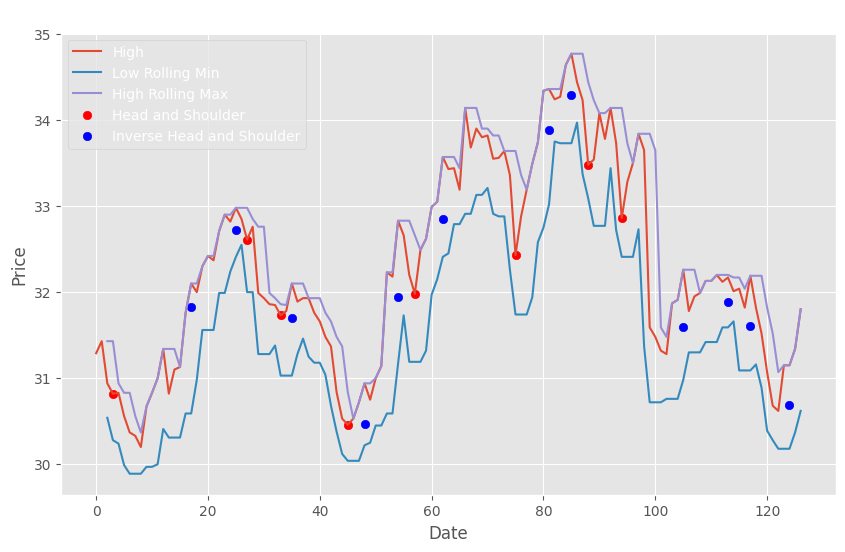

In [90]:
df_OHI = get_stock_price_6m_volume('OHI')
#df_OHI  = df_OHI.reset_index()
df = df_OHI [['Date','Open','High','Low','Close','Volume']]
#Check if NA values are in data
df=df[df['Volume']!=0]
df.reset_index(drop=True, inplace=True)
df.isna().sum()
#---------------#############

df_2023_hs = detect_head_shoulder(df)
df_2023_hs = df_2023_hs[df_2023_hs['Date'].dt.year == 2023]

plt.figure(figsize=(10, 6))
plt.plot(df_2023_hs.index, df_2023_hs['High'], label='High')
plt.plot(df_2023_hs.index, df_2023_hs['low_roll_min'], label='Low Rolling Min')
plt.plot(df_2023_hs.index, df_2023_hs['high_roll_max'], label='High Rolling Max')

# Mark Head and Shoulder patterns on the plot
head_shoulder_indices = df_2023_hs.index[df_2023_hs['head_shoulder_pattern'] == 'Head and Shoulder']
head_shoulder_values = df_2023_hs.loc[df_2023_hs['head_shoulder_pattern'] == 'Head and Shoulder', 'High']
plt.scatter(head_shoulder_indices, head_shoulder_values, color='red', label='Head and Shoulder')

# Mark Inverse Head and Shoulder patterns on the plot
inv_head_shoulder_indices = df_2023_hs.index[df_2023_hs['head_shoulder_pattern'] == 'Inverse Head and Shoulder']
inv_head_shoulder_values = df_2023_hs.loc[df_2023_hs['head_shoulder_pattern'] == 'Inverse Head and Shoulder', 'Low']
plt.scatter(inv_head_shoulder_indices, inv_head_shoulder_values, color='blue', label='Inverse Head and Shoulder')

plt.title('Head and Shoulder Pattern Detection')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

## Head and Shoulders for CYTK

[*********************100%%**********************]  1 of 1 completed


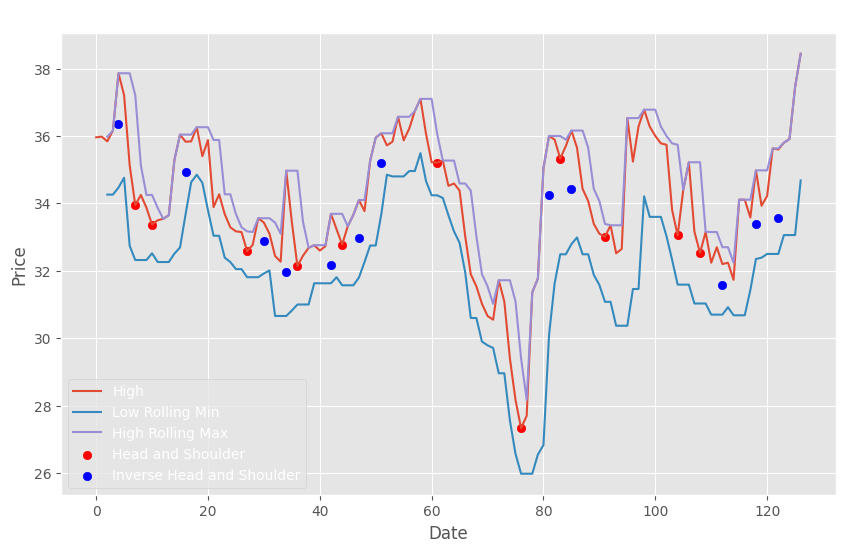

In [91]:
df_CYTK = get_stock_price_6m_volume('CYTK')
#df_CYTK  = df_CYTK.reset_index()
df = df_CYTK [['Date','Open','High','Low','Close','Volume']]
#Check if NA values are in data
df=df[df['Volume']!=0]
df.reset_index(drop=True, inplace=True)
df.isna().sum()
#---------------#############

df_2023_hs = detect_head_shoulder(df)
df_2023_hs = df_2023_hs[df_2023_hs['Date'].dt.year == 2023]

plt.figure(figsize=(10, 6))
plt.plot(df_2023_hs.index, df_2023_hs['High'], label='High')
plt.plot(df_2023_hs.index, df_2023_hs['low_roll_min'], label='Low Rolling Min')
plt.plot(df_2023_hs.index, df_2023_hs['high_roll_max'], label='High Rolling Max')

# Mark Head and Shoulder patterns on the plot
head_shoulder_indices = df_2023_hs.index[df_2023_hs['head_shoulder_pattern'] == 'Head and Shoulder']
head_shoulder_values = df_2023_hs.loc[df_2023_hs['head_shoulder_pattern'] == 'Head and Shoulder', 'High']
plt.scatter(head_shoulder_indices, head_shoulder_values, color='red', label='Head and Shoulder')

# Mark Inverse Head and Shoulder patterns on the plot
inv_head_shoulder_indices = df_2023_hs.index[df_2023_hs['head_shoulder_pattern'] == 'Inverse Head and Shoulder']
inv_head_shoulder_values = df_2023_hs.loc[df_2023_hs['head_shoulder_pattern'] == 'Inverse Head and Shoulder', 'Low']
plt.scatter(inv_head_shoulder_indices, inv_head_shoulder_values, color='blue', label='Inverse Head and Shoulder')

plt.title('Head and Shoulder Pattern Detection')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

## TASK 3. Modellings

In this task your goal is to build a simple linear model to predict `Close_180d_future_Percentage_Return`, while the feature used for the prediction are up to you *(it can include column you generated to solve **TASKS 1. and 2.**)*

1. Use a linear model scikit learn.


2. Don't spent too much time on it as the focus is on you showcasing how a model should be developed for such a problem.

3. Make sure you include details about how you evaluated the model, how well it performs, why did you make certain decisions.

4. **Stretch GOAL** - think about how you should do evaluation for this problem given the nature of the data (time series). What would be the best aproach for training and evaluation the model (using only what is available in scikit-learn)

# Task 3 Solution
To create a simple linear model to predict the `Close_180d_future_Percentage_Return` Dependent variable, we need to find out which other variable has a strong linear relationship with it.

Considering that this task has not mentioned on which stock I should build the linear model on, I will choose the one with the strongest correlation, from Task 1's Stretch goal. I will choose 1 stock with strong positive correlation, and 1 stock with strong negative correlation. 

Let's sort the stocks from Stretch Goal task 1 and see which stocks have the best correlations.

In [92]:
sorted_corrs = sorted(filtered_all_corr.items(), key=lambda x:x[1])
pd.DataFrame(sorted_corrs).tail()

""


In [93]:
pd.DataFrame(sorted_corrs).head()

""


I will choose `LIBY`, as a stock with a very high Negative correlation.

I will choose `CHAA` as a stock with a very high Positive correlation.

Let's get the required data for each of those stocks.

Also, we will remove all NaN values from now.

In [94]:
linear_LIBY_data = getdata('LIBY')
linear_LIBY_data.dropna(inplace=True)
linear_LIBY_data

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume,SMA_20,SMA_50,SMA_100,SMA_200,Close_180d_future,Close_180d_future_Percentage_Return,Close_SMA_20_PercentageDiff,Close_SMA_200_PercentageDiff,SMA_20_SMA_200_PercentageDiff
Date,,,,,,,,,,,,,,,
2022-10-11,10.070,10.08,10.070,10.080,10.080,800,10.05780,10.04106,10.02448,9.986940,10.84,7.539685,0.220724,0.931816,0.709526
2022-10-12,10.070,10.07,10.040,10.040,10.040,4500,10.05930,10.04032,10.02528,9.988040,10.84,7.968129,-0.191862,0.520222,0.713453
2022-10-13,10.040,10.04,10.040,10.040,10.040,0,10.06080,10.03922,10.02608,9.989190,10.84,7.968129,-0.206743,0.508650,0.716874
2022-10-14,10.040,10.04,10.040,10.040,10.040,0,10.06205,10.03822,10.02648,9.990190,10.85,8.067733,-0.219140,0.498589,0.719305
2022-10-17,10.030,10.04,10.030,10.040,10.040,1200,10.06355,10.03722,10.02688,9.991140,10.85,8.067733,-0.234012,0.489033,0.724741
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-06,10.510,10.54,10.510,10.540,10.540,6700,10.49225,10.44060,10.32667,10.182780,10.94,3.795063,0.455098,3.508079,3.039149
2023-04-10,10.535,10.54,10.530,10.530,10.530,10400,10.49625,10.44440,10.33107,10.185335,10.92,3.703707,0.321542,3.383931,3.052574
2023-04-11,10.540,10.54,10.535,10.535,10.535,2900,10.50050,10.44830,10.33552,10.187910,10.93,3.749411,0.328555,3.406880,3.068244


In [95]:
linear_CHAA_data = getdata('CHAA')
linear_CHAA_data.dropna(inplace=True)
linear_CHAA_data

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume,SMA_20,SMA_50,SMA_100,SMA_200,Close_180d_future,Close_180d_future_Percentage_Return,Close_SMA_20_PercentageDiff,Close_SMA_200_PercentageDiff,SMA_20_SMA_200_PercentageDiff
Date,,,,,,,,,,,,,,,
2022-01-14,9.78,9.780,9.73,9.750,9.750,6100,9.73950,9.74160,9.73084,9.726750,9.930,1.846157,0.107810,0.239032,0.131081
2022-01-18,9.73,9.730,9.73,9.730,9.730,4800,9.73900,9.74120,9.73184,9.726400,9.920,1.952729,-0.092415,0.037009,0.129543
2022-01-19,9.72,9.730,9.72,9.730,9.730,280700,9.73850,9.74140,9.73254,9.726450,9.935,2.106895,-0.087285,0.036494,0.123888
2022-01-20,9.72,9.720,9.72,9.720,9.720,600,9.73750,9.74080,9.73334,9.726250,9.920,2.057611,-0.179713,-0.064256,0.115665
2022-01-21,9.72,9.725,9.72,9.725,9.725,43800,9.73675,9.74030,9.73399,9.726075,9.918,1.984574,-0.120672,-0.011048,0.109756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-06,10.25,10.250,10.20,10.200,10.200,8500,10.25045,10.20968,10.13708,10.016755,11.120,9.019609,-0.492174,1.829383,2.333040
2023-04-10,10.20,10.200,10.20,10.200,10.200,0,10.24845,10.21088,10.13913,10.018705,11.130,9.117650,-0.472755,1.809563,2.293160
2023-04-11,10.20,10.200,10.20,10.200,10.200,0,10.24645,10.21208,10.14123,10.020630,11.130,9.117650,-0.453329,1.790005,2.253550


We don't need all of the data, but only 2 columns, specifically: `Close_180d_future_Percentage_Return` (the dependent variable) and `SMA_20_SMA_200_PercentageDiff` (the independent variable).

I will get each of them in a separate variable, so that we can run linear regression on them. 

In [96]:
X_LIBY = linear_LIBY_data[['SMA_20_SMA_200_PercentageDiff']]
y_LIBY =linear_LIBY_data[['Close_180d_future_Percentage_Return']]

In [97]:
X_LIBY

,SMA_20_SMA_200_PercentageDiff
Date,
2022-10-11,0.709526
2022-10-12,0.713453
2022-10-13,0.716874
2022-10-14,0.719305
2022-10-17,0.724741
...,...
2023-04-06,3.039149
2023-04-10,3.052574
2023-04-11,3.068244


In [98]:
X_CHAA = linear_CHAA_data[['SMA_20_SMA_200_PercentageDiff']]
y_CHAA = linear_CHAA_data[['Close_180d_future_Percentage_Return']]

Let's now plot each of them as a scatter plot, to see the linearity.

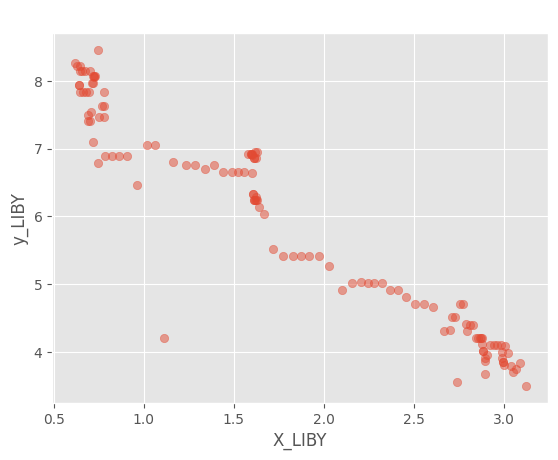

In [99]:
plt.scatter(X_LIBY, y_LIBY, alpha=0.5)
plt.title('Scatter Plot of X_LIBY vs y_LIBY')
plt.xlabel('X_LIBY')
plt.ylabel('y_LIBY')
plt.grid(True)
plt.show()

We can see that there is quite a high linearity in the data for LIBY. There are some outliers, but nothing too grave. This data is good for building a linear model.

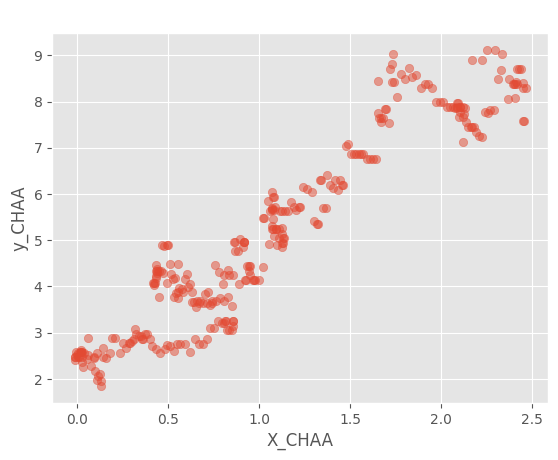

In [100]:
plt.scatter(X_CHAA, y_CHAA, alpha=0.5)
plt.title('Scatter Plot of X_CHAA vs y_CHAA')
plt.xlabel('X_CHAA')
plt.ylabel('y_CHAA')
plt.grid(True)
plt.show()

We can see the same linearity of data in this plot. This is also good to build a linear model. So let's build linear models.

In [101]:
from sklearn.linear_model import LinearRegression

In [102]:
lr_LIBY = LinearRegression()
lr_CHAA = LinearRegression()

No, we will perform a test/train split on our data, so we can some data samples that the model doesn't know. This way we will test how well the model will perform on previously unknown data. Since we got lots of data, we will keep 20% of the data in the test set. We will also shuffle the data before the split occurs.

In [103]:
from sklearn.model_selection import train_test_split
X_train_LIBY, X_test_LIBY, y_train_LIBY, y_test_LIBY = train_test_split(X_LIBY, y_LIBY, test_size=0.2, shuffle=True)
X_train_CHAA, X_test_CHAA, y_train_CHAA, y_test_CHAA = train_test_split(X_CHAA, y_CHAA, test_size=0.2, shuffle=True)

Now it's time to get the linear regression calculated for both stocks. Let's fit the model to the data!

In [104]:
X_train_LIBY.size

101

In [105]:
y_train_LIBY.size

101

In [106]:
lr_LIBY.fit(X_train_LIBY,y_train_LIBY)
lr_CHAA.fit(X_train_CHAA,y_train_CHAA)

LinearRegression()

# Model Evaluation
Now that we've trained the linear regression, we can evaluate how well they perform.

For the evaluation, we will use the coefficient of determination R^2 to see how well the model is fit.

After that, we will compute te y_predict, which are the predicted values for the test set. This will help us calculate the RMSE (Root mean squared error), so we can see what the deviation of the predicted values are from real values, when it comes to new, previously unseen data.

This will give us a good idea about how well the model will perform in production, on real data.

Let's start with LIBY.


## LIBY

In [107]:
r_sq_LIBY_train = lr_LIBY.score(X_train_LIBY, y_train_LIBY)
print("The Coefficient of determination for the TRAIN set of LIBY is:}",r_sq_LIBY_train)

r_sq_LIBY_test = lr_LIBY.score(X_test_LIBY, y_test_LIBY)
print("The Coefficient of determination for the TEST set of LIBY is:}",r_sq_LIBY_test)

The Coefficient of determination for the TRAIN set of LIBY is:} 0.949931194831931
The Coefficient of determination for the TEST set of LIBY is:} 0.8357375099146369


The result of the regression is not bad at all. We have a R^2 value of 0.90 on train set, and almost 0.96 on Test set. Let's plot the regression line to see how it looks. 

Let's now also evaluate the model using the RMSE (Root mean squared error) metric.

print("RMSE",np.sqrt(mean_squared_error(y_test,y_pred)))

In [108]:
from sklearn.metrics import mean_squared_error
#y_pred_LIBY = lr_LIBY.predict(X_test_LIBY)
#print("RMSE",np.sqrt(mean_squared_error(y_test_LIBY,y_pred_LIBY)))
mse = mean_squared_error(y_test_LIBY,y_pred_LIBY)
print(f'Mean Squared Error: {mse}')

NameError: name 'y_pred_LIBY' is not defined

The RMSE value of 0.08 tells us that the model is not perfectly fit on the data, but it is a pretty well fit, as the value is close to 0. This is not too bad of a value though, since it has quite a solid prediction, meaning that the deviation of the predicted values from the real values are not big. I could try performing some more optimization for the model. However, that is not the purpose of this task, so I will move on.

As a final step, let's plot and fit the regression line, so we see, visually, what it looks like.

In [ ]:
plt.scatter(X_train_LIBY, y_train_LIBY, alpha=0.5)
plt.title('Regression Plot of X_LIBY vs y_LIBY on TRAIN set')
plt.plot(X_train_LIBY, lr_LIBY.predict(X_train_LIBY), color='red', label='Regression line')
plt.xlabel('X_LIBY')
plt.ylabel('y_LIBY')
plt.grid(True)
plt.show()

In [ ]:
plt.scatter(X_test_LIBY, y_test_LIBY, alpha=0.5)
plt.title('Regression Plot of X_LIBY vs y_LIBY on TEST set')
plt.plot(X_test_LIBY, lr_LIBY.predict(X_test_LIBY), color='red', label='Regression line')
plt.xlabel('X_LIBY')
plt.ylabel('y_LIBY')
plt.grid(True)
plt.show()

The regression line is very well fit on both the TRAIN and the TEST sets, as can be seen from the plots above.



## CHAA

In [ ]:
r_sq_CHAA_train = lr_CHAA.score(X_train_CHAA, y_train_CHAA)
print("The Coefficient of determination for the TRAIN set of CHAA is:}",r_sq_CHAA_train)

r_sq_CHAA_test = lr_CHAA.score(X_test_CHAA, y_test_CHAA)
print("The Coefficient of determination for the TEST set of CHAA is:}",r_sq_CHAA_test)

The result is not bad, however it is a lot worse model when it comes to prediction, than the previous one, which was fit on LIBY data.

In [ ]:
from sklearn.metrics import mean_squared_error

mse = mean_squared_error(y_test_CHAA,y_pred_CHAA)
print(f'Mean Squared Error: {mse}')

Ouch, the MSE error of this model is quite high, at 0.50. Much worse than for the LIBY stock.

In [ ]:
plt.scatter(X_train_CHAA, y_train_CHAA, alpha=0.5)
plt.title('Regression Plot of X_CHAA vs y_CHAA on TRAIN set')
plt.plot(X_train_CHAA, lr_CHAA.predict(X_train_CHAA), color='red', label='Regression line')
plt.xlabel('X_CHAA')
plt.ylabel('y_CHAA')
plt.grid(True)
plt.show()

In [ ]:
plt.scatter(X_test_CHAA, y_test_CHAA, alpha=0.5)
plt.title('Regression Plot of X_CHAA vs y_CHAA on TEST set')
plt.plot(X_test_CHAA, lr_CHAA.predict(X_test_CHAA), color='red', label='Regression line')
plt.xlabel('X_CHAA')
plt.ylabel('y_CHAA')
plt.grid(True)
plt.show()

## Stretch goal

If we want to get better results that what we got using the linear regression model, we need to use some stronger algorithms. There are few methods in which we can solve this, that I will briefly mention and explain below, and then proceed to implement them.
1. I could use a **Random Forest ML model**, that will surely provide some better prediction than the linear model.
2. I could try implementing **Gradient Boosting**. The intuition of this ensemble algorithm is that the best possible next model, when combined with previous models, minimizes the overall prediction error. The key idea is to set the target outcomes for this next model in order to minimize the error.
3. I could also use **XGBoost** which is an extremely powerful machine learning algorithm that can handle both regression and classification tasks, making it suitable for time series forecasting. I've seen this method, alongside Gradient Boosting, win a lot of Kaggle competitions with the best prediction (even better than Neural Networks/Deep Learning approaches).
4. Last, but surely not least, we could use a **specialized time-series model such as ARIMA (AutoRegressive Integrated Moving Average)**.

However, since this stretch goal task requires me to use only scikit-learn, I will only solve the problem using the first 2 points, which are Random Forest,  and Gradient Boosting.

Also, it's important to state that I need to include more variables, so that Random Forest can actually learn to predict the dependent variable.  Having only 2 variables works well  for linear regression, but it won't work that well for random forest. That's why I will add all of the variables in the dataset when building the RandomForest and the Gradient Boosting models.

I realise that this may be overkill - but it's the best way to ensure the model get's all the important data.

I could also move towards the approach of analysing how much each variable is correalted to the Dependent variable, and only keep the variables that have a correlation over a certain treshold. However, in the case of stock market prediction, all of them may contribute in improving the accuracy of the model, and decrease de RMSE score.

P.S: I will build models only for both the LIBY and CHAA stocks.
### Solving using Random Forest for LIBY

In [ ]:
# Importing all required libraries for all 2 methods
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import GradientBoostingRegressor


In [ ]:

# Load your dataset (replace 'your_dataset.csv' with your actual file)
df = getdata('LIBY')

# Assuming 'Date' is your time series index, sort the DataFrame by date
#Remove missing data
df.dropna(inplace=True)
df.reset_index(inplace=True)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')
df = df.sort_index()


# Features and target variable
features = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_200',
            'Close_180d_future', 'Close_180d_future_Percentage_Return', 'Close_SMA_20_PercentageDiff',
            'Close_SMA_200_PercentageDiff', 'SMA_20_SMA_200_PercentageDiff']

X = df[features]
y = df['Close_180d_future_Percentage_Return']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Create and fit the Random Forest model using scikit-learn API
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Plot the predictions vs actual values
plt.figure(figsize=(10, 6))
plt.plot(y_test.index, y_test.values, label='Actual Values')
plt.plot(y_test.index, y_pred, label='Predicted Values')
plt.title('Time Series Prediction with Random Forest (scikit-learn API)')
plt.xlabel('Date')
plt.ylabel('Close_180d_future_Percentage_Return')
plt.legend()
plt.show()

As it can be seen from the graph above, the model does a pretty good job at predicting the value of the dependent variable `Close_180d_future_Percentage_Return`. It also have an incredibly low RMSE, compared to the 0.25 we've seen in the linear regression model - now the score is 0.07, a huge improvement.

Let's see the boosting method for predicting LIBY.

### Boosting on LIBY

In [ ]:


# Load your dataset (replace 'your_dataset.csv' with your actual file)
df = getdata('LIBY')

# Assuming 'Date' is your time series index, sort the DataFrame by date
#Remove missing data
df.dropna(inplace=True)
df.reset_index(inplace=True)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')
df = df.sort_index()

# Features and target variable
features = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_200',
            'Close_180d_future', 'Close_180d_future_Percentage_Return', 'Close_SMA_20_PercentageDiff',
            'Close_SMA_200_PercentageDiff', 'SMA_20_SMA_200_PercentageDiff']

X = df[features]
y = df['Close_180d_future_Percentage_Return']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Create and fit the Gradient Boosting model using scikit-learn API
model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Plot the predictions vs actual values
plt.figure(figsize=(10, 6))
plt.plot(y_test.index, y_test.values, label='Actual Values')
plt.plot(y_test.index, y_pred, label='Predicted Values')
plt.title('Time Series Prediction with Gradient Boosting (scikit-learn API)')
plt.xlabel('Date')
plt.ylabel('Close_180d_future_Percentage_Return')
plt.legend()
plt.show()



Wohoho, this model performs **even better**! It can clearly be seen in the graph above, and also in the (once again) reduction in MSE.

Thus, we can conclude that the best model in our case (which we can build using Scikit-Learn) is the Boosting model. It predicts our dependent variable the best, and has the lowest error!

Let's now check how these models perform on CHAA. I predict with high certainty, even before creating the models, that there will be a MAJOR improvement in error for this stock - as the Linear Model clearly didn't capture the patterns needed to predict this stock.

### Random Forest for CHAA

In [ ]:

# Load your dataset (replace 'your_dataset.csv' with your actual file)
df = getdata('CHAA')

# Assuming 'Date' is your time series index, sort the DataFrame by date
#Remove missing data
df.dropna(inplace=True)
df.reset_index(inplace=True)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')
df = df.sort_index()


# Features and target variable
features = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_200',
            'Close_180d_future', 'Close_180d_future_Percentage_Return', 'Close_SMA_20_PercentageDiff',
            'Close_SMA_200_PercentageDiff', 'SMA_20_SMA_200_PercentageDiff']

X = df[features]
y = df['Close_180d_future_Percentage_Return']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Create and fit the Random Forest model using scikit-learn API
model = RandomForestRegressor(n_estimators=1000, random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Plot the predictions vs actual values
plt.figure(figsize=(10, 6))
plt.plot(y_test.index, y_test.values, label='Actual Values')
plt.plot(y_test.index, y_pred, label='Predicted Values')
plt.title('Time Series Prediction with Random Forest (scikit-learn API)')
plt.xlabel('Date')
plt.ylabel('Close_180d_future_Percentage_Return')
plt.legend()
plt.show()

Already the MSE error was cut in half, compared to the linear model. Instead of 0.50 is around 0.24.

### BOosting method for CHAA

In [ ]:


# Load your dataset (replace 'your_dataset.csv' with your actual file)
df = getdata('CHAA')

# Assuming 'Date' is your time series index, sort the DataFrame by date
#Remove missing data
df.dropna(inplace=True)
df.reset_index(inplace=True)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')
df = df.sort_index()

# Features and target variable
features = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_200',
            'Close_180d_future', 'Close_180d_future_Percentage_Return', 'Close_SMA_20_PercentageDiff',
            'Close_SMA_200_PercentageDiff', 'SMA_20_SMA_200_PercentageDiff']

X = df[features]
y = df['Close_180d_future_Percentage_Return']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Create and fit the Gradient Boosting model using scikit-learn API
model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Plot the predictions vs actual values
plt.figure(figsize=(10, 6))
plt.plot(y_test.index, y_test.values, label='Actual Values')
plt.plot(y_test.index, y_pred, label='Predicted Values')
plt.title('Time Series Prediction with Gradient Boosting (scikit-learn API)')
plt.xlabel('Date')
plt.ylabel('Close_180d_future_Percentage_Return')
plt.legend()
plt.show()



The MSE was improved once more, using the Boosting model. From 0.25 it was reduced to 0.18.

I would bet that if I used the XGboost, that error would reduce even further.

# END OF SOLUTION

## EVALUATION CRITERIA

Each of the

*   Ideally you should address each task in your solution
*   For each task you have **mandatory** subtasks and you have **Stretch GOALs** which are marked accordingly
*  Always do the mandatory tasks first
*  The **Stretch GOALs** are designed to be more challenging and to help us decided between similar candidates. We'd prefer you to solve all the mandatory subtasks for all 3 tasks over solving 2 tasks in full (including the **Stretch GOALs**) and leaving the third task unadressed.
* There is room for interpretation and creativity on your side. That being said DO document your decisions in markdown cells.
* Please included additional instruction on how to run the solution/any packages needed


